# Detecção e segmentação de placas de carros utilizando transafer-learning e MobileNetV2


# Instalação de bibliotecas

In [ ]:
# !pip install tensorflow==2.13.1
# !pip install keras==2.13.0
!pip install --upgrade keras-cv
!pip install -U scikit-learn




     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 51.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 81.2 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Mon Jul  8 23:49:43 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0              41W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [ ]:
import sys
print(sys.version_info)

sys.version_info(major=3, minor=10, micro=12, releaselevel='final', serial=0)


# Importar biblioteca

In [ ]:
import numpy as np
import pandas as pd
import cv2
import gc
from random import randint
from random import seed
from datetime import datetime
import math
import shutil
import os


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.layers import Dense, Flatten, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping
# from tensorflow.keras.callbacks import TensorBoard

In [ ]:
from keras.optimizers import SGD,  Adam,  AdamW,  Nadam, RMSprop, Adamax

from keras_cv.losses import GIoULoss, IoULoss, CIoULoss
from keras_cv.src.api_export import keras_cv_export
from keras_cv.src.backend import keras

# pip install k-fold-imblearn
from sklearn.model_selection import KFold

Using TensorFlow backend


# Conectando ao GDrive

In [ ]:
#  para rodar no GColab
import os
import sys

from google.colab import drive
drive.mount('/content/drive')
# Alterar conforme necessário
sys.path.append('/content/drive/MyDrive/MY-PATH/')
os.chdir('/content/drive/MyDrive/MY-PATH/')
# path do dataset (https://web.inf.ufpr.br/vri/databases/ufpr-alpr/) 
DIR_RAIZ = './UFPR-ALPR/'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Funções utils

## Funçoes para preparação dos dados

In [ ]:
def fazer_quadrado(img):
   """
   Função para deixar uma imagem quadrada acresentando pixeis pretos

   Parâmetros:
   - img: numpy.ndarray[m, n, 3]

   Retorna:
   - numpy.ndarray com dimenção [m, n, 3]
   """
   # Obtendo o lado maior da imagem
   s = max(img.shape[0:2])
   # Criando um quadrado escuro com NUMPY
   f = np.zeros((s,s,3),np.uint8)
   # Copia a imagem para o quadrado
   f[0:img.shape[0],0:+img.shape[1]] = img
   return f

def pre_processar_imagem(img, dst_image_path, INPUT_WIDTH=224):
   """
   Função para prepara a imaem e gravar em um novo destino

   Parâmetros:
   - img: numpy.ndarray[m, n, 3]
   - dst_image_path: str, cainho omde deve gravar a imagem

   Retorna:
   - a taxa/porcentagem de redimencionamento
   """
   hh, ww, dd =  img.shape
   s = max(ww, hh)
   # calcula a taxa de redimencionamento
   tax = INPUT_WIDTH/s
   # altera o tamanho da imagem
   img = cv2.resize(img, (math.ceil(ww*tax), math.ceil(hh*tax)), cv2.INTER_AREA)
   # preenche a imagem para ficar quadrada
   img = fazer_quadrado(img)
   # grava no destio
   cv2.imwrite(dst_image_path ,img)
   return tax


def get_anotacao_placa(anot_file_name, tax, line_pos_lp=7, line_v_type=2, line_lp=6):
   """
   Função para para extrair a anotação da placa

   Parâmetros:
   - anot_file_name: path do arquivo de anotaçoes
   - tax: a taxa/porcentagem de redimencionamento da imagem

   Retorna:
   - (x1, y1, x2, y2): cordenadas no formato XYXY
   """
   Lines = []
   # abre o arquivo de anotação
   with open(anot_file_name, 'r') as anot_file:
      # pega todas as linhas
      Lines = anot_file.readlines()
   # obtem o tipo do veiculo
   veiclei_type = Lines[line_v_type].strip().split(":")[1].strip()
   # obtem a placa
   plate = Lines[line_lp].strip().split(":")[1].strip()
   # obtem da linha 7 as coordenadas no formato xyWH
   x, y, w, h = Lines[line_pos_lp].strip().split(":")[1].strip().split(" ")
   #  converte as coordenadas para o novo tamanho da imagem
   nh, nw = math.ceil(int(h) * tax), math.ceil(int(w) * tax)
   nx, ny = int(int(x)* tax), int(int(y)* tax)

   # converte as anotaçoes para cordenadas para o formato XYXY
   x1, x2, y1, y2 = nx, nx + nw, ny, ny + nh
   return (x1, y1, x2, y2, veiclei_type, plate )

def enquadrar_veiculo_nova_img(anot_file_name, img, dest_veicle_img, line_veicle=1, line_pos_lp=7):
   """
   Cria auma nova imagem enquadrando o veiculo e retorna a notação da placa nessa imagem

   Parâmetros:
   - anot_file_name: path do arquivo de anotaçoes
   - img: numpy.ndarray[m, n, 3], Imagem para recortar
   - dest_veicle_img: str, caminho para gravar a imagem

   Retorna:
   - (x1, y1, x2, y2): coordenadas da placa
   """
   Lines = []
   # abre o arquivo de anotação
   with open(anot_file_name, 'r') as anot_file:
      # pega todas as linhas do arquivo de anotação
      Lines = anot_file.readlines()
   # seleciona a linha da placa e obtem as coordenadas no formato xyWH
   x, y, w, h = Lines[line_pos_lp].strip().split(":")[1].strip().split(" ")
   x, y, w, h = int(x), int(y), int(w), int(h)
   # seleciona a linha do veículo e  obtem as coordenadas no formato xyWH
   vx, vy, vw, vh = Lines[line_veicle ].strip().split(":")[1].strip().split(" ")
   vx, vy, vw, vh = int(vx), int(vy), int(vw), int(vh)


   A, L, _= img.shape
   if( vw> vh and vy+vw< A):
      diff = int( (vw-vh)/2 )
      if(vy-diff>0):
         vy -= diff
         vh += diff
      if(vy+vh+diff < A):
         vh += diff
   elif( vh> vw and vx+vh< L):
      diff = int( (vh-vw)/2 )
      if(vx-diff>0):
         vx -= diff
         vw += diff
      if(vx+vw+diff < L):
         vw += diff

   newd = int(img.shape[0]*0.4)
   if(vw < newd):
      diff = int((newd - vw)/2)
      if vx-diff > 0:
         vx = vx- diff
         vw = vw+diff
      if vx+vw+diff < L:
         vw = vw + diff
      diff = int((newd - vh)/2)
      if vy-diff > 0:
         vy = vy- diff
         vh = vh+diff
      if vy+vh+diff < A:
         vh = vh + diff

   vx,vy,vw,vh = int(vx), int(vy), int(vw), int(vh)
   #  ajusta as cordenadas da placa como referencia ao veículo
   x1 = x - vx
   y1 = y - vy
   x2 = x1+w
   y2 = y1+h

   # recorta o veículo dentro da imagem
   img = img[vy:vy+vh, vx:vx+vw, :]
   tax = pre_processar_imagem(img, dest_veicle_img)

   x1, y1, x2, y2 = x1* tax, y1*tax, x2*tax, y2* tax
   x1, y1, x2, y2 = math.ceil(x1), math.ceil(y1), math.ceil(x2), math.ceil(y2)
   if(x1<0):
      x1=0
   if(y1<0):
      y1=0

   return (x1, y1, x2, y2)

def processar_dataset(pathorigin, pathdest, ind_super_aumento=False):
   print('processar_dataset(',pathorigin,',', pathdest,')')
   # cria um data frame para guaradar as anotaçoes
   df = pd.DataFrame(columns=['filepath','xmin','ymin','xmax', 'ymax', 'x1', 'y1', 'x2', 'y2', 'type', 'plate', 'variation'] )
   nivel = 0
   c1 = 0
   for (dirpath, dirnames, filenames) in os.walk(pathorigin):
      #  descarta primeiro nível
      if nivel == 0:
         nivel +=1
         continue

      #  para cada arquivo
      for file in filenames:
         # segue se for uma imagem
         if not file.endswith(".png"):
               continue
         # Monta o arquivo de destino
         dst_image_path = os.path.join(pathdest,file)
         # Monta o arquivo de origem
         origin_image_path = os.path.join(dirpath, file)
         # Arquivo de anotaçoes
         anot_file_name = os.path.join(dirpath, file.split(".")[0]+".txt")
         # se o arquivo de anotaçoes existe
         if not os.path.exists(anot_file_name):
             continue
         # utiliza a função imread do pacote OpenCv
         # para carregar a imagem em momória
         img = cv2.imread(origin_image_path)
         #  processa a imagem e retorna a taxa de redimencionamento
         tax = pre_processar_imagem(img.copy(), dst_image_path)
         #  obtem as anotaçoes da placa já redimencionadas
         x1, y1, x2, y2, veiclei_type, plate = get_anotacao_placa(anot_file_name, tax)
         # gurda a anotação e o destino da imagem em um data-frame
         df.loc[len(df)] = np.array([file, x1, y1, x2, y2,x1/224, y1/224, x2/224, y2/224, veiclei_type, plate, 1])
         if(ind_super_aumento):
            img_1 = cv2.imread(dst_image_path)
            dest_img = dst_image_path[0:-4]+"_1"+dst_image_path[-4:]
            img_1 = cv2.flip(img_1, 1)
            img_1 = cv2.blur(img_1, (1,3))
            # grava no destio
            cv2.imwrite(dest_img ,img_1)
            A, L, _= img_1.shape
            x2_ = L-x1-1
            x1_ = L-x2
            x1,x2 = x1_,x2_
            df.loc[len(df)] = np.array([dest_img.split("/")[-1], x1, y1, x2, y2,x1/224, y1/224, x2/224, y2/224, veiclei_type, plate, 2])

         dest_veicle_img = dst_image_path[0:-4]+"_2"+dst_image_path[-4:]
         #  aumenta a base criando uma nova imagem do enquadramento do veículo
         x1, y1, x2, y2 = enquadrar_veiculo_nova_img(anot_file_name, img,
                                                     dest_veicle_img)

         df.loc[len(df)] = np.array([dest_veicle_img.split("/")[-1], x1, y1, x2, y2,x1/224, y1/224, x2/224, y2/224, veiclei_type, plate, 2])

         if(ind_super_aumento):
            img = cv2.imread(dest_veicle_img)
            dest_img = dst_image_path[0:-4]+"_2_2"+dst_image_path[-4:]
            img = cv2.flip(img, 1)
            img = cv2.blur(img, (1,3))
            # grava no destio
            cv2.imwrite(dest_img ,img)
            A, L, _= img.shape
            x2_ = L-x1-1
            x1_ = L-x2
            x1,x2 = x1_,x2_
            df.loc[len(df)] = np.array([dest_img.split("/")[-1], x1, y1, x2, y2,x1/224, y1/224, x2/224, y2/224, veiclei_type, plate, 2])



   #  exporta o data-frame para um arquivo CSV
   dest_csv_file = os.path.join(pathdest, "labels.csv")
   df.to_csv(dest_csv_file, index=False )





## funçoes para carregar o datase em memoria

In [ ]:

def carregar_ds(csv_path, rootpath="", TARGET_SIZE=(224,224) ):
   '''
   Carrega as imagem e anotaçoes do CSV  e normaliza para ao intervalo [0,1].

   Parâmetros:
   - csv_path: caminho para o CSV de anotaçoes

   Retorna:
   - (X, Y): Imagem e Dominio,
      onde X são as imagens de carros
      e Y são as anotaçoes
   '''
   #  carrega o CSV para um data-frame
   df_train = pd.read_csv(csv_path)
   #  separar as coordenadas
   labels = df_train.iloc[:,0:].values
   #  separar os caminhos das imagens
   lst_images_path = list(df_train['filepath'])
   X, Y = [], []
   Meta = pd.DataFrame(columns=['type', 'variation', 'imgfile', 'xmin', 'ymin','xmax','ymax',  'nxmin', 'nymin','nxmax','nymax'] )
   for ind in range(len(lst_images_path)):
      image_path = f'{rootpath}/{lst_images_path[ind]}'
      #  carrega a imagem com o OpenCv
      img_arr = cv2.imread(image_path)
      # Obtem as dimencoes da image,
      h, w, _ = img_arr.shape
      # Carrega a imagem com a funcao load_img do modulo tensorflow
      load_image = load_img(image_path,target_size=TARGET_SIZE)
      # Converter imagem para array com img_to_array do modulo tensorflow
      load_image_arr = img_to_array(load_image)
      # Normalizar para o intervalo [0,1]
      norm_load_image_arr =  load_image_arr/255.0
      # Normaliza as coordenadas para o intervalo [0,1]
      imgfile, xmin, ymin,xmax,ymax,  nxmin, nymin,nxmax,nymax, vtype,_,variation = labels[ind]

      label_norm = (nxmin, nymin,nxmax,nymax)

      X.append(norm_load_image_arr)
      Y.append(label_norm)
      Meta.loc[len(Meta)] = np.array([vtype[0:1],variation, imgfile, xmin, ymin,xmax,ymax,  nxmin, nymin,nxmax,nymax ])
   X = np.array(X,dtype=np.float32)
   Y = np.array(Y,dtype=np.float32)
   return (X, Y, Meta)




# Dataset
O dataset seguem a seguinte organização:   
./data_images/test/   
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;labels.csv   
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;track0091[01].png   
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;track0091[01]_2.png   
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;...   
./data_images/train/     
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;labels.csv   
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;track0001[01].png   
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;track0001[01]_2.png   
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;...   
./data_images/valid/     
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;valid/labels.csv   
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;valid/track0061[01].png   
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;valid/track0061[01]_2.png  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;...   
   
As imagens originais continham tamanho de 1920x1080. Cada imagem era acompanhada de um arquivo de texto, esse arquivo continha varias informaçoes, entre elas a localização do carro e da placa.    

As imagens fora preenchidas para ficar com dimençoes quadraticas e então redimencionadas para 640x640. A localição da placa foi convertida apra um novo padrao e então essas informaçoes foram carregadas para um arquivo CSV.   

O dataset foi aumentado. O processo para almentar o dataset consiste em recortar a imagem do carro e gerar uma nova imagem somente com a imagem do carro.



# Normalização dos dados
As imagens presisão ser convertidadas para o tamanho 224x244.   
Já os dados de localização das placas precisam ser normalizados para um intervalo de 0 a 1.





   

# Pré-rocessamento do datase



## Processar

In [ ]:


# apaga a pasta de destino e todos seus os arquivos
if os.path.exists(f'{DIR_RAIZ}data_images'):
    shutil.rmtree(f'{DIR_RAIZ}data_images/')

os.makedirs(f'{DIR_RAIZ}data_images')
os.makedirs(f'{DIR_RAIZ}data_images/test')
os.makedirs(f'{DIR_RAIZ}data_images/train')
os.makedirs(f'{DIR_RAIZ}data_images/valid')

processar_dataset(f'{DIR_RAIZ}images/validation/', f'{DIR_RAIZ}data_images/valid')
processar_dataset(f'{DIR_RAIZ}images/testing/'   , f'{DIR_RAIZ}data_images/test' )
processar_dataset(f'{DIR_RAIZ}images/training/'  , f'{DIR_RAIZ}data_images/train')






processar_dataset( ./UFPR-ALPR/images/validation/ , ./UFPR-ALPR/data_images/valid )
processar_dataset( ./UFPR-ALPR/images/testing/ , ./UFPR-ALPR/data_images/test )
processar_dataset( ./UFPR-ALPR/images/training/ , ./UFPR-ALPR/data_images/train )


## Carregar em memória

In [ ]:
import pickle
VERSAO_DS = ''
file_data_treino = f'{DIR_RAIZ}/my_data_pars{VERSAO_DS}.txt'
file_data_teste = f'{DIR_RAIZ}/my_data_pars_teste{VERSAO_DS}.txt'
file_data_valid = f'{DIR_RAIZ}/my_data_pars_valid{VERSAO_DS}.txt'


print(file_data_treino,  os.path.isfile(file_data_treino) )
print(file_data_teste, os.path.isfile(file_data_teste) )
print(file_data_valid,  os.path.isfile(file_data_valid) )

def carregar_memoria(file_csv, file_cache, ):
    print(file_csv,  os.path.isfile(file_csv) )
    print(file_cache,  os.path.isfile(file_cache) )
    if not os.path.isfile(file_cache)  :
        xdfdefdf.fdfdfd()
        X, Y = carregar_ds(file_csv)

        my_data = (X,Y)
        f=open(file_cache,"wb")
        pickle.dump(my_data,f)
        print('Gravou no arquivo treino')
        X,Y = None, None
        f.close()
    f=open(file_cache,"rb")
    my_data=pickle.load(f)
    f.close()
    X, Y= my_data
    print('X =',X.shape)
    print('Y =',Y.shape)
    return X, Y

x_train, y_train  = carregar_memoria(f'{DIR_RAIZ}data_images/train/labels.csv', f'{DIR_RAIZ}my_data_pars{VERSAO_DS}.txt')
x_test, y_test  = carregar_memoria(f'{DIR_RAIZ}data_images/test/labels.csv', f'{DIR_RAIZ}my_data_pars_teste{VERSAO_DS}.txt')
x_valid, y_valid  = carregar_memoria(f'{DIR_RAIZ}data_images/valid/labels.csv', f'{DIR_RAIZ}my_data_pars_valid{VERSAO_DS}.txt')

gc.collect()
print('------')
print('X tranin=',x_train.shape)
print('Y tranin=',y_train.shape)
print('X teste=',x_test.shape)
print('Y teste=',y_test.shape)
print('X valide=',x_valid.shape)
print('Y valide=',y_valid.shape)




./UFPR-ALPR//my_data_pars.txt True
./UFPR-ALPR//my_data_pars_teste.txt True
./UFPR-ALPR//my_data_pars_valid.txt True
./UFPR-ALPR/data_images/train/labels.csv True
./UFPR-ALPR/my_data_pars.txt True


KeyboardInterrupt: 

In [ ]:
print('X tranin=',x_train.shape)
print('Y tranin=',y_train.shape)
print('X teste=',x_test.shape)
print('Y teste=',y_test.shape)


print('X valide=',x_valid.shape)
print('Y valide=',y_valid.shape)

X tranin= (3598, 224, 224, 3)
Y tranin= (3598, 4)
X teste= (3600, 224, 224, 3)
Y teste= (3600, 4)
X valide= (1800, 224, 224, 3)
Y valide= (1800, 4)


# Modelo

In [ ]:

def get_modelo(weights="imagenet"):
    '''
    tf.keras.applications.MobileNetV2(
        input_shape=None,   # Tupla de forma opcional, a ser especificada apenas se include_top for False (caso contrário, a forma de entrada deve ser (224, 224, 3)
        alpha=1.0,          # Controla a largura da rede.
        include_top=True,   # se deve incluir a camada totalmente conectada no topo da rede. O padrão é Verdadeiro.
        weights='imagenet',
        input_tensor=None,  # Tensor Keras opcional (ou seja, saída de camadas.Input()) para usar como entrada de imagem para o modelo.
        pooling=None,       # Modo de pooling opcional para extração de recursos quando include_top for False. None, avg, max
        classes=1000,
        classifier_activation='softmax'
    )
    '''

    #  Instanciar o MobileNetV2
    mobile_net = MobileNetV2(weights=weights,include_top=False,
                                        input_tensor=Input(shape=(224,224,3)))
    mobile_net.trainable=False
    # ---------------------
    headmodel = mobile_net.output
    headmodel = Flatten()(headmodel)

    headmodel = Dense(128, activation="relu")(headmodel)
    headmodel = Dense(64, activation="relu")(headmodel)
    headmodel = Dense(32, activation="relu")(headmodel)
    headmodel = Dense(4, activation="sigmoid")(headmodel)
    # ---------- model
    model = Model(inputs=mobile_net.input,outputs=headmodel)
    return model





## Funções de perda

In [ ]:
# Clear all previously registered custom objects
keras.saving.get_custom_objects().clear()

@keras_cv_export("keras_cv.losses.MGIoULoss" )
class MGIoULoss(GIoULoss):
    def __init__(self, bounding_box_format, axis=-1, mult=100,  **kwargs):
        super().__init__(bounding_box_format, axis, **kwargs)
        self.mult = mult

    def call(self, y_true, y_pred, sample_weight=None):
        # print('**', self.mult)
        loss =  super().call(y_true*self.mult, y_pred*self.mult, sample_weight)
        if(loss/2 < 0 ):
            return loss * - 1 + 1
        return loss

@keras_cv_export("keras_cv.losses.MCIoULoss" )
class MCIoULoss(CIoULoss):
    def __init__(self, bounding_box_format, eps=1e-7, mult=100,  **kwargs):
        super().__init__(bounding_box_format,  eps=eps, **kwargs)
        self.mult = mult

    def call(self, y_true, y_pred):
        # print('**', self.mult)
        loss =  super().call(y_true*self.mult, y_pred*self.mult)

        if( not isinstance(loss, tf.Tensor ) and loss < 0):
            return loss * - 1 + 1
        return loss

In [ ]:
# testes das funçoes
b1 = tf.constant([[10/224, 10/224, 13/224 ,12/224]])
b2 = tf.constant([[11/224, 10/224, 14/224 ,15/224]])
b3 = tf.constant([[10/224, 12/224, 15/224 ,30/224]])
print("Dados não normalizasdos:")
gloss = GIoULoss(bounding_box_format = "XYXY")
closs = CIoULoss(bounding_box_format = "XYXY")
print('GIoULoss b1 - b1 ', gloss(b1, b1).numpy() )
print('GIoULoss b1 - b2 ', gloss(b1, b2).numpy() )
print('GIoULoss b1 - b3 ', gloss(b1, b3).numpy() )
print('--')
print('CIoULoss b1 - b1 ', closs(b1, b1).numpy() )
print('CIoULoss b1 - b2 ', closs(b1, b2).numpy() )
print('CIoULoss b1 - b3 ', closs(b1, b3).numpy() )
print("Dados normalizasdos:")

nb1 = b1/224
nb2 = b2/224
nb3 = b3/224
print('GIoULoss nb1 - nb1 ', gloss(nb1, nb1).numpy() )
print('GIoULoss nb1 - nb2 ', gloss(nb1, nb2).numpy() )
print('GIoULoss nb1 - nb3 ', gloss(nb1, nb3).numpy() )
print('--')
print('CIoULoss nb1 - nb1 ', closs(nb1, nb1).numpy() )
print('CIoULoss nb1 - nb2 ', closs(nb1, nb2).numpy() )
print('CIoULoss nb1 - nb3 ', closs(nb1, nb3).numpy() )
print('__ ___')

mgloss = MGIoULoss(bounding_box_format = "XYXY", mult=224)
mcloss = MCIoULoss(bounding_box_format = "XYXY", mult=224)
print('--')
print('MGIoULoss nb1 - nb1 ', mgloss(nb1, nb1).numpy() )
print('MGIoULoss nb1 - nb2 ', mgloss(nb1, nb2).numpy() )
print('MGIoULoss nb1 - nb3 ', mgloss(nb1, nb3).numpy() )
print('--')
print('MCIoULoss nb1 - nb1 ', mcloss(nb1, nb1).numpy() )
print('MCIoULoss nb1 - nb2 ', mcloss(nb1, nb2).numpy() )
print('MCIoULoss nb1 - nb3 ', mcloss(nb1, nb3).numpy() )



Dados não normalizasdos:
GIoULoss b1 - b1  0.0008355975
GIoULoss b1 - b2  0.91473764
GIoULoss b1 - b3  1.0399979
--
CIoULoss b1 - b1  0.0016919374
CIoULoss b1 - b2  0.8454016
CIoULoss b1 - b3  1.2440395
Dados normalizasdos:
GIoULoss nb1 - nb1  0.97672284
GIoULoss nb1 - nb2  0.99615604
GIoULoss nb1 - nb3  1.0113713
--
CIoULoss nb1 - nb1  0.98822504
CIoULoss nb1 - nb2  1.0044192
CIoULoss nb1 - nb3  1.1555978
__ ___
--
MGIoULoss nb1 - nb1  0.0008355975
MGIoULoss nb1 - nb2  0.91473764
MGIoULoss nb1 - nb3  1.0399979
--
MCIoULoss nb1 - nb1  0.0016919374
MCIoULoss nb1 - nb2  0.8454016
MCIoULoss nb1 - nb3  1.2440395


2024-06-16 16:00:43.640500: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:274] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


<tf.Tensor: shape=(1, 4), dtype=float64, numpy=array([[0.1 , 0.1 , 0.2 , 0.15]])>

# Validação dos parametros


## Separação dos dados

In [ ]:
import pickle
def get_k_indexs(X, k):
  k_indexs_path = f'v14_len{len(X)}_k{k}_indexs.txt'
  if os.path.isfile(k_indexs_path):
      f=open(k_indexs_path,"rb")
      k_indexs=pickle.load(f)
      print ('recuperou do arquivo: ')
      f.close()
  else:
      f=open(k_indexs_path,"wb")
      kfold = KFold(n_splits=k, shuffle=True)
      k_indexs =  list(kfold.split(X))
      pickle.dump(k_indexs,f)
      print('Gravou no arquivo ')
      f.close()

  for i, (x_treino, x_valid) in enumerate(k_indexs):
      print(i, len(x_treino), len(x_valid))
      print('*   treino: ', x_treino[0:5])
      print('*   teste: ', x_valid[0:5])
      X[x_treino]
  return k_indexs

In [ ]:

# Unir os dados de teste e validação
X = np.concatenate((x_train, x_valid))
Y = np.concatenate((y_train, y_valid))
print('X  =',X.shape)
print('Y  =',Y.shape)

X  = (5398, 224, 224, 3)
Y  = (5398, 4)


In [ ]:
# cria 5 partiçoes
k_indexs = get_k_indexs(X, 5)

recuperou do arquivo: 
0 4318 1080
*   treino:  [0 1 2 3 4]
*   teste:  [12 13 19 20 22]
1 4318 1080
*   treino:  [0 1 3 4 5]
*   teste:  [ 2  7  9 10 14]
2 4318 1080
*   treino:  [0 1 2 3 4]
*   teste:  [ 6 11 17 24 26]
3 4319 1079
*   treino:  [1 2 4 6 7]
*   teste:  [ 0  3  5  8 31]
4 4319 1079
*   treino:  [0 2 3 5 6]
*   teste:  [ 1  4 15 16 25]


## Rotinas de validação

In [ ]:

from  keras.metrics import Recall
from  keras.metrics import Precision

In [ ]:

import traceback


batch_size = 28
max_epochs = 70 # TODO

def run_train(floss, opt_class, lr1, X, Y, train_index, test_index, part, monitor='loss', metrics=[ "accuracy" ]):
    print('monitor=', monitor)
    seed(1)
    model = get_modelo()
    otimizador = opt_class(learning_rate=lr1)
    # complie model
    model.compile(loss=floss,optimizer=otimizador, metrics=metrics)
    early_stop = EarlyStopping(monitor=monitor,patience=3,verbose=1, min_delta=0.0001)
    # print('-->', len(train_index), len(test_index))
    xtreino = X[train_index]
    ytreino = Y[train_index]
    hist_train = model.fit(x=xtreino, y=ytreino,#
                            batch_size=batch_size, epochs=max_epochs,
                            validation_split=0.1,#
                            callbacks=[early_stop])
    accuracy = hist_train.history['accuracy'][-1]
    loss = hist_train.history['accuracy'][-1]

    print(f'[*] [treino] loss: {floss} optimizer: {opt_class}  lr: {lr1} particao: {part}  accuracy: {accuracy} loss: {loss} ')
    hist_train, accuracy, loss = None, None, None


    results = model.evaluate(X[test_index],Y[test_index], batch_size=batch_size)
    print("test loss, test acc:", results)
    print(f'[*] [avaliacao] loss: {floss} optimizer: {opt_class}  lr: {lr1} particao: {part}  accuracy: {results[1]} loss: {results[0]} ')
    model = None
    return results

def forca_bruta(X,Y, k_indexs, loss_funtions, optimizers, lrs, monitor='val_accuracy', metrics=['accuracy'] ):
    colunas = ['funcao_perda','funcao_otimizacao','lr']
    colunas_a =[]
    colunas_l =[]
    for i in range(0, len(k_indexs)):
      colunas_a = colunas_a + [f'acurracia{i+1}']
      colunas_l = colunas_l + [f'perda{i+1}']
    colunas = colunas+ colunas_a+colunas_l+['acurácia média','acurácia mediana','perda_média','perda mediana']

    df = pd.DataFrame(columns=colunas)
    for floss in loss_funtions:
        print(f'[*] [{datetime.now().strftime("%H:%M:%S") }] loss: {floss} ****************')
        for opt_class in optimizers:
            #print(f'[*] [{datetime.now().strftime("%H:%M:%S") }] loss: {floss} optimizer: {opt_class}')
            for  lr1 in lrs:
                #
                gc.collect()

                #
                print(f'[*] [{datetime.now().strftime("%H:%M:%S") }] loss: {floss} optimizer: {opt_class} lr: {lr1}')
                m_acc, m_loss = ([],[])
                c_part = 0
                for i, (train_index, test_index) in enumerate(k_indexs):

                    tf.debugging.disable_traceback_filtering()
                    #print(f'[*] [{datetime.now().strftime("%H:%M:%S") }] loss: {floss} optimizer: {opt_class} lr: {lr1} particao: {i} ')
                    try:
                        results = run_train(floss, opt_class, lr1, X, Y, train_index, test_index, i, monitor=monitor, metrics=metrics)
                        m_loss.append(results[0])
                        m_acc.append(results[1])
                        c_part = c_part + 1
                    except Exception as e:
                        print("** Erro no treinamento **", e)
                        traceback.print_exc()
                    gc.collect()
                # if(c_part > 0 ):
                #     m_acc = m_acc / c_part
                #     m_loss = m_loss / c_part
                print(f'[*] [MEDIA] {floss}|{opt_class}|{lr1}|{c_part}|{"|".join(str(x) for x in m_acc)}|{"|".join(str(x) for x in m_loss)}|{np.mean(m_acc)}|{np.median(m_acc)}|{np.mean(m_loss)}|{np.median(m_loss)}')
                df.loc[len(df.index)] =  [floss, opt_class, lr1]+m_acc+m_loss+[np.mean(m_acc), np.median(m_acc), np.mean(m_loss), np.median(m_loss)]
    return df


In [ ]:
from timeit import default_timer as timer


loss_funtions = [
    MGIoULoss(bounding_box_format = "XYXY", mult=224),
    # MCIoULoss(bounding_box_format = "XYXY",  mult=224),
    ]
gc.collect()
optimizers = [Nadam #, Adam, Adamax, AdamW, RMSprop
              ]
lrs = [1e-4#, 1e-5, 1e-4, 1e-3
       ]
start = timer()
dfr = forca_bruta(X,Y, k_indexs, loss_funtions, optimizers, lrs, monitor='loss')
end = timer()
print("-------   ---------")
print('Tempo de execução: ', end - start)
print("-------   ---------")
dfr

NameError: name 'k_indexs' is not defined

In [ ]:
X.shape
Y.shape

(5398, 4)

## Excução dos treinamentos

In [ ]:
from timeit import default_timer as timer


loss_funtions = [
    MGIoULoss(bounding_box_format = "XYXY", mult=224),
    MCIoULoss(bounding_box_format = "XYXY",  mult=224),
    ]
gc.collect()
optimizers = [Adam, Adamax, AdamW, Nadam, RMSprop
              ]
lrs = [1e-5, 1e-4, 1e-3
       ]
start = timer()
dfr = forca_bruta(X,Y, k_indexs, loss_funtions, optimizers, lrs, monitor='loss')
end = timer()
print("-------   ---------")
print('Tempo de execução: ', end - start)
print("-------   ---------")
dfr

[*] [02:31:13] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> ****************
[*] [02:31:17] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adam.Adam'> lr: 1e-05
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0329 - accuracy: 0.6444 - val_loss: 1.0114 - val_accuracy: 0.5833
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9483 - accuracy: 0.7795 - val_loss: 1.0563 - val_accuracy: 0.6898
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8919 - accuracy: 0.8456 - val_loss: 1.0517 - val_accuracy: 0.7731
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8442 - accuracy: 0.8680 - val_loss: 1.0909 - val_accuracy: 0.7338
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8077 - accuracy: 0.8834 - val_loss: 1.0629 - val_accuracy: 0.7523
Epoch 6/70
115/115 [==============================] - 2s 2

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0376 - accuracy: 0.5885 - val_loss: 1.0016 - val_accuracy: 0.4468
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9534 - accuracy: 0.6855 - val_loss: 1.0438 - val_accuracy: 0.5023
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9046 - accuracy: 0.7715 - val_loss: 1.0324 - val_accuracy: 0.6551
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8618 - accuracy: 0.8217 - val_loss: 1.0365 - val_accuracy: 0.6690
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8265 - accuracy: 0.8366 - val_loss: 1.0574 - val_accuracy: 0.7130
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7962 - accuracy: 0.8652 - val_loss: 1.0799 - val_accuracy: 0.7315
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7708 - accuracy: 0.8713 - val_loss: 1.1000 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0319 - accuracy: 0.6359 - val_loss: 1.0025 - val_accuracy: 0.5023
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9541 - accuracy: 0.7851 - val_loss: 1.0343 - val_accuracy: 0.6991
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9079 - accuracy: 0.8507 - val_loss: 1.0631 - val_accuracy: 0.7639
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8568 - accuracy: 0.8706 - val_loss: 1.0635 - val_accuracy: 0.7731
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8196 - accuracy: 0.8824 - val_loss: 1.0712 - val_accuracy: 0.7731
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7913 - accuracy: 0.8829 - val_loss: 1.0840 - val_accuracy: 0.7755
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7633 - accuracy: 0.8868 - val_loss: 1.0931 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0102 - accuracy: 0.6198 - val_loss: 1.0086 - val_accuracy: 0.5347
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9428 - accuracy: 0.7083 - val_loss: 1.0295 - val_accuracy: 0.6204
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8957 - accuracy: 0.7726 - val_loss: 1.0500 - val_accuracy: 0.7130
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8426 - accuracy: 0.8040 - val_loss: 1.1160 - val_accuracy: 0.7755
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8119 - accuracy: 0.8189 - val_loss: 1.0798 - val_accuracy: 0.7407
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7854 - accuracy: 0.8281 - val_loss: 1.0680 - val_accuracy: 0.7708
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7628 - accuracy: 0.8552 - val_loss: 1.0941 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 33ms/step - loss: 1.0294 - accuracy: 0.5264 - val_loss: 0.9984 - val_accuracy: 0.3426
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9557 - accuracy: 0.5840 - val_loss: 1.0360 - val_accuracy: 0.3657
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9119 - accuracy: 0.6748 - val_loss: 1.0485 - val_accuracy: 0.5046
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8680 - accuracy: 0.7270 - val_loss: 1.0606 - val_accuracy: 0.5440
Epoch 5/70
115/115 [==============================] - 2s 22ms/step - loss: 0.8295 - accuracy: 0.7468 - val_loss: 1.0717 - val_accuracy: 0.5046
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7886 - accuracy: 0.7829 - val_loss: 1.1072 - val_accuracy: 0.5532
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7634 - accuracy: 0.7944 - val_loss: 1.0801 - val_ac

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.adam.Adam'>|1e-05|5|0.9342592358589172|0.9388889074325562|0.9222221970558167|0.9462465047836304|0.9277108311653137|0.6966452598571777|0.6732694506645203|0.7083246111869812|0.7027477622032166|0.6955732703208923|0.9338655352592469|0.9342592358589172|0.6953120708465577|0.6966452598571777
[*] [02:45:41] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adam.Adam'> lr: 0.0001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0216 - accuracy: 0.7774 - val_loss: 0.9915 - val_accuracy: 0.6505
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9899 - accuracy: 0.7795 - val_loss: 0.9917 - val_accuracy: 0.6481
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9900 - accuracy: 0.7735 - val_loss: 0.9918 - val_accuracy: 0.6736
Epoch 4/70
115/115 [==============================] - 

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0467 - accuracy: 0.4040 - val_loss: 0.9912 - val_accuracy: 0.3657
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9879 - accuracy: 0.4050 - val_loss: 0.9909 - val_accuracy: 0.3657
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9871 - accuracy: 0.4050 - val_loss: 0.9928 - val_accuracy: 0.3657
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9872 - accuracy: 0.4050 - val_loss: 0.9946 - val_accuracy: 0.3657
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9868 - accuracy: 0.4050 - val_loss: 0.9907 - val_accuracy: 0.3657
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9869 - accuracy: 0.4050 - val_loss: 0.9922 - val_accuracy: 0.3657
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9864 - accuracy: 0.4050 - val_loss: 0.9950 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0896 - accuracy: 0.4133 - val_loss: 0.9914 - val_accuracy: 0.4005
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9896 - accuracy: 0.4130 - val_loss: 0.9913 - val_accuracy: 0.4005
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9892 - accuracy: 0.4130 - val_loss: 0.9911 - val_accuracy: 0.4005
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9889 - accuracy: 0.4130 - val_loss: 0.9901 - val_accuracy: 0.4005
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9879 - accuracy: 0.4130 - val_loss: 0.9898 - val_accuracy: 0.4005
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9872 - accuracy: 0.4130 - val_loss: 0.9898 - val_accuracy: 0.4005
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9870 - accuracy: 0.4130 - val_loss: 0.9895 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0892 - accuracy: 0.4186 - val_loss: 0.9916 - val_accuracy: 0.3588
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9898 - accuracy: 0.4152 - val_loss: 0.9916 - val_accuracy: 0.3588
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.4152 - val_loss: 0.9917 - val_accuracy: 0.3588
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.4152 - val_loss: 0.9917 - val_accuracy: 0.3588
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.4152 - val_loss: 0.9917 - val_accuracy: 0.3588
[*] [treino] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.0001 particao: 3  accuracy: 0.41523024439811707 loss: 0.41523024439811707 
32/32 [==============================] - 1s 16ms/step - loss: 0.9901 - a

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 33ms/step - loss: 1.0811 - accuracy: 0.3885 - val_loss: 0.9920 - val_accuracy: 0.3310
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9898 - accuracy: 0.3710 - val_loss: 0.9920 - val_accuracy: 0.3125
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9898 - accuracy: 0.3368 - val_loss: 0.9929 - val_accuracy: 0.2639
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9896 - accuracy: 0.3010 - val_loss: 0.9942 - val_accuracy: 0.1690
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9893 - accuracy: 0.3548 - val_loss: 0.9912 - val_accuracy: 0.3796
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9889 - accuracy: 0.3985 - val_loss: 0.9910 - val_accuracy: 0.3796
Epoch 7/70
115/115 [==============================] - 2s 22ms/step - loss: 0.9880 - accuracy: 0.4312 - val_loss: 0.9902 - val_ac

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.adam.Adam'>|0.0001|5|0.7185184955596924|0.43796294927597046|0.8037037253379822|0.3948100209236145|0.5412418842315674|0.9902182221412659|0.9714298844337463|0.9005342721939087|0.9901275634765625|0.9859358072280884|0.5792474150657654|0.5412418842315674|0.9676491498947144|0.9859358072280884
[*] [02:51:19] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adam.Adam'> lr: 0.001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 33ms/step - loss: 2.2770 - accuracy: 0.0082 - val_loss: 1.9488 - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9533 - accuracy: 0.0000e+00 - val_loss: 1.9488 - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9533 - accuracy: 0.0000e+00 - val_loss: 1.9488 - val_accuracy: 0.0000e+00
Epoch 4/70
115/115 [=============

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 33ms/step - loss: 2.2436 - accuracy: 0.0587 - val_loss: 1.9517 - val_accuracy: 0.0139
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9538 - accuracy: 0.0190 - val_loss: 1.9517 - val_accuracy: 0.0139
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9538 - accuracy: 0.0190 - val_loss: 1.9517 - val_accuracy: 0.0139
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9538 - accuracy: 0.0190 - val_loss: 1.9517 - val_accuracy: 0.0139
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9538 - accuracy: 0.0190 - val_loss: 1.9517 - val_accuracy: 0.0139
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9538 - accuracy: 0.0190 - val_loss: 1.9517 - val_accuracy: 0.0139
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9538 - accuracy: 0.0190 - val_loss: 1.9517 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.9570 - accuracy: 0.0049 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9532 - accuracy: 0.0000e+00 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9532 - accuracy: 0.0000e+00 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9532 - accuracy: 0.0000e+00 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 5/70
115/115 [==============================] - 2s 22ms/step - loss: 1.9532 - accuracy: 0.0000e+00 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
[*] [treino] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.001 particao: 2  accuracy: 0.0 loss: 0.0 
32/32 [==============================] - 1s 16ms/step - loss: 1.9552 

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 33ms/step - loss: 1.4251 - accuracy: 0.5817 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9903 - accuracy: 0.5848 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5848 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5848 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5848 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5848 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5848 - val_loss: 0.9918 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.1411 - accuracy: 0.6033 - val_loss: 0.9921 - val_accuracy: 0.6204
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5945 - val_loss: 0.9921 - val_accuracy: 0.6204
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5945 - val_loss: 0.9921 - val_accuracy: 0.6204
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5945 - val_loss: 0.9921 - val_accuracy: 0.6204
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5945 - val_loss: 0.9921 - val_accuracy: 0.6204
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9900 - accuracy: 0.5945 - val_loss: 0.9921 - val_accuracy: 0.6204
[*] [treino] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.001 

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.adam.Adam'>|0.001|5|0.0|0.03333333507180214|0.0|0.6051899790763855|0.5792400240898132|1.9546685218811035|1.9516642093658447|1.9551502466201782|0.9901733994483948|0.9902618527412415|0.24355266764760017|0.03333333507180214|1.5683836460113525|1.9516642093658447
[*] [02:54:08] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adamax.Adamax'> lr: 1e-05
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 33ms/step - loss: 1.0488 - accuracy: 0.5741 - val_loss: 1.0077 - val_accuracy: 0.4352
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9705 - accuracy: 0.6583 - val_loss: 1.0101 - val_accuracy: 0.4769
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9570 - accuracy: 0.6981 - val_loss: 1.0207 - val_accuracy: 0.5231
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0439 - accuracy: 0.5278 - val_loss: 1.0058 - val_accuracy: 0.4421
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9716 - accuracy: 0.6137 - val_loss: 1.0038 - val_accuracy: 0.4861
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9579 - accuracy: 0.6539 - val_loss: 1.0113 - val_accuracy: 0.5208
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9402 - accuracy: 0.6827 - val_loss: 1.0185 - val_accuracy: 0.5787
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9219 - accuracy: 0.7028 - val_loss: 1.0310 - val_accuracy: 0.6088
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9037 - accuracy: 0.7203 - val_loss: 1.0476 - val_accuracy: 0.6273
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8895 - accuracy: 0.7329 - val_loss: 1.0665 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0499 - accuracy: 0.5571 - val_loss: 1.0156 - val_accuracy: 0.4190
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9706 - accuracy: 0.6619 - val_loss: 1.0149 - val_accuracy: 0.4815
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9604 - accuracy: 0.6943 - val_loss: 1.0231 - val_accuracy: 0.5324
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9454 - accuracy: 0.7275 - val_loss: 1.0301 - val_accuracy: 0.5671
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9266 - accuracy: 0.7496 - val_loss: 1.0392 - val_accuracy: 0.5903
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9075 - accuracy: 0.7712 - val_loss: 1.0675 - val_accuracy: 0.5972
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8890 - accuracy: 0.7784 - val_loss: 1.0695 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.1275 - accuracy: 0.5547 - val_loss: 1.0288 - val_accuracy: 0.4722
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9767 - accuracy: 0.6820 - val_loss: 1.0227 - val_accuracy: 0.5116
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9654 - accuracy: 0.7268 - val_loss: 1.0189 - val_accuracy: 0.5810
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9539 - accuracy: 0.7564 - val_loss: 1.0270 - val_accuracy: 0.6042
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9406 - accuracy: 0.7806 - val_loss: 1.0376 - val_accuracy: 0.6227
Epoch 6/70
115/115 [==============================] - 2s 19ms/step - loss: 0.9255 - accuracy: 0.7996 - val_loss: 1.0412 - val_accuracy: 0.6435
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9073 - accuracy: 0.8166 - val_loss: 1.0563 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0738 - accuracy: 0.4736 - val_loss: 1.0036 - val_accuracy: 0.4120
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9752 - accuracy: 0.5562 - val_loss: 1.0011 - val_accuracy: 0.4537
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9626 - accuracy: 0.5997 - val_loss: 1.0082 - val_accuracy: 0.5069
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9460 - accuracy: 0.6414 - val_loss: 1.0185 - val_accuracy: 0.5440
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9257 - accuracy: 0.6730 - val_loss: 1.0328 - val_accuracy: 0.5694
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9081 - accuracy: 0.7047 - val_loss: 1.0493 - val_accuracy: 0.5903
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8922 - accuracy: 0.7227 - val_loss: 1.0682 - val_ac

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.adamax.Adamax'>|1e-05|5|0.864814817905426|0.8425925970077515|0.8759258985519409|0.8767377138137817|0.8582020401954651|0.8370598554611206|0.8261772990226746|0.8356298208236694|0.8416376709938049|0.8323004245758057|0.863654613494873|0.864814817905426|0.8345610141754151|0.8356298208236694
[*] [03:08:37] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adamax.Adamax'> lr: 0.0001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0446 - accuracy: 0.4135 - val_loss: 0.9911 - val_accuracy: 0.3727
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9869 - accuracy: 0.4115 - val_loss: 0.9901 - val_accuracy: 0.3727
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9858 - accuracy: 0.4115 - val_loss: 0.9924 - val_accuracy: 0.3727
Epoch 4/70
115/115 [=============================

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0160 - accuracy: 0.6444 - val_loss: 0.9901 - val_accuracy: 0.5370
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9866 - accuracy: 0.6511 - val_loss: 0.9927 - val_accuracy: 0.5324
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9855 - accuracy: 0.6590 - val_loss: 0.9975 - val_accuracy: 0.5556
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9842 - accuracy: 0.6786 - val_loss: 1.0010 - val_accuracy: 0.5185
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9825 - accuracy: 0.7187 - val_loss: 1.0042 - val_accuracy: 0.5023
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9796 - accuracy: 0.7378 - val_loss: 1.0044 - val_accuracy: 0.5324
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9752 - accuracy: 0.7771 - val_loss: 1.0047 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0204 - accuracy: 0.5311 - val_loss: 0.9883 - val_accuracy: 0.4282
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9829 - accuracy: 0.5036 - val_loss: 0.9830 - val_accuracy: 0.4028
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9755 - accuracy: 0.4920 - val_loss: 0.9838 - val_accuracy: 0.4329
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9628 - accuracy: 0.5157 - val_loss: 1.0084 - val_accuracy: 0.4884
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9243 - accuracy: 0.6328 - val_loss: 0.9922 - val_accuracy: 0.6875
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8673 - accuracy: 0.7419 - val_loss: 1.0209 - val_accuracy: 0.6644
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8311 - accuracy: 0.7921 - val_loss: 1.0433 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0108 - accuracy: 0.4147 - val_loss: 0.9904 - val_accuracy: 0.3588
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9864 - accuracy: 0.4152 - val_loss: 0.9897 - val_accuracy: 0.3588
Epoch 3/70
115/115 [==============================] - 2s 19ms/step - loss: 0.9848 - accuracy: 0.4152 - val_loss: 0.9899 - val_accuracy: 0.3588
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9810 - accuracy: 0.4152 - val_loss: 0.9865 - val_accuracy: 0.3588
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9772 - accuracy: 0.4152 - val_loss: 0.9864 - val_accuracy: 0.3588
Epoch 6/70
115/115 [==============================] - 2s 19ms/step - loss: 0.9744 - accuracy: 0.4152 - val_loss: 0.9893 - val_accuracy: 0.3588
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9719 - accuracy: 0.4152 - val_loss: 0.9874 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0201 - accuracy: 0.4657 - val_loss: 0.9902 - val_accuracy: 0.3819
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9868 - accuracy: 0.4451 - val_loss: 0.9903 - val_accuracy: 0.3819
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9858 - accuracy: 0.4422 - val_loss: 0.9909 - val_accuracy: 0.3773
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9849 - accuracy: 0.4268 - val_loss: 0.9950 - val_accuracy: 0.3819
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9844 - accuracy: 0.4206 - val_loss: 0.9959 - val_accuracy: 0.3819
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9835 - accuracy: 0.4178 - val_loss: 1.0059 - val_accuracy: 0.3819
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9821 - accuracy: 0.4201 - val_loss: 1.0053 - val_ac

[*] [03:21:31] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adamax.Adamax'> lr: 0.001
monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0498 - accuracy: 0.5790 - val_loss: 0.9918 - val_accuracy: 0.6273
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5885 - val_loss: 0.9918 - val_accuracy: 0.6273
Epoch 3/70
115/115 [==============================] - 2s 19ms/step - loss: 0.9901 - accuracy: 0.5885 - val_loss: 0.9918 - val_accuracy: 0.6273
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5885 - val_loss: 0.9918 - val_accuracy: 0.6273
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5885 - val_loss: 0.9918 - val_accuracy: 0.6273
[*] [treino] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adamax.Adamax'>  lr: 0.001 partic

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0366 - accuracy: 0.5888 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9963 - accuracy: 0.5893 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9963 - accuracy: 0.5893 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9963 - accuracy: 0.5893 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9963 - accuracy: 0.5893 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9963 - accuracy: 0.5893 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9963 - accuracy: 0.5893 - val_loss: 0.9921 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 2.1497 - accuracy: 0.0193 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9532 - accuracy: 0.0106 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9532 - accuracy: 0.0108 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9532 - accuracy: 0.0113 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9532 - accuracy: 0.0121 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9532 - accuracy: 0.0129 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9532 - accuracy: 0.0147 - v

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 2.0153 - accuracy: 0.5807 - val_loss: 1.9850 - val_accuracy: 0.6412
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9831 - accuracy: 0.5848 - val_loss: 1.9850 - val_accuracy: 0.6412
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9831 - accuracy: 0.5848 - val_loss: 1.9850 - val_accuracy: 0.6412
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9831 - accuracy: 0.5848 - val_loss: 1.9850 - val_accuracy: 0.6412
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9831 - accuracy: 0.5848 - val_loss: 1.9850 - val_accuracy: 0.6412
[*] [treino] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adamax.Adamax'>  lr: 0.001 particao: 3  accuracy: 0.5847697257995605 loss: 0.5847697257995605 
32/32 [==============================] - 1s 16ms/step - loss: 1.9829 - 

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 2.2074 - accuracy: 0.5909 - val_loss: 1.9859 - val_accuracy: 0.6204
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9829 - accuracy: 0.5943 - val_loss: 1.9859 - val_accuracy: 0.6204
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9829 - accuracy: 0.5943 - val_loss: 1.9859 - val_accuracy: 0.6204
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9829 - accuracy: 0.5943 - val_loss: 1.9859 - val_accuracy: 0.6204
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9829 - accuracy: 0.5943 - val_loss: 1.9859 - val_accuracy: 0.6204
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9829 - accuracy: 0.5943 - val_loss: 1.9859 - val_accuracy: 0.6204
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9828 - accuracy: 0.5943 - val_loss: 1.9859 - val_ac

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.adamax.Adamax'>|0.001|5|0.5972222089767456|0.5657407641410828|0.010185184888541698|0.6051899790763855|0.5792400240898132|0.9902661442756653|0.9954603314399719|1.9551502466201782|1.982948660850525|1.8782017230987549|0.47151563223451376|0.5792400240898132|1.560405421257019|1.8782017230987549
[*] [03:24:59] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adamw.AdamW'> lr: 1e-05
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0239 - accuracy: 0.5919 - val_loss: 0.9975 - val_accuracy: 0.5046
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9488 - accuracy: 0.6482 - val_loss: 1.0636 - val_accuracy: 0.5069
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8961 - accuracy: 0.7913 - val_loss: 1.0369 - val_accuracy: 0.7106
Epoch 4/70
115/115 [============================

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0313 - accuracy: 0.6253 - val_loss: 1.0002 - val_accuracy: 0.4838
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9507 - accuracy: 0.7128 - val_loss: 1.0369 - val_accuracy: 0.6273
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9007 - accuracy: 0.7972 - val_loss: 1.0533 - val_accuracy: 0.7106
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8545 - accuracy: 0.8358 - val_loss: 1.0404 - val_accuracy: 0.7940
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8211 - accuracy: 0.8639 - val_loss: 1.0788 - val_accuracy: 0.7963
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7868 - accuracy: 0.8706 - val_loss: 1.0532 - val_accuracy: 0.7708
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7672 - accuracy: 0.8785 - val_loss: 1.0550 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0420 - accuracy: 0.5651 - val_loss: 1.0019 - val_accuracy: 0.4583
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9501 - accuracy: 0.7020 - val_loss: 1.0318 - val_accuracy: 0.6134
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9032 - accuracy: 0.8011 - val_loss: 1.0536 - val_accuracy: 0.6759
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8576 - accuracy: 0.8471 - val_loss: 1.0688 - val_accuracy: 0.6875
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8247 - accuracy: 0.8662 - val_loss: 1.0690 - val_accuracy: 0.7269
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7964 - accuracy: 0.8873 - val_loss: 1.0960 - val_accuracy: 0.7546
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7751 - accuracy: 0.8924 - val_loss: 1.0714 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0450 - accuracy: 0.6632 - val_loss: 0.9963 - val_accuracy: 0.5116
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9562 - accuracy: 0.7396 - val_loss: 1.0194 - val_accuracy: 0.5880
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9166 - accuracy: 0.8209 - val_loss: 1.0309 - val_accuracy: 0.7986
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8670 - accuracy: 0.8773 - val_loss: 1.0605 - val_accuracy: 0.7986
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8384 - accuracy: 0.8865 - val_loss: 1.0884 - val_accuracy: 0.8148
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7915 - accuracy: 0.8912 - val_loss: 1.0814 - val_accuracy: 0.8218
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7698 - accuracy: 0.8922 - val_loss: 1.1418 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0232 - accuracy: 0.5660 - val_loss: 0.9930 - val_accuracy: 0.4722
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9534 - accuracy: 0.6429 - val_loss: 1.0108 - val_accuracy: 0.5417
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9076 - accuracy: 0.7553 - val_loss: 1.0567 - val_accuracy: 0.6736
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8581 - accuracy: 0.7944 - val_loss: 1.0326 - val_accuracy: 0.7338
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8334 - accuracy: 0.8052 - val_loss: 1.0485 - val_accuracy: 0.6782
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8000 - accuracy: 0.8163 - val_loss: 1.0507 - val_accuracy: 0.7199
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7817 - accuracy: 0.8310 - val_loss: 1.0418 - val_ac

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.adamw.AdamW'>|1e-05|5|0.9481481313705444|0.9361110925674438|0.9259259104728699|0.9416126012802124|0.9156626462936401|0.7135450839996338|0.6908291578292847|0.7191462516784668|0.6999008059501648|0.7040693163871765|0.9334920763969421|0.9361110925674438|0.7054981231689453|0.7040693163871765
[*] [03:39:43] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adamw.AdamW'> lr: 0.0001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.1063 - accuracy: 0.4462 - val_loss: 0.9863 - val_accuracy: 0.3727
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9775 - accuracy: 0.4200 - val_loss: 0.9851 - val_accuracy: 0.3727
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9738 - accuracy: 0.4115 - val_loss: 0.9878 - val_accuracy: 0.3727
Epoch 4/70
115/115 [==============================

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0071 - accuracy: 0.5700 - val_loss: 0.9920 - val_accuracy: 0.6343
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9899 - accuracy: 0.6420 - val_loss: 0.9918 - val_accuracy: 0.4560
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9902 - accuracy: 0.6644 - val_loss: 0.9920 - val_accuracy: 0.7269
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.7185 - val_loss: 0.9920 - val_accuracy: 0.7083
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9904 - accuracy: 0.6806 - val_loss: 0.9920 - val_accuracy: 0.6968
[*] [treino] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 0.0001 particao: 1  accuracy: 0.6806485056877136 loss: 0.6806485056877136 
32/32 [==============================] - 1s 16ms/step - loss: 0.9898 - a

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.1147 - accuracy: 0.4416 - val_loss: 0.9917 - val_accuracy: 0.3912
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9899 - accuracy: 0.4542 - val_loss: 0.9915 - val_accuracy: 0.3750
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9898 - accuracy: 0.4537 - val_loss: 0.9915 - val_accuracy: 0.3750
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9897 - accuracy: 0.5013 - val_loss: 0.9906 - val_accuracy: 0.3634
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9894 - accuracy: 0.4928 - val_loss: 0.9910 - val_accuracy: 0.2824
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9874 - accuracy: 0.4488 - val_loss: 0.9929 - val_accuracy: 0.4745
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9886 - accuracy: 0.3613 - val_loss: 0.9930 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 33ms/step - loss: 1.0834 - accuracy: 0.5035 - val_loss: 0.9915 - val_accuracy: 0.3657
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9883 - accuracy: 0.4569 - val_loss: 0.9924 - val_accuracy: 0.3495
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9883 - accuracy: 0.5125 - val_loss: 0.9997 - val_accuracy: 0.3981
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9867 - accuracy: 0.6066 - val_loss: 0.9992 - val_accuracy: 0.6389
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9842 - accuracy: 0.6959 - val_loss: 1.0024 - val_accuracy: 0.7546
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9829 - accuracy: 0.7116 - val_loss: 0.9995 - val_accuracy: 0.7778
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9832 - accuracy: 0.7412 - val_loss: 0.9960 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0338 - accuracy: 0.4067 - val_loss: 0.9906 - val_accuracy: 0.3796
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9884 - accuracy: 0.4057 - val_loss: 0.9902 - val_accuracy: 0.3796
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9881 - accuracy: 0.4057 - val_loss: 0.9911 - val_accuracy: 0.3796
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9873 - accuracy: 0.4057 - val_loss: 0.9908 - val_accuracy: 0.3796
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9866 - accuracy: 0.4057 - val_loss: 0.9960 - val_accuracy: 0.3796
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9836 - accuracy: 0.4057 - val_loss: 0.9937 - val_accuracy: 0.3796
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9833 - accuracy: 0.4057 - val_loss: 0.9911 - val_ac

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.adamw.AdamW'>|0.0001|5|0.9740740656852722|0.6166666746139526|0.9435185194015503|0.9592214822769165|0.42075997591018677|0.5902926325798035|0.9897893667221069|0.7852618098258972|0.6110657453536987|0.9853119850158691|0.7828481435775757|0.9435185194015503|0.7923443078994751|0.7852618098258972
[*] [03:49:19] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adamw.AdamW'> lr: 0.001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 2.2694 - accuracy: 0.0196 - val_loss: 1.9488 - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9533 - accuracy: 0.0059 - val_loss: 1.9488 - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9533 - accuracy: 0.0059 - val_loss: 1.9488 - val_accuracy: 0.0000e+00
Epoch 4/70
115/115 [=================

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0194 - accuracy: 0.5942 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5950 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5950 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5950 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5950 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5950 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5950 - val_loss: 0.9921 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.6860 - accuracy: 0.5834 - val_loss: 0.9916 - val_accuracy: 0.5995
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5870 - val_loss: 0.9916 - val_accuracy: 0.5995
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9900 - accuracy: 0.5870 - val_loss: 0.9916 - val_accuracy: 0.5995
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9900 - accuracy: 0.5870 - val_loss: 0.9916 - val_accuracy: 0.5995
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9900 - accuracy: 0.5870 - val_loss: 0.9916 - val_accuracy: 0.5995
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9900 - accuracy: 0.5870 - val_loss: 0.9916 - val_accuracy: 0.5995
[*] [treino] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 0.00

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0189 - accuracy: 0.5814 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5848 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5848 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5848 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5848 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5848 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5848 - val_loss: 0.9918 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.9808 - accuracy: 0.0026 - val_loss: 1.9501 - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9541 - accuracy: 0.0000e+00 - val_loss: 1.9501 - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9541 - accuracy: 0.0000e+00 - val_loss: 1.9501 - val_accuracy: 0.0000e+00
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9541 - accuracy: 0.0000e+00 - val_loss: 1.9501 - val_accuracy: 0.0000e+00
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9541 - accuracy: 0.0000e+00 - val_loss: 1.9501 - val_accuracy: 0.0000e+00
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9541 - accuracy: 0.0000e+00 - val_loss: 1.9501 - val_accuracy: 0.0000e+00
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9541 - 

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.adamw.AdamW'>|0.001|5|0.004629629664123058|0.5712962746620178|0.6138888597488403|0.6051899790763855|0.0|1.9546685218811035|0.9899061322212219|0.9906232953071594|0.9901733994483948|1.951520323753357|0.3590009486302733|0.5712962746620178|1.3753783345222472|0.9906232953071594
[*] [03:52:06] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.nadam.Nadam'> lr: 1e-05
monitor= loss
Epoch 1/70
115/115 [==============================] - 9s 32ms/step - loss: 1.0520 - accuracy: 0.6161 - val_loss: 1.0091 - val_accuracy: 0.5463
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9441 - accuracy: 0.7424 - val_loss: 1.0226 - val_accuracy: 0.6898
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8922 - accuracy: 0.8186 - val_loss: 1.0730 - val_accuracy: 0.7315
Epoch 4/70
115/115 [==============================] - 2s 21ms/ste

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0312 - accuracy: 0.6521 - val_loss: 1.0134 - val_accuracy: 0.5463
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9404 - accuracy: 0.7450 - val_loss: 1.0527 - val_accuracy: 0.7037
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8921 - accuracy: 0.8278 - val_loss: 1.0761 - val_accuracy: 0.7431
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8498 - accuracy: 0.8580 - val_loss: 1.0868 - val_accuracy: 0.7546
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8125 - accuracy: 0.8667 - val_loss: 1.0902 - val_accuracy: 0.7731
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7878 - accuracy: 0.8780 - val_loss: 1.0933 - val_accuracy: 0.8218
Epoch 7/70
115/115 [==============================] - 2s 22ms/step - loss: 0.7657 - accuracy: 0.8904 - val_loss: 1.0814 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 9s 34ms/step - loss: 1.0311 - accuracy: 0.6415 - val_loss: 1.0068 - val_accuracy: 0.5625
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9437 - accuracy: 0.7542 - val_loss: 1.0668 - val_accuracy: 0.6204
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8960 - accuracy: 0.7949 - val_loss: 1.1006 - val_accuracy: 0.6319
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8485 - accuracy: 0.8332 - val_loss: 1.0842 - val_accuracy: 0.7014
Epoch 5/70
115/115 [==============================] - 3s 22ms/step - loss: 0.8112 - accuracy: 0.8518 - val_loss: 1.0844 - val_accuracy: 0.7477
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7775 - accuracy: 0.8724 - val_loss: 1.0798 - val_accuracy: 0.7569
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7592 - accuracy: 0.8911 - val_loss: 1.0819 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 33ms/step - loss: 1.0451 - accuracy: 0.6470 - val_loss: 1.0015 - val_accuracy: 0.5787
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9465 - accuracy: 0.7584 - val_loss: 1.0468 - val_accuracy: 0.6157
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9010 - accuracy: 0.8199 - val_loss: 1.0556 - val_accuracy: 0.7037
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8504 - accuracy: 0.8572 - val_loss: 1.0833 - val_accuracy: 0.7338
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8193 - accuracy: 0.8817 - val_loss: 1.0735 - val_accuracy: 0.7361
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7966 - accuracy: 0.8922 - val_loss: 1.0974 - val_accuracy: 0.7315
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7735 - accuracy: 0.8940 - val_loss: 1.0826 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0651 - accuracy: 0.5431 - val_loss: 0.9987 - val_accuracy: 0.5093
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9482 - accuracy: 0.6962 - val_loss: 1.0174 - val_accuracy: 0.5810
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9082 - accuracy: 0.7677 - val_loss: 1.0520 - val_accuracy: 0.6250
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8666 - accuracy: 0.8253 - val_loss: 1.0572 - val_accuracy: 0.6944
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8355 - accuracy: 0.8498 - val_loss: 1.0460 - val_accuracy: 0.7616
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8096 - accuracy: 0.8608 - val_loss: 1.0527 - val_accuracy: 0.7222
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7892 - accuracy: 0.8626 - val_loss: 1.0322 - val_ac

[*] [04:07:35] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.nadam.Nadam'> lr: 0.0001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0135 - accuracy: 0.5118 - val_loss: 0.9903 - val_accuracy: 0.5417
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9708 - accuracy: 0.7681 - val_loss: 0.9907 - val_accuracy: 0.7245
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9331 - accuracy: 0.8443 - val_loss: 0.9695 - val_accuracy: 0.8102
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9016 - accuracy: 0.8451 - val_loss: 1.0023 - val_accuracy: 0.8704
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8723 - accuracy: 0.8592 - val_loss: 1.0013 - val_accuracy: 0.8380
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8553 - accuracy: 0.8559 - val_loss: 1.0193 - val_accuracy: 0.8

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0839 - accuracy: 0.4400 - val_loss: 0.9902 - val_accuracy: 0.3773
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9858 - accuracy: 0.4089 - val_loss: 0.9921 - val_accuracy: 0.3657
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9628 - accuracy: 0.4776 - val_loss: 0.9767 - val_accuracy: 0.5556
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9086 - accuracy: 0.5139 - val_loss: 0.9821 - val_accuracy: 0.4861
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8654 - accuracy: 0.5700 - val_loss: 0.9818 - val_accuracy: 0.6134
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8342 - accuracy: 0.6189 - val_loss: 1.0146 - val_accuracy: 0.6574
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7996 - accuracy: 0.8134 - val_loss: 1.0328 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0955 - accuracy: 0.4066 - val_loss: 0.9986 - val_accuracy: 0.4468
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9481 - accuracy: 0.6191 - val_loss: 1.0013 - val_accuracy: 0.7894
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8987 - accuracy: 0.7720 - val_loss: 1.0413 - val_accuracy: 0.8125
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8570 - accuracy: 0.7993 - val_loss: 1.0098 - val_accuracy: 0.8380
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8351 - accuracy: 0.8399 - val_loss: 1.0126 - val_accuracy: 0.8796
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8176 - accuracy: 0.8729 - val_loss: 1.0731 - val_accuracy: 0.8079
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8006 - accuracy: 0.8803 - val_loss: 1.1501 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 33ms/step - loss: 1.0433 - accuracy: 0.6704 - val_loss: 0.9898 - val_accuracy: 0.5417
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9805 - accuracy: 0.5889 - val_loss: 0.9998 - val_accuracy: 0.4861
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9682 - accuracy: 0.7564 - val_loss: 1.0088 - val_accuracy: 0.7894
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9308 - accuracy: 0.7968 - val_loss: 1.0112 - val_accuracy: 0.8495
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8626 - accuracy: 0.8361 - val_loss: 1.0511 - val_accuracy: 0.8380
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8405 - accuracy: 0.8536 - val_loss: 1.0494 - val_accuracy: 0.8542
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8113 - accuracy: 0.8850 - val_loss: 1.0541 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0176 - accuracy: 0.4096 - val_loss: 0.9880 - val_accuracy: 0.3796
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9793 - accuracy: 0.4060 - val_loss: 0.9986 - val_accuracy: 0.3796
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9461 - accuracy: 0.5369 - val_loss: 0.9950 - val_accuracy: 0.4815
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9033 - accuracy: 0.6126 - val_loss: 1.0220 - val_accuracy: 0.5880
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8578 - accuracy: 0.7317 - val_loss: 1.0361 - val_accuracy: 0.8681
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8267 - accuracy: 0.8377 - val_loss: 1.0241 - val_accuracy: 0.6458
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7967 - accuracy: 0.8297 - val_loss: 1.0193 - val_ac

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.nadam.Nadam'>|0.0001|5|0.9388889074325562|0.9648148417472839|0.9379629492759705|0.9749768376350403|0.9017608761787415|0.5998985171318054|0.5466636419296265|0.7656186819076538|0.5483692288398743|0.7324560284614563|0.9436808824539185|0.9388889074325562|0.6386012196540832|0.5998985171318054
[*] [04:20:32] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.nadam.Nadam'> lr: 0.001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.1431 - accuracy: 0.5911 - val_loss: 0.9918 - val_accuracy: 0.6273
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5916 - val_loss: 0.9918 - val_accuracy: 0.6273
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5919 - val_loss: 0.9918 - val_accuracy: 0.6273
Epoch 4/70
115/115 [==============================

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.2062 - accuracy: 0.6068 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5957 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5957 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5957 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5957 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5957 - val_loss: 0.9921 - val_accuracy: 0.6343
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5957 - val_loss: 0.9921 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0116 - accuracy: 0.5849 - val_loss: 0.9916 - val_accuracy: 0.5995
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5870 - val_loss: 0.9916 - val_accuracy: 0.5995
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5870 - val_loss: 0.9916 - val_accuracy: 0.5995
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5870 - val_loss: 0.9916 - val_accuracy: 0.5995
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5870 - val_loss: 0.9916 - val_accuracy: 0.5995
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5870 - val_loss: 0.9916 - val_accuracy: 0.5995
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5870 - val_loss: 0.9916 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0037 - accuracy: 0.5951 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5850 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5850 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5850 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5850 - val_loss: 0.9918 - val_accuracy: 0.6412
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9901 - accuracy: 0.5850 - val_loss: 0.9918 - val_accuracy: 0.6412
[*] [treino] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.nadam.Nadam'>  lr: 0.00

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0470 - accuracy: 0.5848 - val_loss: 0.9921 - val_accuracy: 0.6204
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9900 - accuracy: 0.5943 - val_loss: 0.9921 - val_accuracy: 0.6204
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5943 - val_loss: 0.9921 - val_accuracy: 0.6204
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5943 - val_loss: 0.9921 - val_accuracy: 0.6204
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9900 - accuracy: 0.5943 - val_loss: 0.9921 - val_accuracy: 0.6204
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5943 - val_loss: 0.9921 - val_accuracy: 0.6204
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9900 - accuracy: 0.5943 - val_loss: 0.9921 - val_ac

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.nadam.Nadam'>|0.001|5|0.5972222089767456|0.5740740895271301|0.6138888597488403|0.606116771697998|0.5792400240898132|0.9902661442756653|0.9899061322212219|0.9906232953071594|0.9901733994483948|0.9902618527412415|0.5941083908081055|0.5972222089767456|0.9902461647987366|0.9902618527412415
[*] [04:23:38] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'> lr: 1e-05
monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 0.9974 - accuracy: 0.6848 - val_loss: 1.0459 - val_accuracy: 0.7222
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9142 - accuracy: 0.8296 - val_loss: 1.0618 - val_accuracy: 0.7361
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8718 - accuracy: 0.8595 - val_loss: 1.0703 - val_accuracy: 0.7870
Epoch 4/70
115/115 [============================

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0075 - accuracy: 0.6284 - val_loss: 1.0166 - val_accuracy: 0.5995
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9103 - accuracy: 0.8062 - val_loss: 1.0398 - val_accuracy: 0.7292
Epoch 3/70
115/115 [==============================] - 2s 19ms/step - loss: 0.8682 - accuracy: 0.8505 - val_loss: 1.0448 - val_accuracy: 0.7245
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8340 - accuracy: 0.8675 - val_loss: 1.0659 - val_accuracy: 0.7500
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8089 - accuracy: 0.8739 - val_loss: 1.0686 - val_accuracy: 0.7593
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7895 - accuracy: 0.8757 - val_loss: 1.0882 - val_accuracy: 0.7546
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7743 - accuracy: 0.8770 - val_loss: 1.0802 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0065 - accuracy: 0.6076 - val_loss: 1.0385 - val_accuracy: 0.5231
Epoch 2/70
115/115 [==============================] - 2s 19ms/step - loss: 0.9187 - accuracy: 0.7705 - val_loss: 1.0484 - val_accuracy: 0.7292
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8713 - accuracy: 0.8188 - val_loss: 1.0877 - val_accuracy: 0.7130
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8403 - accuracy: 0.8471 - val_loss: 1.0916 - val_accuracy: 0.7616
Epoch 5/70
115/115 [==============================] - 2s 19ms/step - loss: 0.8140 - accuracy: 0.8585 - val_loss: 1.1132 - val_accuracy: 0.7083
Epoch 6/70
115/115 [==============================] - 2s 19ms/step - loss: 0.7918 - accuracy: 0.8672 - val_loss: 1.0882 - val_accuracy: 0.7292
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7791 - accuracy: 0.8878 - val_loss: 1.1306 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0138 - accuracy: 0.6933 - val_loss: 1.0210 - val_accuracy: 0.6435
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9155 - accuracy: 0.8094 - val_loss: 1.0160 - val_accuracy: 0.7500
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8691 - accuracy: 0.8492 - val_loss: 1.0352 - val_accuracy: 0.7801
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8392 - accuracy: 0.8570 - val_loss: 1.0328 - val_accuracy: 0.8218
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8142 - accuracy: 0.8701 - val_loss: 1.0648 - val_accuracy: 0.7870
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7960 - accuracy: 0.8703 - val_loss: 1.0515 - val_accuracy: 0.7986
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7778 - accuracy: 0.8742 - val_loss: 1.0531 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 33ms/step - loss: 1.0077 - accuracy: 0.6756 - val_loss: 1.0040 - val_accuracy: 0.6806
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9121 - accuracy: 0.8088 - val_loss: 1.0152 - val_accuracy: 0.7755
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8657 - accuracy: 0.8477 - val_loss: 1.0212 - val_accuracy: 0.7824
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8406 - accuracy: 0.8649 - val_loss: 1.0512 - val_accuracy: 0.7778
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8173 - accuracy: 0.8701 - val_loss: 1.0503 - val_accuracy: 0.7940
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.7980 - accuracy: 0.8822 - val_loss: 1.0611 - val_accuracy: 0.7917
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.7841 - accuracy: 0.8865 - val_loss: 1.0468 - val_ac

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.rmsprop.RMSprop'>|1e-05|5|0.9027777910232544|0.9388889074325562|0.8999999761581421|0.9212233424186707|0.9008340835571289|0.7261835336685181|0.7089090347290039|0.7607020735740662|0.7387377619743347|0.750312089920044|0.9127448201179504|0.9027777910232544|0.7369688987731934|0.7387377619743347
[*] [04:37:53] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'> lr: 0.0001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 33ms/step - loss: 1.0584 - accuracy: 0.4115 - val_loss: 0.9916 - val_accuracy: 0.3727
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9896 - accuracy: 0.4115 - val_loss: 0.9909 - val_accuracy: 0.3727
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9889 - accuracy: 0.4115 - val_loss: 0.9908 - val_accuracy: 0.3727
Epoch 4/70
115/115 [=======================

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 32ms/step - loss: 1.0253 - accuracy: 0.4038 - val_loss: 0.9918 - val_accuracy: 0.3657
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9898 - accuracy: 0.4508 - val_loss: 0.9902 - val_accuracy: 0.3657
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9863 - accuracy: 0.5587 - val_loss: 1.0007 - val_accuracy: 0.2847
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9453 - accuracy: 0.7339 - val_loss: 1.0341 - val_accuracy: 0.7454
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9029 - accuracy: 0.8356 - val_loss: 0.9977 - val_accuracy: 0.7685
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8804 - accuracy: 0.8477 - val_loss: 1.0159 - val_accuracy: 0.8079
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8643 - accuracy: 0.8495 - val_loss: 1.0244 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.4568 - accuracy: 0.3958 - val_loss: 0.9916 - val_accuracy: 0.3981
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9905 - accuracy: 0.4243 - val_loss: 0.9916 - val_accuracy: 0.4005
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9902 - accuracy: 0.4215 - val_loss: 0.9915 - val_accuracy: 0.4005
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9896 - accuracy: 0.4156 - val_loss: 0.9955 - val_accuracy: 0.4537
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9896 - accuracy: 0.4171 - val_loss: 0.9911 - val_accuracy: 0.4005
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9895 - accuracy: 0.4148 - val_loss: 0.9903 - val_accuracy: 0.4005
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9890 - accuracy: 0.4130 - val_loss: 0.9899 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.2239 - accuracy: 0.6373 - val_loss: 0.9932 - val_accuracy: 0.6412
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9916 - accuracy: 0.5040 - val_loss: 0.9920 - val_accuracy: 0.4931
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9881 - accuracy: 0.5433 - val_loss: 0.9972 - val_accuracy: 0.5417
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9842 - accuracy: 0.7327 - val_loss: 1.0018 - val_accuracy: 0.7269
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9787 - accuracy: 0.7396 - val_loss: 0.9952 - val_accuracy: 0.7847
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9641 - accuracy: 0.8027 - val_loss: 1.0090 - val_accuracy: 0.8218
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9476 - accuracy: 0.8240 - val_loss: 0.9996 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 32ms/step - loss: 1.0097 - accuracy: 0.5853 - val_loss: 0.9921 - val_accuracy: 0.6111
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9898 - accuracy: 0.5783 - val_loss: 0.9908 - val_accuracy: 0.3866
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9892 - accuracy: 0.4641 - val_loss: 0.9950 - val_accuracy: 0.3958
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9873 - accuracy: 0.4523 - val_loss: 0.9969 - val_accuracy: 0.3634
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9702 - accuracy: 0.6383 - val_loss: 1.0087 - val_accuracy: 0.7292
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9033 - accuracy: 0.8418 - val_loss: 0.9996 - val_accuracy: 0.7338
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8754 - accuracy: 0.8526 - val_loss: 1.0082 - val_ac

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.rmsprop.RMSprop'>|0.0001|5|0.8111110925674438|0.9129629731178284|0.46666666865348816|0.9304912090301514|0.913809061050415|1.2955971956253052|0.7291696071624756|0.9781519174575806|0.9108870625495911|0.7884747982025146|0.8070082008838654|0.9129629731178284|0.9404561161994934|0.9108870625495911
[*] [04:44:24] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'> lr: 0.001
monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0095 - accuracy: 0.5865 - val_loss: 0.9918 - val_accuracy: 0.6273
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5929 - val_loss: 0.9918 - val_accuracy: 0.6273
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9901 - accuracy: 0.5929 - val_loss: 0.9918 - val_accuracy: 0.6273
Epoch 4/70
115/115 [======================

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 32ms/step - loss: 2.2677 - accuracy: 0.0023 - val_loss: 1.9810 - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9776 - accuracy: 0.0000e+00 - val_loss: 1.9810 - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9776 - accuracy: 0.0000e+00 - val_loss: 1.9810 - val_accuracy: 0.0000e+00
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9776 - accuracy: 0.0000e+00 - val_loss: 1.9810 - val_accuracy: 0.0000e+00
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9776 - accuracy: 0.0000e+00 - val_loss: 1.9810 - val_accuracy: 0.0000e+00
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9776 - accuracy: 0.0000e+00 - val_loss: 1.9810 - val_accuracy: 0.0000e+00
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9776 - 

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 32ms/step - loss: 1.9583 - accuracy: 0.0219 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9532 - accuracy: 0.0147 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9532 - accuracy: 0.0139 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9532 - accuracy: 0.0139 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9532 - accuracy: 0.0139 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9532 - accuracy: 0.0139 - val_loss: 1.9487 - val_accuracy: 0.0000e+00
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9532 - accuracy: 0.0139 - v

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 2.1173 - accuracy: 0.0018 - val_loss: 1.9506 - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9535 - accuracy: 0.0000e+00 - val_loss: 1.9506 - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9535 - accuracy: 0.0000e+00 - val_loss: 1.9506 - val_accuracy: 0.0000e+00
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9535 - accuracy: 0.0000e+00 - val_loss: 1.9506 - val_accuracy: 0.0000e+00
Epoch 5/70
115/115 [==============================] - 2s 19ms/step - loss: 1.9535 - accuracy: 0.0000e+00 - val_loss: 1.9506 - val_accuracy: 0.0000e+00
[*] [treino] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'>  lr: 0.001 particao: 3  accuracy: 0.0 loss: 0.0 
32/32 [==============================] - 1s 16ms/step - loss: 1

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 32ms/step - loss: 2.0858 - accuracy: 0.5930 - val_loss: 1.9859 - val_accuracy: 0.6204
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.9829 - accuracy: 0.5943 - val_loss: 1.9859 - val_accuracy: 0.6204
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9829 - accuracy: 0.5943 - val_loss: 1.9859 - val_accuracy: 0.6204
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9829 - accuracy: 0.5943 - val_loss: 1.9859 - val_accuracy: 0.6204
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9829 - accuracy: 0.5943 - val_loss: 1.9859 - val_accuracy: 0.6204
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.9829 - accuracy: 0.5943 - val_loss: 1.9859 - val_accuracy: 0.6204
[*] [treino] loss: <__main__.MGIoULoss object at 0x7c94e54a8940> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'>  lr: 

[*] [MEDIA] <__main__.MGIoULoss object at 0x7c94e54a8940>|<class 'keras.src.optimizers.rmsprop.RMSprop'>|0.001|5|0.6009259223937988|0.0|0.006481481250375509|0.0|0.5792400240898132|0.9902661442756653|1.976129174232483|1.9551502466201782|1.9531772136688232|1.9832775592803955|0.2373294855467975|0.006481481250375509|1.771600067615509|1.9551502466201782
[*] [04:47:01] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> ****************
[*] [04:47:06] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'> lr: 1e-05
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0213 - accuracy: 0.7707 - val_loss: 1.1190 - val_accuracy: 0.6852
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2627 - accuracy: 0.5826 - val_loss: 1.3009 - val_accuracy: 0.4653
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2365 - accuracy: 0.4094 - val_loss: 1.4057 - val_accuracy: 

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0627 - accuracy: 0.7113 - val_loss: 1.2663 - val_accuracy: 0.7338
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2990 - accuracy: 0.5612 - val_loss: 1.3001 - val_accuracy: 0.4769
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2676 - accuracy: 0.4563 - val_loss: 1.3142 - val_accuracy: 0.3843
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1882 - accuracy: 0.3317 - val_loss: 1.4091 - val_accuracy: 0.1620
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 1e-05 particao: 1  accuracy: 0.3317035436630249 loss: 0.3317035436630249 
32/32 [==============================] - 1s 16ms/step - loss: 1.1682 - accuracy: 0.2333
test loss, test acc: [1.1682101488113403, 0.23333333432674408]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0>

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.1444 - accuracy: 0.6927 - val_loss: 1.3340 - val_accuracy: 0.6343
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2887 - accuracy: 0.6027 - val_loss: 1.3078 - val_accuracy: 0.5602
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2771 - accuracy: 0.5260 - val_loss: 1.2970 - val_accuracy: 0.4815
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2318 - accuracy: 0.4557 - val_loss: 1.3946 - val_accuracy: 0.3495
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 1e-05 particao: 2  accuracy: 0.45573854446411133 loss: 0.45573854446411133 
32/32 [==============================] - 1s 16ms/step - loss: 1.2139 - accuracy: 0.4593
test loss, test acc: [1.2138806581497192, 0.4592592716217041]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.1199 - accuracy: 0.7319 - val_loss: 1.3099 - val_accuracy: 0.7292
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2789 - accuracy: 0.6254 - val_loss: 1.3301 - val_accuracy: 0.5231
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2386 - accuracy: 0.4978 - val_loss: 1.3546 - val_accuracy: 0.3935
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1788 - accuracy: 0.3172 - val_loss: 1.3727 - val_accuracy: 0.2384
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 1e-05 particao: 3  accuracy: 0.31721121072769165 loss: 0.31721121072769165 
32/32 [==============================] - 1s 15ms/step - loss: 1.1770 - accuracy: 0.2799
test loss, test acc: [1.1770029067993164, 0.279888778924942]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0>

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0790 - accuracy: 0.7183 - val_loss: 1.2186 - val_accuracy: 0.7083
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2979 - accuracy: 0.6064 - val_loss: 1.3171 - val_accuracy: 0.6157
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2835 - accuracy: 0.5917 - val_loss: 1.3021 - val_accuracy: 0.5949
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2708 - accuracy: 0.5837 - val_loss: 1.2976 - val_accuracy: 0.5718
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 1e-05 particao: 4  accuracy: 0.5837406516075134 loss: 0.5837406516075134 
32/32 [==============================] - 1s 16ms/step - loss: 1.2723 - accuracy: 0.5561
test loss, test acc: [1.272291660308838, 0.5560704469680786]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> o

[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.adam.Adam'>|1e-05|5|0.5435185432434082|0.23333333432674408|0.4592592716217041|0.279888778924942|0.5560704469680786|1.1323741674423218|1.1682101488113403|1.2138806581497192|1.1770029067993164|1.272291660308838|0.4144140750169754|0.4592592716217041|1.192751908302307|1.1770029067993164
[*] [04:49:22] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'> lr: 0.0001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.2964 - accuracy: 0.5934 - val_loss: 1.3199 - val_accuracy: 0.6273
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2984 - accuracy: 0.5937 - val_loss: 1.3199 - val_accuracy: 0.6273
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2981 - accuracy: 0.5939 - val_loss: 1.3198 - val_accuracy: 0.6273
Epoch 4/70
115/115 [==============================] - 2s

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0164 - accuracy: 0.7759 - val_loss: 1.0292 - val_accuracy: 0.7083
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0070 - accuracy: 0.8399 - val_loss: 1.0225 - val_accuracy: 0.6019
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0014 - accuracy: 0.9040 - val_loss: 1.0181 - val_accuracy: 0.7269
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9980 - accuracy: 0.8878 - val_loss: 1.0131 - val_accuracy: 0.7384
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1511 - accuracy: 0.4452 - val_loss: 1.3065 - val_accuracy: 0.0000e+00
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2661 - accuracy: 0.0057 - val_loss: 1.2983 - val_accuracy: 0.0000e+00
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2586 - accuracy: 0.0059 - val_loss: 1.2900 

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0222 - accuracy: 0.7993 - val_loss: 1.1882 - val_accuracy: 0.6412
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2835 - accuracy: 0.4164 - val_loss: 1.3110 - val_accuracy: 0.3657
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2893 - accuracy: 0.5162 - val_loss: 1.3132 - val_accuracy: 0.5995
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2882 - accuracy: 0.5584 - val_loss: 1.3105 - val_accuracy: 0.5995
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.0001 particao: 2  accuracy: 0.5584148168563843 loss: 0.5584148168563843 
32/32 [==============================] - 1s 15ms/step - loss: 1.2893 - accuracy: 0.6009
test loss, test acc: [1.2893142700195312, 0.6009259223937988]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0>

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0140 - accuracy: 0.7546 - val_loss: 1.0157 - val_accuracy: 0.7199
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0027 - accuracy: 0.8454 - val_loss: 1.0181 - val_accuracy: 0.6736
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0662 - accuracy: 0.7366 - val_loss: 1.3116 - val_accuracy: 0.0000e+00
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2809 - accuracy: 0.0563 - val_loss: 1.2983 - val_accuracy: 0.0000e+00
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2686 - accuracy: 0.0000e+00 - val_loss: 1.2848 - val_accuracy: 0.0000e+00
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.0001 particao: 3  accuracy: 0.0 loss: 0.0 
32/32 [==============================] - 1s 16ms/step - loss: 1.2673 - accuracy: 0.0000e

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0688 - accuracy: 0.7517 - val_loss: 1.3187 - val_accuracy: 0.5949
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2983 - accuracy: 0.5698 - val_loss: 1.3186 - val_accuracy: 0.6181
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2983 - accuracy: 0.5724 - val_loss: 1.3186 - val_accuracy: 0.5926
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2982 - accuracy: 0.5614 - val_loss: 1.3172 - val_accuracy: 0.5046
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.0001 particao: 4  accuracy: 0.5613583922386169 loss: 0.5613583922386169 
32/32 [==============================] - 1s 16ms/step - loss: 1.3156 - accuracy: 0.4699
test loss, test acc: [1.3155735731124878, 0.46987950801849365]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0

[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.adam.Adam'>|0.0001|5|0.6009259223937988|0.007407407276332378|0.6009259223937988|0.0|0.46987950801849365|1.296755075454712|1.259745717048645|1.2893142700195312|1.2673053741455078|1.3155735731124878|0.33582775201648474|0.46987950801849365|1.2857388019561768|1.2893142700195312
[*] [04:51:46] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'> lr: 0.001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 30ms/step - loss: 1.0231 - accuracy: 0.5841 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0188 - accuracy: 0.5885 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0188 - accuracy: 0.5885 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 4/70
115/115 [==============================] - 2s 20ms/step

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0235 - accuracy: 0.5932 - val_loss: 1.0321 - val_accuracy: 0.6343
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5950 - val_loss: 1.0321 - val_accuracy: 0.6343
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5950 - val_loss: 1.0321 - val_accuracy: 0.6343
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5950 - val_loss: 1.0321 - val_accuracy: 0.6343
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5950 - val_loss: 1.0321 - val_accuracy: 0.6343
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5950 - val_loss: 1.0321 - val_accuracy: 0.6343
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.001 

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: nan - accuracy: 0.5672 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.001 particao: 2  accuracy: 0.0 loss: 0.0 
32/32 [==============================] - 1s 16ms/step - loss: nan - accuracy: 0.0000e+00
test loss, test acc: [nan, 0.0]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.001 particao: 2  accuracy: 0.0 loss: nan 


monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: nan - accuracy: 0.1888 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.001 particao: 3  accuracy: 0.0 loss: 0.0 
32/32 [==============================] - 1s 16ms/step - loss: nan - accuracy: 0.0000e+00
test loss, test acc: [nan, 0.0]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.001 particao: 3  accuracy: 0.0 loss: nan 


monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: nan - accuracy: 0.0316 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 19ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.001 particao: 4  accuracy: 0.0 loss: 0.0 
32/32 [==============================] - 1s 16ms/step - loss: nan - accuracy: 0.0000e+00
test loss, test acc: [nan, 0.0]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adam.Adam'>  lr: 0.001 particao: 4  accuracy: 0.0 loss: nan 


[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.adam.Adam'>|0.001|5|0.5972222089767456|0.5712962746620178|0.0|0.0|0.0|1.0184017419815063|1.0192266702651978|nan|nan|nan|0.23370369672775268|0.0|nan|nan
[*] [04:54:04] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamax.Adamax'> lr: 1e-05
monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0326 - accuracy: 0.6742 - val_loss: 1.0378 - val_accuracy: 0.7014
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9976 - accuracy: 0.7967 - val_loss: 1.0467 - val_accuracy: 0.7477
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9802 - accuracy: 0.8132 - val_loss: 1.0533 - val_accuracy: 0.7384
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9523 - accuracy: 0.8392 - val_loss: 1.0905 - val_accuracy: 0.7361
Epoch 5/70
115/115 [======================

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0113 - accuracy: 0.7396 - val_loss: 1.0367 - val_accuracy: 0.6968
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9687 - accuracy: 0.8361 - val_loss: 1.0640 - val_accuracy: 0.7407
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9379 - accuracy: 0.8559 - val_loss: 1.0653 - val_accuracy: 0.7338
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 0.9126 - accuracy: 0.8608 - val_loss: 1.0776 - val_accuracy: 0.7176
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8906 - accuracy: 0.8659 - val_loss: 1.0873 - val_accuracy: 0.7407
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8738 - accuracy: 0.8827 - val_loss: 1.0960 - val_accuracy: 0.7384
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8591 - accuracy: 0.8904 - val_loss: 1.1101 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0191 - accuracy: 0.7020 - val_loss: 1.0454 - val_accuracy: 0.6481
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9710 - accuracy: 0.8281 - val_loss: 1.0429 - val_accuracy: 0.6991
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9368 - accuracy: 0.8554 - val_loss: 1.0590 - val_accuracy: 0.7245
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9143 - accuracy: 0.8628 - val_loss: 1.0516 - val_accuracy: 0.7292
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8883 - accuracy: 0.8726 - val_loss: 1.0780 - val_accuracy: 0.7176
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 0.8700 - accuracy: 0.8770 - val_loss: 1.0770 - val_accuracy: 0.7222
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.8561 - accuracy: 0.8914 - val_loss: 1.0773 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0294 - accuracy: 0.7139 - val_loss: 1.0402 - val_accuracy: 0.6620
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9915 - accuracy: 0.7968 - val_loss: 1.0384 - val_accuracy: 0.7060
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9645 - accuracy: 0.8274 - val_loss: 1.0773 - val_accuracy: 0.7407
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0177 - accuracy: 0.8415 - val_loss: 1.3531 - val_accuracy: 0.7870
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1188 - accuracy: 0.8274 - val_loss: 1.3288 - val_accuracy: 0.7940
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0747 - accuracy: 0.8382 - val_loss: 1.3413 - val_accuracy: 0.7917
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamax.Adamax'>  lr: 1e

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0296 - accuracy: 0.6887 - val_loss: 1.0354 - val_accuracy: 0.6852
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0121 - accuracy: 0.7885 - val_loss: 1.0610 - val_accuracy: 0.7083
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0124 - accuracy: 0.7962 - val_loss: 1.0682 - val_accuracy: 0.7477
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9883 - accuracy: 0.8287 - val_loss: 1.0878 - val_accuracy: 0.7477
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9698 - accuracy: 0.8420 - val_loss: 1.1105 - val_accuracy: 0.7431
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9562 - accuracy: 0.8559 - val_loss: 1.1191 - val_accuracy: 0.7315
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 0.9358 - accuracy: 0.8598 - val_loss: 1.1126 - val_ac

[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.adamax.Adamax'>|1e-05|5|0.835185170173645|0.8509259223937988|0.8583333492279053|0.8025950193405151|0.7988878488540649|1.0545893907546997|1.0448118448257446|1.0696043968200684|1.1401538848876953|1.1459813117980957|0.8291854619979858|0.835185170173645|1.0910281658172607|1.0696043968200684
[*] [04:58:41] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamax.Adamax'> lr: 0.0001
monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0038 - accuracy: 0.7959 - val_loss: 1.0163 - val_accuracy: 0.6852
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2341 - accuracy: 0.5666 - val_loss: 1.3098 - val_accuracy: 0.3704
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1916 - accuracy: 0.3811 - val_loss: 1.4571 - val_accuracy: 0.3727
Epoch 4/70
115/115 [============================

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.1741 - accuracy: 0.6830 - val_loss: 1.3194 - val_accuracy: 0.6343
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2912 - accuracy: 0.5950 - val_loss: 1.2949 - val_accuracy: 0.6343
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2831 - accuracy: 0.5950 - val_loss: 1.2932 - val_accuracy: 0.6343
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2821 - accuracy: 0.5950 - val_loss: 1.2935 - val_accuracy: 0.6343
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamax.Adamax'>  lr: 0.0001 particao: 1  accuracy: 0.5949562788009644 loss: 0.5949562788009644 
32/32 [==============================] - 1s 16ms/step - loss: 1.2815 - accuracy: 0.5713
test loss, test acc: [1.281531810760498, 0.5712962746620178]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7e

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.1216 - accuracy: 0.6747 - val_loss: 1.3359 - val_accuracy: 0.6042
Epoch 2/70
115/115 [==============================] - 2s 19ms/step - loss: 1.3004 - accuracy: 0.5883 - val_loss: 1.3193 - val_accuracy: 0.5995
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2990 - accuracy: 0.5870 - val_loss: 1.3192 - val_accuracy: 0.5995
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2988 - accuracy: 0.5870 - val_loss: 1.3191 - val_accuracy: 0.5995
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamax.Adamax'>  lr: 0.0001 particao: 2  accuracy: 0.5869789123535156 loss: 0.5869789123535156 
32/32 [==============================] - 1s 16ms/step - loss: 1.3013 - accuracy: 0.6139
test loss, test acc: [1.3012628555297852, 0.6138888597488403]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0264 - accuracy: 0.7667 - val_loss: 1.2022 - val_accuracy: 0.7546
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2709 - accuracy: 0.6177 - val_loss: 1.2961 - val_accuracy: 0.6412
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2849 - accuracy: 0.5848 - val_loss: 1.2941 - val_accuracy: 0.6412
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2829 - accuracy: 0.5848 - val_loss: 1.2938 - val_accuracy: 0.6412
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamax.Adamax'>  lr: 0.0001 particao: 3  accuracy: 0.5847697257995605 loss: 0.5847697257995605 
32/32 [==============================] - 1s 16ms/step - loss: 1.2858 - accuracy: 0.6052
test loss, test acc: [1.2857856750488281, 0.6051899790763855]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.1387 - accuracy: 0.6928 - val_loss: 1.2888 - val_accuracy: 0.7222
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2814 - accuracy: 0.6465 - val_loss: 1.3052 - val_accuracy: 0.6204
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2851 - accuracy: 0.5943 - val_loss: 1.3026 - val_accuracy: 0.6204
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2818 - accuracy: 0.5943 - val_loss: 1.3023 - val_accuracy: 0.6204
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamax.Adamax'>  lr: 0.0001 particao: 4  accuracy: 0.5942886471748352 loss: 0.5942886471748352 
32/32 [==============================] - 1s 17ms/step - loss: 1.2837 - accuracy: 0.5792
test loss, test acc: [1.2836663722991943, 0.5792400240898132]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7

[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.adamax.Adamax'>|0.0001|5|0.1935185194015503|0.5712962746620178|0.6138888597488403|0.6051899790763855|0.5792400240898132|1.1737967729568481|1.281531810760498|1.3012628555297852|1.2857856750488281|1.2836663722991943|0.5126267313957215|0.5792400240898132|1.2652086973190309|1.2836663722991943
[*] [05:00:57] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamax.Adamax'> lr: 0.001
monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0251 - accuracy: 0.6979 - val_loss: 1.0272 - val_accuracy: 0.7454
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0211 - accuracy: 0.7123 - val_loss: 1.0321 - val_accuracy: 0.7917
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0189 - accuracy: 0.6505 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 4/70
115/115 [===========================

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0225 - accuracy: 0.7692 - val_loss: 1.0308 - val_accuracy: 0.7431
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0188 - accuracy: 0.6974 - val_loss: 1.0321 - val_accuracy: 0.7269
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0186 - accuracy: 0.6572 - val_loss: 1.0321 - val_accuracy: 0.6782
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.6312 - val_loss: 1.0321 - val_accuracy: 0.6782
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.6312 - val_loss: 1.0321 - val_accuracy: 0.6782
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.6315 - val_loss: 1.0321 - val_accuracy: 0.6782
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.6325 - val_loss: 1.0321 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 30ms/step - loss: 1.0228 - accuracy: 0.5896 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0184 - accuracy: 0.5872 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0184 - accuracy: 0.5872 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0184 - accuracy: 0.5872 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0184 - accuracy: 0.5872 - val_loss: 1.0312 - val_accuracy: 0.5995
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamax.Adamax'>  lr: 0.001 particao: 2  accuracy: 0.587236225605011 loss: 0.587236225605011 
32/32 [==============================] - 1s 18ms/step - loss: 1.0201 - ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0225 - accuracy: 0.5881 - val_loss: 1.0315 - val_accuracy: 0.6412
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5848 - val_loss: 1.0315 - val_accuracy: 0.6412
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5848 - val_loss: 1.0315 - val_accuracy: 0.6412
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5848 - val_loss: 1.0315 - val_accuracy: 0.6412
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5848 - val_loss: 1.0315 - val_accuracy: 0.6412
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5848 - val_loss: 1.0315 - val_accuracy: 0.6412
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5848 - val_loss: 1.0315 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0231 - accuracy: 0.6259 - val_loss: 1.0322 - val_accuracy: 0.6204
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0179 - accuracy: 0.6046 - val_loss: 1.0322 - val_accuracy: 0.6204
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0179 - accuracy: 0.6036 - val_loss: 1.0322 - val_accuracy: 0.6204
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0179 - accuracy: 0.6036 - val_loss: 1.0322 - val_accuracy: 0.6204
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0179 - accuracy: 0.6028 - val_loss: 1.0322 - val_accuracy: 0.6204
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0180 - accuracy: 0.6036 - val_loss: 1.0322 - val_accuracy: 0.6204
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0179 - accuracy: 0.6056 - val_loss: 1.0322 - val_ac

[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.adamax.Adamax'>|0.001|5|0.6037036776542664|0.6175925731658936|0.6138888597488403|0.6051899790763855|0.5848007202148438|1.0184017419815063|1.0192266702651978|1.0201423168182373|1.0197010040283203|1.0213812589645386|0.6050351619720459|0.6051899790763855|1.0197705984115601|1.0197010040283203
[*] [05:03:59] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'> lr: 1e-05
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0316 - accuracy: 0.7403 - val_loss: 1.2089 - val_accuracy: 0.7315
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2901 - accuracy: 0.5769 - val_loss: 1.3021 - val_accuracy: 0.5139
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2493 - accuracy: 0.4689 - val_loss: 1.3382 - val_accuracy: 0.3866
Epoch 4/70
115/115 [=============================

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0778 - accuracy: 0.7429 - val_loss: 1.4041 - val_accuracy: 0.7083
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.3120 - accuracy: 0.5983 - val_loss: 1.3218 - val_accuracy: 0.6343
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2991 - accuracy: 0.5950 - val_loss: 1.3163 - val_accuracy: 0.6343
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2810 - accuracy: 0.5757 - val_loss: 1.2998 - val_accuracy: 0.5370
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 1e-05 particao: 1  accuracy: 0.5756561756134033 loss: 0.5756561756134033 
32/32 [==============================] - 1s 16ms/step - loss: 1.2733 - accuracy: 0.5065
test loss, test acc: [1.2732707262039185, 0.5064814686775208]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.2536 - accuracy: 0.6204 - val_loss: 1.3209 - val_accuracy: 0.5926
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2925 - accuracy: 0.5636 - val_loss: 1.3025 - val_accuracy: 0.4190
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2840 - accuracy: 0.4452 - val_loss: 1.3000 - val_accuracy: 0.3032
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2723 - accuracy: 0.1876 - val_loss: 1.2996 - val_accuracy: 0.0162
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 1e-05 particao: 2  accuracy: 0.18759649991989136 loss: 0.18759649991989136 
32/32 [==============================] - 1s 16ms/step - loss: 1.2676 - accuracy: 0.0611
test loss, test acc: [1.267582654953003, 0.06111111119389534]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7e

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0102 - accuracy: 0.7574 - val_loss: 1.0687 - val_accuracy: 0.7222
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0221 - accuracy: 0.8310 - val_loss: 1.1918 - val_accuracy: 0.7639
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1531 - accuracy: 0.6946 - val_loss: 1.3518 - val_accuracy: 0.4792
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1813 - accuracy: 0.4808 - val_loss: 1.3571 - val_accuracy: 0.2361
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 1e-05 particao: 3  accuracy: 0.4808335602283478 loss: 0.4808335602283478 
32/32 [==============================] - 1s 16ms/step - loss: 1.1623 - accuracy: 0.3846
test loss, test acc: [1.1623237133026123, 0.38461539149284363]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0799 - accuracy: 0.7258 - val_loss: 1.4019 - val_accuracy: 0.7222
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.3094 - accuracy: 0.6020 - val_loss: 1.3208 - val_accuracy: 0.6204
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2926 - accuracy: 0.5933 - val_loss: 1.3044 - val_accuracy: 0.5810
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2846 - accuracy: 0.5812 - val_loss: 1.3034 - val_accuracy: 0.5463
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 1e-05 particao: 4  accuracy: 0.581167995929718 loss: 0.581167995929718 
32/32 [==============================] - 1s 16ms/step - loss: 1.2864 - accuracy: 0.5403
test loss, test acc: [1.286399483680725, 0.5403150916099548]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> o

[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.adamw.AdamW'>|1e-05|5|0.5027777552604675|0.5064814686775208|0.06111111119389534|0.38461539149284363|0.5403150916099548|1.162773847579956|1.2732707262039185|1.267582654953003|1.1623237133026123|1.286399483680725|0.3990601636469364|0.5027777552604675|1.2304700851440429|1.267582654953003
[*] [05:06:18] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'> lr: 0.0001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0116 - accuracy: 0.7743 - val_loss: 1.0213 - val_accuracy: 0.7778
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.1691 - accuracy: 0.6575 - val_loss: 1.3198 - val_accuracy: 0.6204
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2997 - accuracy: 0.5569 - val_loss: 1.3198 - val_accuracy: 0.5972
Epoch 4/70
115/115 [==============================] 

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0173 - accuracy: 0.4434 - val_loss: 1.0289 - val_accuracy: 0.4167
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0092 - accuracy: 0.4424 - val_loss: 1.0224 - val_accuracy: 0.3704
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0018 - accuracy: 0.7352 - val_loss: 1.0183 - val_accuracy: 0.6690
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1845 - accuracy: 0.5751 - val_loss: 1.3119 - val_accuracy: 0.0162
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2736 - accuracy: 0.0528 - val_loss: 1.2908 - val_accuracy: 0.0324
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2729 - accuracy: 0.0437 - val_loss: 1.2957 - val_accuracy: 0.0000e+00
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0130 - accuracy: 0.7939 - val_loss: 1.0170 - val_accuracy: 0.8194
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0015 - accuracy: 0.8085 - val_loss: 1.0182 - val_accuracy: 0.7847
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0122 - accuracy: 0.7504 - val_loss: 1.1605 - val_accuracy: 0.5903
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2489 - accuracy: 0.1462 - val_loss: 1.2764 - val_accuracy: 0.1042
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2305 - accuracy: 0.0929 - val_loss: 1.3602 - val_accuracy: 0.1042
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 0.0001 particao: 2  accuracy: 0.09289757907390594 loss: 0.09289757907390594 
32/32 [==============================] - 1s 16ms/step - loss: 1.2261 -

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.2469 - accuracy: 0.4235 - val_loss: 1.3171 - val_accuracy: 0.2523
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2938 - accuracy: 0.1415 - val_loss: 1.3107 - val_accuracy: 0.0486
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2894 - accuracy: 0.0942 - val_loss: 1.3016 - val_accuracy: 0.0926
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2857 - accuracy: 0.1613 - val_loss: 1.3029 - val_accuracy: 0.1481
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 0.0001 particao: 3  accuracy: 0.16130691766738892 loss: 0.16130691766738892 
32/32 [==============================] - 1s 16ms/step - loss: 1.2902 - accuracy: 0.1835
test loss, test acc: [1.2901555299758911, 0.18350324034690857]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0097 - accuracy: 0.8112 - val_loss: 1.0179 - val_accuracy: 0.7060
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0000 - accuracy: 0.8765 - val_loss: 1.0184 - val_accuracy: 0.7384
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2406 - accuracy: 0.6203 - val_loss: 1.3186 - val_accuracy: 0.5625
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2983 - accuracy: 0.5300 - val_loss: 1.3186 - val_accuracy: 0.5509
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2983 - accuracy: 0.5122 - val_loss: 1.3186 - val_accuracy: 0.5486
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 0.0001 particao: 4  accuracy: 0.5122202038764954 loss: 0.5122202038764954 
32/32 [==============================] - 1s 16ms/step - loss: 1.3035 - a

[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.adamw.AdamW'>|0.0001|5|0.5537037253379822|0.017592592164874077|0.09351851791143417|0.18350324034690857|0.4819277226924896|1.298122525215149|1.2625311613082886|1.2261203527450562|1.2901555299758911|1.3034789562225342|0.2660491596907377|0.18350324034690857|1.2760817050933837|1.2901555299758911
[*] [05:08:47] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'> lr: 0.001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0237 - accuracy: 0.5865 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0188 - accuracy: 0.5885 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0188 - accuracy: 0.5885 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 4/70
115/115 [==========================

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0255 - accuracy: 0.5942 - val_loss: 1.0321 - val_accuracy: 0.6343
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5950 - val_loss: 1.0321 - val_accuracy: 0.6343
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5950 - val_loss: 1.0321 - val_accuracy: 0.6343
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5950 - val_loss: 1.0321 - val_accuracy: 0.6343
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5950 - val_loss: 1.0321 - val_accuracy: 0.6343
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 0.001 particao: 1  accuracy: 0.5949562788009644 loss: 0.5949562788009644 
32/32 [==============================] - 1s 16ms/step - loss: 1.0192 - ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: nan - accuracy: 0.0054 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 0.001 particao: 2  accuracy: 0.0 loss: 0.0 
32/32 [==============================] - 1s 16ms/step - loss: nan - accuracy: 0.0000e+00
test loss, test acc: [nan, 0.0]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 0.001 particao: 2  accuracy: 0.0 loss: nan 


monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: nan - accuracy: 0.0172 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 0.001 particao: 3  accuracy: 0.0 loss: 0.0 
32/32 [==============================] - 1s 16ms/step - loss: nan - accuracy: 0.0000e+00
test loss, test acc: [nan, 0.0]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 0.001 particao: 3  accuracy: 0.0 loss: nan 


monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0231 - accuracy: 0.5912 - val_loss: 1.0322 - val_accuracy: 0.6204
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0179 - accuracy: 0.5943 - val_loss: 1.0322 - val_accuracy: 0.6204
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0179 - accuracy: 0.5943 - val_loss: 1.0322 - val_accuracy: 0.6204
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0179 - accuracy: 0.5943 - val_loss: 1.0322 - val_accuracy: 0.6204
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0179 - accuracy: 0.5943 - val_loss: 1.0322 - val_accuracy: 0.6204
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0179 - accuracy: 0.5943 - val_loss: 1.0322 - val_accuracy: 0.6204
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.adamw.AdamW'>  lr: 0.00

[*] [05:11:32] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'> lr: 1e-05
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.1458 - accuracy: 0.6770 - val_loss: 1.3171 - val_accuracy: 0.5347
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2801 - accuracy: 0.3580 - val_loss: 1.3002 - val_accuracy: 0.1736
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2025 - accuracy: 0.2735 - val_loss: 1.4405 - val_accuracy: 0.1667
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2180 - accuracy: 0.2743 - val_loss: 1.3566 - val_accuracy: 0.2755
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'>  lr: 1e-05 particao: 0  accuracy: 0.27431806921958923 loss: 0.27431806921958923 
32/32 [==============================] - 1s 16ms/step - loss: 1.2210 - accuracy: 0.

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0555 - accuracy: 0.7283 - val_loss: 1.2684 - val_accuracy: 0.7384
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2857 - accuracy: 0.4732 - val_loss: 1.3010 - val_accuracy: 0.2292
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1923 - accuracy: 0.2442 - val_loss: 1.4265 - val_accuracy: 0.1759
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 1.1259 - accuracy: 0.2738 - val_loss: 1.4519 - val_accuracy: 0.1759
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'>  lr: 1e-05 particao: 1  accuracy: 0.27380338311195374 loss: 0.27380338311195374 
32/32 [==============================] - 1s 16ms/step - loss: 1.1433 - accuracy: 0.2102
test loss, test acc: [1.143259048461914, 0.2101851850748062]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0235 - accuracy: 0.7488 - val_loss: 1.0343 - val_accuracy: 0.6852
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0230 - accuracy: 0.8062 - val_loss: 1.3297 - val_accuracy: 0.6852
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 1.1662 - accuracy: 0.7455 - val_loss: 1.3531 - val_accuracy: 0.6620
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1212 - accuracy: 0.7249 - val_loss: 1.3348 - val_accuracy: 0.6597
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0863 - accuracy: 0.7326 - val_loss: 1.3269 - val_accuracy: 0.6944
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'>  lr: 1e-05 particao: 2  accuracy: 0.7326299548149109 loss: 0.7326299548149109 
32/32 [==============================] - 1s 15ms/step - loss: 1.1103 - ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.1464 - accuracy: 0.6931 - val_loss: 1.3300 - val_accuracy: 0.6389
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2862 - accuracy: 0.5439 - val_loss: 1.3003 - val_accuracy: 0.4398
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2214 - accuracy: 0.4065 - val_loss: 1.3885 - val_accuracy: 0.1319
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1922 - accuracy: 0.2537 - val_loss: 1.4540 - val_accuracy: 0.2523
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'>  lr: 1e-05 particao: 3  accuracy: 0.25366607308387756 loss: 0.25366607308387756 
32/32 [==============================] - 1s 16ms/step - loss: 1.2701 - accuracy: 0.3151
test loss, test acc: [1.2701107263565063, 0.3151065707206726]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7e

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0738 - accuracy: 0.7090 - val_loss: 1.2363 - val_accuracy: 0.6991
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2730 - accuracy: 0.2892 - val_loss: 1.3170 - val_accuracy: 0.1667
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2046 - accuracy: 0.2683 - val_loss: 1.4705 - val_accuracy: 0.2431
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 1.1208 - accuracy: 0.2508 - val_loss: 1.4342 - val_accuracy: 0.2431
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'>  lr: 1e-05 particao: 4  accuracy: 0.2508361339569092 loss: 0.2508361339569092 
32/32 [==============================] - 1s 16ms/step - loss: 1.1444 - accuracy: 0.2539
test loss, test acc: [1.1444292068481445, 0.25393882393836975]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee

[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.nadam.Nadam'>|1e-05|5|0.3166666626930237|0.2101851850748062|0.7194444537162781|0.3151065707206726|0.25393882393836975|1.2210298776626587|1.143259048461914|1.1103487014770508|1.2701107263565063|1.1444292068481445|0.3630683392286301|0.3151065707206726|1.177835512161255|1.1444292068481445
[*] [05:13:58] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'> lr: 0.0001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.1942 - accuracy: 0.6570 - val_loss: 1.2971 - val_accuracy: 0.5579
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2819 - accuracy: 0.4416 - val_loss: 1.3024 - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2161 - accuracy: 0.0193 - val_loss: 1.3534 - val_accuracy: 0.0000e+00
Epoch 4/70
115/115 [=======================

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.1819 - accuracy: 0.6909 - val_loss: 1.3179 - val_accuracy: 0.6343
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2940 - accuracy: 0.5950 - val_loss: 1.3144 - val_accuracy: 0.6343
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2907 - accuracy: 0.5950 - val_loss: 1.3168 - val_accuracy: 0.6343
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2905 - accuracy: 0.5947 - val_loss: 1.3077 - val_accuracy: 0.6343
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'>  lr: 0.0001 particao: 1  accuracy: 0.5946989059448242 loss: 0.5946989059448242 
32/32 [==============================] - 1s 16ms/step - loss: 1.2890 - accuracy: 0.5713
test loss, test acc: [1.2889821529388428, 0.5712962746620178]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.2837 - accuracy: 0.5957 - val_loss: 1.3189 - val_accuracy: 0.5995
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2989 - accuracy: 0.5870 - val_loss: 1.3188 - val_accuracy: 0.5995
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2989 - accuracy: 0.5870 - val_loss: 1.3187 - val_accuracy: 0.5995
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2989 - accuracy: 0.5870 - val_loss: 1.3188 - val_accuracy: 0.5995
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'>  lr: 0.0001 particao: 2  accuracy: 0.5869789123535156 loss: 0.5869789123535156 
32/32 [==============================] - 1s 16ms/step - loss: 1.3013 - accuracy: 0.6139
test loss, test acc: [1.301298975944519, 0.6138888597488403]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.2356 - accuracy: 0.6337 - val_loss: 1.3172 - val_accuracy: 0.6412
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2975 - accuracy: 0.5917 - val_loss: 1.3171 - val_accuracy: 0.6412
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2952 - accuracy: 0.5912 - val_loss: 1.3129 - val_accuracy: 0.5741
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2861 - accuracy: 0.5727 - val_loss: 1.2956 - val_accuracy: 0.5301
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'>  lr: 0.0001 particao: 3  accuracy: 0.5726781487464905 loss: 0.5726781487464905 
32/32 [==============================] - 1s 16ms/step - loss: 1.2888 - accuracy: 0.5663
test loss, test acc: [1.2888435125350952, 0.5662650465965271]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.2730 - accuracy: 0.6218 - val_loss: 1.3047 - val_accuracy: 0.6134
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2852 - accuracy: 0.5891 - val_loss: 1.3026 - val_accuracy: 0.5046
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2632 - accuracy: 0.2642 - val_loss: 1.3456 - val_accuracy: 0.0787
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 1.1650 - accuracy: 0.2616 - val_loss: 1.5135 - val_accuracy: 0.3009
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 1.1121 - accuracy: 0.2537 - val_loss: 1.5200 - val_accuracy: 0.2569
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0900 - accuracy: 0.2249 - val_loss: 1.4809 - val_accuracy: 0.2940
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0817 - accuracy: 0.2205 - val_loss: 1.5286 - val_ac

[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.nadam.Nadam'>|0.0001|5|0.14722222089767456|0.5712962746620178|0.6138888597488403|0.5662650465965271|0.0583873949944973|1.1856188774108887|1.2889821529388428|1.301298975944519|1.2888435125350952|1.1316813230514526|0.3914119593799114|0.5662650465965271|1.2392849683761598|1.2888435125350952
[*] [05:18:17] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'> lr: 0.001
monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 32ms/step - loss: 1.0225 - accuracy: 0.5813 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0188 - accuracy: 0.5924 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0188 - accuracy: 0.5924 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 4/70
115/115 [==============================

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: nan - accuracy: 0.4614 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'>  lr: 0.001 particao: 1  accuracy: 0.0 loss: 0.0 
32/32 [==============================] - 1s 16ms/step - loss: nan - accuracy: 0.0000e+00
test loss, test acc: [nan, 0.0]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'>  lr: 0.001 particao: 1  accuracy: 0.0 loss: nan 


monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0226 - accuracy: 0.6027 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0184 - accuracy: 0.6027 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0184 - accuracy: 0.6027 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0184 - accuracy: 0.6027 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 5/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0184 - accuracy: 0.6027 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0184 - accuracy: 0.6027 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0184 - accuracy: 0.6027 - val_loss: 1.0312 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0246 - accuracy: 0.5876 - val_loss: 1.0315 - val_accuracy: 0.6412
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5848 - val_loss: 1.0315 - val_accuracy: 0.6412
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0185 - accuracy: 0.5848 - val_loss: 1.0315 - val_accuracy: 0.6412
Epoch 4/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0185 - accuracy: 0.5848 - val_loss: 1.0315 - val_accuracy: 0.6412
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5848 - val_loss: 1.0315 - val_accuracy: 0.6412
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.nadam.Nadam'>  lr: 0.001 particao: 3  accuracy: 0.5847697257995605 loss: 0.5847697257995605 
32/32 [==============================] - 1s 16ms/step - loss: 1.0197 - ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 8s 31ms/step - loss: 1.0224 - accuracy: 0.5799 - val_loss: 1.0322 - val_accuracy: 0.6782
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0179 - accuracy: 0.5853 - val_loss: 1.0322 - val_accuracy: 0.6782
Epoch 3/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0179 - accuracy: 0.5891 - val_loss: 1.0322 - val_accuracy: 0.6528
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0179 - accuracy: 0.5987 - val_loss: 1.0322 - val_accuracy: 0.6736
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0179 - accuracy: 0.5994 - val_loss: 1.0322 - val_accuracy: 0.6736
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0179 - accuracy: 0.5994 - val_loss: 1.0322 - val_accuracy: 0.6736
Epoch 7/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0179 - accuracy: 0.5994 - val_loss: 1.0322 - val_ac

[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.nadam.Nadam'>|0.001|5|0.5990740656852722|0.0|0.6185185313224792|0.6051899790763855|0.5848007202148438|1.0184017419815063|nan|1.0201423168182373|1.0197010040283203|1.0213812589645386|0.48151665925979614|0.5990740656852722|nan|nan
[*] [05:21:03] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'> lr: 1e-05
monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.2271 - accuracy: 0.5306 - val_loss: 1.3061 - val_accuracy: 0.1551
Epoch 2/70
115/115 [==============================] - 2s 19ms/step - loss: 1.1894 - accuracy: 0.2638 - val_loss: 1.4733 - val_accuracy: 0.1667
Epoch 3/70
115/115 [==============================] - 2s 19ms/step - loss: 1.1316 - accuracy: 0.2658 - val_loss: 1.4216 - val_accuracy: 0.2708
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1109 - accuracy: 0.2597 - val

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.2829 - accuracy: 0.3801 - val_loss: 1.3906 - val_accuracy: 0.2222
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1604 - accuracy: 0.2584 - val_loss: 1.4265 - val_accuracy: 0.1991
Epoch 3/70
115/115 [==============================] - 2s 19ms/step - loss: 1.1322 - accuracy: 0.2607 - val_loss: 1.4156 - val_accuracy: 0.2431
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1128 - accuracy: 0.2568 - val_loss: 1.4702 - val_accuracy: 0.2014
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1006 - accuracy: 0.2496 - val_loss: 1.4123 - val_accuracy: 0.2153
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0942 - accuracy: 0.2458 - val_loss: 1.4644 - val_accuracy: 0.2060
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0854 - accuracy: 0.2380 - val_loss: 1.4722 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.2048 - accuracy: 0.5165 - val_loss: 1.3148 - val_accuracy: 0.1366
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1811 - accuracy: 0.2674 - val_loss: 1.3681 - val_accuracy: 0.2199
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1944 - accuracy: 0.2952 - val_loss: 1.3404 - val_accuracy: 0.3819
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1294 - accuracy: 0.4678 - val_loss: 1.3476 - val_accuracy: 0.2523
Epoch 5/70
115/115 [==============================] - 2s 19ms/step - loss: 1.0951 - accuracy: 0.3966 - val_loss: 1.3612 - val_accuracy: 0.3194
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0455 - accuracy: 0.4267 - val_loss: 1.3800 - val_accuracy: 0.3519
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0089 - accuracy: 0.4372 - val_loss: 1.3712 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0047 - accuracy: 0.7911 - val_loss: 1.1388 - val_accuracy: 0.6968
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2236 - accuracy: 0.4775 - val_loss: 1.3260 - val_accuracy: 0.1667
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2016 - accuracy: 0.3478 - val_loss: 1.4483 - val_accuracy: 0.2616
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1419 - accuracy: 0.3566 - val_loss: 1.4228 - val_accuracy: 0.3519
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'>  lr: 1e-05 particao: 3  accuracy: 0.3565731942653656 loss: 0.3565731942653656 
32/32 [==============================] - 1s 16ms/step - loss: 1.1970 - accuracy: 0.3920
test loss, test acc: [1.1970396041870117, 0.39202964305877686]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.2587 - accuracy: 0.3375 - val_loss: 1.3710 - val_accuracy: 0.2106
Epoch 2/70
115/115 [==============================] - 2s 19ms/step - loss: 1.1555 - accuracy: 0.2622 - val_loss: 1.4151 - val_accuracy: 0.2245
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1268 - accuracy: 0.2539 - val_loss: 1.4159 - val_accuracy: 0.2014
Epoch 4/70
115/115 [==============================] - 2s 19ms/step - loss: 1.1122 - accuracy: 0.2557 - val_loss: 1.4781 - val_accuracy: 0.1829
Epoch 5/70
115/115 [==============================] - 2s 19ms/step - loss: 1.1035 - accuracy: 0.2514 - val_loss: 1.4202 - val_accuracy: 0.2639
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0948 - accuracy: 0.2426 - val_loss: 1.4198 - val_accuracy: 0.1690
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0898 - accuracy: 0.2441 - val_loss: 1.4466 - val_ac

[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.rmsprop.RMSprop'>|1e-05|5|0.13703703880310059|0.1388888955116272|0.41203704476356506|0.39202964305877686|0.11028730124235153|1.133915662765503|1.2473341226577759|1.0159730911254883|1.1970396041870117|1.1747562885284424|0.23805598467588424|0.1388888955116272|1.1538037538528443|1.1747562885284424
[*] [05:31:00] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'> lr: 0.0001
monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.1505 - accuracy: 0.6992 - val_loss: 1.3154 - val_accuracy: 0.6065
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2820 - accuracy: 0.2733 - val_loss: 1.2977 - val_accuracy: 0.2454
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2403 - accuracy: 0.1657 - val_loss: 1.4227 - val_accuracy: 0.1528
Epoch 4/70
115/115 [==================

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.1910 - accuracy: 0.4694 - val_loss: 1.3107 - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2118 - accuracy: 0.1544 - val_loss: 1.3306 - val_accuracy: 0.1829
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1615 - accuracy: 0.2239 - val_loss: 1.3562 - val_accuracy: 0.0324
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1375 - accuracy: 0.2416 - val_loss: 1.4615 - val_accuracy: 0.2569
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1140 - accuracy: 0.2429 - val_loss: 1.4220 - val_accuracy: 0.0810
Epoch 6/70
115/115 [==============================] - 2s 21ms/step - loss: 1.1065 - accuracy: 0.2380 - val_loss: 1.4373 - val_accuracy: 0.3495
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1009 - accuracy: 0.2360 - val_loss: 1.4100 - va

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0932 - accuracy: 0.6508 - val_loss: 1.3025 - val_accuracy: 0.1782
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2205 - accuracy: 0.2522 - val_loss: 1.4002 - val_accuracy: 0.2176
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1618 - accuracy: 0.2946 - val_loss: 1.4433 - val_accuracy: 0.2245
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1212 - accuracy: 0.2645 - val_loss: 1.5337 - val_accuracy: 0.3148
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'>  lr: 0.0001 particao: 2  accuracy: 0.26453936100006104 loss: 0.26453936100006104 
32/32 [==============================] - 1s 16ms/step - loss: 1.1763 - accuracy: 0.3083
test loss, test acc: [1.176285982131958, 0.3083333373069763]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e5

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 32ms/step - loss: 1.2820 - accuracy: 0.5158 - val_loss: 1.2984 - val_accuracy: 0.3472
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2222 - accuracy: 0.2310 - val_loss: 1.3501 - val_accuracy: 0.2755
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1467 - accuracy: 0.2467 - val_loss: 1.3969 - val_accuracy: 0.3079
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1248 - accuracy: 0.2179 - val_loss: 1.4090 - val_accuracy: 0.0208
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1121 - accuracy: 0.2246 - val_loss: 1.4041 - val_accuracy: 0.2708
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1055 - accuracy: 0.2128 - val_loss: 1.3883 - val_accuracy: 0.3102
Epoch 7/70
115/115 [==============================] - 2s 20ms/step - loss: 1.1019 - accuracy: 0.2220 - val_loss: 1.3911 - val_ac

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0671 - accuracy: 0.7219 - val_loss: 1.3212 - val_accuracy: 0.6204
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.2985 - accuracy: 0.5943 - val_loss: 1.3182 - val_accuracy: 0.6204
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2978 - accuracy: 0.5943 - val_loss: 1.3183 - val_accuracy: 0.6204
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.2978 - accuracy: 0.5943 - val_loss: 1.3181 - val_accuracy: 0.6204
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'>  lr: 0.0001 particao: 4  accuracy: 0.5942886471748352 loss: 0.5942886471748352 
32/32 [==============================] - 1s 16ms/step - loss: 1.3029 - accuracy: 0.5792
test loss, test acc: [1.3028689622879028, 0.5792400240898132]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54

[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.rmsprop.RMSprop'>|0.0001|5|0.12870369851589203|0.10833333432674408|0.3083333373069763|0.14087118208408356|0.5792400240898132|1.189850926399231|1.11270010471344|1.176285982131958|1.120768666267395|1.3028689622879028|0.25309631526470183|0.14087118208408356|1.1804949283599853|1.176285982131958
[*] [05:37:41] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'> lr: 0.001
monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0247 - accuracy: 0.6590 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0188 - accuracy: 0.5885 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0188 - accuracy: 0.5885 - val_loss: 1.0321 - val_accuracy: 0.6273
Epoch 4/70
115/115 [=======================

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0235 - accuracy: 0.6163 - val_loss: 1.0321 - val_accuracy: 0.6806
Epoch 2/70
115/115 [==============================] - 2s 21ms/step - loss: 1.0185 - accuracy: 0.6197 - val_loss: 1.0321 - val_accuracy: 0.6806
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.6173 - val_loss: 1.0321 - val_accuracy: 0.6806
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.6155 - val_loss: 1.0321 - val_accuracy: 0.6782
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.6145 - val_loss: 1.0321 - val_accuracy: 0.6782
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.6150 - val_loss: 1.0321 - val_accuracy: 0.6736
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'>  lr: 

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: 1.0243 - accuracy: 0.5911 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0184 - accuracy: 0.5870 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0184 - accuracy: 0.5870 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0184 - accuracy: 0.5870 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0184 - accuracy: 0.5870 - val_loss: 1.0312 - val_accuracy: 0.5995
Epoch 6/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0184 - accuracy: 0.5870 - val_loss: 1.0312 - val_accuracy: 0.5995
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'>  lr: 

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 32ms/step - loss: 1.0227 - accuracy: 0.5858 - val_loss: 1.0315 - val_accuracy: 0.6852
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5868 - val_loss: 1.0315 - val_accuracy: 0.6852
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0244 - accuracy: 0.5969 - val_loss: 1.0315 - val_accuracy: 0.6412
Epoch 4/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0187 - accuracy: 0.5951 - val_loss: 1.0315 - val_accuracy: 0.6412
Epoch 5/70
115/115 [==============================] - 2s 20ms/step - loss: 1.0185 - accuracy: 0.5863 - val_loss: 1.0315 - val_accuracy: 0.6412
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'>  lr: 0.001 particao: 3  accuracy: 0.5863133668899536 loss: 0.5863133668899536 
32/32 [==============================] - 1s 16ms/step - loss: 1.0197 

monitor= loss
Epoch 1/70
115/115 [==============================] - 7s 31ms/step - loss: nan - accuracy: 0.0080 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 2/70
115/115 [==============================] - 2s 20ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
Epoch 3/70
115/115 [==============================] - 2s 20ms/step - loss: nan - accuracy: 0.0000e+00 - val_loss: nan - val_accuracy: 0.0000e+00
[*] [treino] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'>  lr: 0.001 particao: 4  accuracy: 0.0 loss: 0.0 
32/32 [==============================] - 1s 16ms/step - loss: nan - accuracy: 0.0000e+00
test loss, test acc: [nan, 0.0]
[*] [avaliacao] loss: <__main__.MCIoULoss object at 0x7c95e54e7ee0> optimizer: <class 'keras.src.optimizers.rmsprop.RMSprop'>  lr: 0.001 particao: 4  accuracy: 0.0 loss: nan 
[*] [MEDIA] <__main__.MCIoULoss object at 0x7c95e54e7ee0>|<class 'keras.src.optimizers.

,funcao_perda,funcao_otimizacao,lr,acurracia1,acurracia2,acurracia3,acurracia4,acurracia5,perda1,perda2,perda3,perda4,perda5,acurácia média,acurácia mediana,perda_média,perda mediana
0,<__main__.MGIoULoss object at 0x7c94e54a8940>,<class 'keras.src.optimizers.adam.Adam'>,0.00001,0.934259,0.938889,0.922222,0.946247,0.927711,0.696645,0.673269,0.708325,0.702748,0.695573,0.933866,0.934259,0.695312,0.696645
1,<__main__.MGIoULoss object at 0x7c94e54a8940>,<class 'keras.src.optimizers.adam.Adam'>,0.00010,0.718518,0.437963,0.803704,0.394810,0.541242,0.990218,0.971430,0.900534,0.990128,0.985936,0.579247,0.541242,0.967649,0.985936
2,<__main__.MGIoULoss object at 0x7c94e54a8940>,<class 'keras.src.optimizers.adam.Adam'>,0.00100,0.000000,0.033333,0.000000,0.605190,0.579240,1.954669,1.951664,1.955150,0.990173,0.990262,0.243553,0.033333,1.568384,1.951664
3,<__main__.MGIoULoss object at 0x7c94e54a8940>,<class 'keras.src.optimizers.adamax.Adamax'>,0.00001,0.864815,0.842593,0.875926,0.876738,0.858202,0.837060,0.826177,0.835630,0.841638,0.832300,0.863655,0.864815,0.834561,0.835630
4,<__main__.MGIoULoss object at 0x7c94e54a8940>,<class 'keras.src.optimizers.adamax.Adamax'>,0.00010,0.917593,0.949074,0.931481,0.963855,0.974977,0.675231,0.666093,0.744914,0.651820,0.647725,0.947396,0.949074,0.677157,0.666093
5,<__main__.MGIoULoss object at 0x7c94e54a8940>,<class 'keras.src.optimizers.adamax.Adamax'>,0.00100,0.597222,0.565741,0.010185,0.605190,0.579240,0.990266,0.995460,1.955150,1.982949,1.878202,0.471516,0.579240,1.560405,1.878202
6,<__main__.MGIoULoss object at 0x7c94e54a8940>,<class 'keras.src.optimizers.adamw.AdamW'>,0.00001,0.948148,0.936111,0.925926,0.941613,0.915663,0.713545,0.690829,0.719146,0.699901,0.704069,0.933492,0.936111,0.705498,0.704069
7,<__main__.MGIoULoss object at 0x7c94e54a8940>,<class 'keras.src.optimizers.adamw.AdamW'>,0.00010,0.974074,0.616667,0.943519,0.959221,0.420760,0.590293,0.989789,0.785262,0.611066,0.985312,0.782848,0.943519,0.792344,0.785262
8,<__main__.MGIoULoss object at 0x7c94e54a8940>,<class 'keras.src.optimizers.adamw.AdamW'>,0.00100,0.004630,0.571296,0.613889,0.605190,0.000000,1.954669,0.989906,0.990623,0.990173,1.951520,0.359001,0.571296,1.375378,0.990623
9,<__main__.MGIoULoss object at 0x7c94e54a8940>,<class 'keras.src.optimizers.nadam.Nadam'>,0.00001,0.933333,0.919444,0.941667,0.942539,0.914736,0.694242,0.701909,0.704415,0.717878,0.704360,0.930344,0.933333,0.704561,0.704360


In [ ]:
dfr=None
gc.collect()

170

In [ ]:
!pwd

/content/drive/MyDrive/TCC-1


In [ ]:
DIR_RAIZ

'./UFPR-ALPR/'

# Validação

## Carregando dados completos

In [ ]:
import pickle
import gc

x_train, y_train  = None, None
x_test, y_test  = None, None
x_valid, y_valid  = None, None
gc.collect()

import pickle
VERSAO_DS = '_20'

file_data_treino = f'{DIR_RAIZ}/my_data_pars{VERSAO_DS}.txt'
file_data_teste = f'{DIR_RAIZ}/my_data_pars_teste{VERSAO_DS}.txt'
file_data_valid = f'{DIR_RAIZ}/my_data_pars_valid{VERSAO_DS}.txt'

print(file_data_treino,  os.path.isfile(file_data_treino) )
print(file_data_teste, os.path.isfile(file_data_teste) )
print(file_data_valid,  os.path.isfile(file_data_valid) )

def carregar_memoria(file_csv, file_cache, rootpath=""):
    print(file_csv,  os.path.isfile(file_csv) )
    print(file_cache,  os.path.isfile(file_cache) )
    if not os.path.isfile(file_cache)  :
        simular.erro.nese.ponto.para.voce.verificar.se.nao.esta.faltando.carregar.os.arquivios.de.cache()
        my_data = carregar_ds(file_csv, rootpath=rootpath)
        gc.collect()
        f=open(file_cache,"wb")
        pickle.dump(my_data,f)
        print('Gravou no arquivo treino')
        f.close()
    f=open(file_cache,"rb")
    X, Y, Meta = pickle.load(f)
    f.close()
    print('X =',X.shape)
    print('Y =',Y.shape)
    print('Meta =',Meta.shape)
    return X, Y, Meta

print('------')


./UFPR-ALPR//my_data_pars_20.txt True
./UFPR-ALPR//my_data_pars_teste_20.txt True
./UFPR-ALPR//my_data_pars_valid_20.txt True
------


In [ ]:
x_train, y_train, m_train =carregar_memoria(f'{DIR_RAIZ}/data_images/train/labels.csv', file_data_treino, rootpath=f'{DIR_RAIZ}/data_images/train')
gc.collect()


./UFPR-ALPR//data_images/train/labels.csv True
./UFPR-ALPR//my_data_pars_20.txt True
X = (7200, 224, 224, 3)
Y = (7200, 4)
Meta = (7200, 11)


0

In [ ]:
m_train

,type,variation,imgfile,xmin,ymin,xmax,ymax,nxmin,nymin,nxmax,nymax
0,c,1,track0009[19].png,92,53,103,57,0.4107142857142857,0.2366071428571428,0.4598214285714285,0.2544642857142857
1,c,2,track0009[19]_1.png,121,53,131,57,0.5401785714285714,0.2366071428571428,0.5848214285714286,0.2544642857142857
2,c,2,track0009[19]_2.png,87,142,134,159,0.3883928571428571,0.6339285714285714,0.5982142857142857,0.7098214285714286
3,c,2,track0009[19]_2_2.png,90,142,136,159,0.4017857142857143,0.6339285714285714,0.6071428571428571,0.7098214285714286
4,c,1,track0009[16].png,92,53,103,57,0.4107142857142857,0.2366071428571428,0.4598214285714285,0.2544642857142857
...,...,...,...,...,...,...,...,...,...,...,...
7195,c,2,track0025[13]_2_2.png,135,99,179,115,0.6026785714285714,0.4419642857142857,0.7991071428571429,0.5133928571428571
7196,c,1,track0025[10].png,29,67,39,71,0.1294642857142857,0.2991071428571428,0.1741071428571428,0.3169642857142857
7197,c,2,track0025[10]_1.png,185,67,194,71,0.8258928571428571,0.2991071428571428,0.8660714285714286,0.3169642857142857
7198,c,2,track0025[10]_2.png,49,101,92,116,0.21875,0.4508928571428571,0.4107142857142857,0.5178571428571429


In [ ]:
x_test, y_test, m_test = carregar_memoria(f'{DIR_RAIZ}/data_images/test/labels.csv', file_data_teste, rootpath=f'{DIR_RAIZ}/data_images/test')


./UFPR-ALPR//data_images/test/labels.csv False
./UFPR-ALPR//my_data_pars_teste_20.txt True
X = (3600, 224, 224, 3)
Y = (3600, 4)
Meta = (3600, 11)


In [ ]:
x_valid, y_valid, m_valid = carregar_memoria(f'{DIR_RAIZ}/data_images/valid/labels.csv', file_data_valid, rootpath=f'{DIR_RAIZ}/data_images/valid')

./UFPR-ALPR//data_images/valid/labels.csv True
./UFPR-ALPR//my_data_pars_valid_20.txt True
X = (1800, 224, 224, 3)
Y = (1800, 4)
Meta = (1800, 11)


## Separação das imagesn de teste apra validação

In [ ]:
def separar_por_variacao_tipo(M, X, Y, var="1", vtype="c"):
  train_indx_of_originais   = M.index[(M['variation'] == var) & (M['type']==vtype)  ].tolist()

  return ( X[train_indx_of_originais], Y[train_indx_of_originais] )

x_test_car_original, y_test_car_original = separar_por_variacao_tipo(m_test, x_test, y_test, var="1", vtype="c")
x_test_car_aumet, y_test_car_aumet = separar_por_variacao_tipo(m_test, x_test, y_test, var="2", vtype="c")

x_test_mot_original, y_test_mot_original = separar_por_variacao_tipo(m_test, x_test, y_test, var="1", vtype="m")
x_test_mot_aumet, y_test_mot_aumet = separar_por_variacao_tipo(m_test, x_test, y_test, var="2", vtype="m")


In [ ]:
x_train_car_original, y_train_car_original = separar_por_variacao_tipo(m_train, x_train, y_train, var="1", vtype="c")
x_train_car_aumet, y_train_car_aumet = separar_por_variacao_tipo(m_train, x_train, y_train, var="2", vtype="c")

x_train_mot_original, y_train_mot_original = separar_por_variacao_tipo(m_train, x_train, y_train, var="1", vtype="m")
x_train_mot_aumet, y_train_mot_aumet = separar_por_variacao_tipo(m_train, x_train, y_train, var="2", vtype="m")



In [ ]:
x_valid_car_original, y_valid_car_original = separar_por_variacao_tipo(m_valid, x_valid, y_valid, var="1", vtype="c")
x_valid_car_aumet, y_valid_car_aumet = separar_por_variacao_tipo(m_valid, x_valid, y_valid, var="2", vtype="c")

x_valid_mot_original, y_valid_mot_original = separar_por_variacao_tipo(m_valid, x_valid, y_valid, var="1", vtype="m")
x_valid_mot_aumet, y_valid_mot_aumet = separar_por_variacao_tipo(m_valid, x_valid, y_valid, var="2", vtype="m")


In [ ]:

# Unir os dados de teste e validação
x_train_car_original = np.concatenate((x_train_car_original, x_valid_car_original))
y_train_car_original = np.concatenate((y_train_car_original, y_valid_car_original))

x_train_car_aumet = np.concatenate((x_train_car_aumet, x_valid_car_aumet))
y_train_car_aumet = np.concatenate((y_train_car_aumet, y_valid_car_aumet))

x_train_mot_original = np.concatenate((x_train_mot_original, x_valid_mot_original))
y_train_mot_original = np.concatenate((y_train_mot_original, y_valid_mot_original))

x_train_mot_aumet = np.concatenate((x_train_mot_aumet, x_valid_mot_aumet))
y_train_mot_aumet = np.concatenate((y_train_mot_aumet, y_valid_mot_aumet))
gc.collect()


0

In [ ]:
indexs = list(range(0, len(x_train_car_original)))
random.shuffle(indexs)

x_train_car_original = x_train_car_original[indexs]
y_train_car_original = y_train_car_original[indexs]

indexs = list(range(0, len(x_train_car_aumet)))
random.shuffle(indexs)

x_train_car_aumet = x_train_car_aumet[indexs]
y_train_car_aumet = y_train_car_aumet[indexs]

# moto
indexs = list(range(0, len(x_train_mot_original)))
random.shuffle(indexs)

x_train_mot_original = x_train_mot_original[indexs]
y_train_mot_original = y_train_mot_original[indexs]

indexs = list(range(0, len(x_train_mot_aumet)))
random.shuffle(indexs)

x_train_mot_aumet = x_train_mot_aumet[indexs]
y_train_mot_aumet = y_train_mot_aumet[indexs]

In [ ]:
from sklearn.model_selection import train_test_split
Xt1,Xv1, Yt1, Yv1 = train_test_split(x_train_car_original, y_train_car_original,
                                     test_size=0.3, shuffle=True)
Xt2, Xv2, Yt2, Yv2 = train_test_split(x_train_car_aumet, y_train_car_aumet,
                                     test_size=0.3, shuffle=True)
# moto
Xt3, Xv3,Yt3, Yv3 = train_test_split(x_train_mot_original, y_train_mot_original,
                                     test_size=0.3, shuffle=True)
Xt4, Xv4,Yt4, Yv4 = train_test_split(x_train_mot_aumet, y_train_mot_aumet,
                                     test_size=0.3, shuffle=True)

In [ ]:
X_train = np.concatenate((Xt1, Xt2, Xt3, Xt4))
Y_train = np.concatenate((Yt1, Yt2, Yt3, Yt4))
X_valid = np.concatenate((Xv1, Xv2, Xv3, Xv4))
Y_valid = np.concatenate((Yv1, Yv2, Yv3, Yv4))

In [ ]:
x_train_car_original, y_train_car_original, x_valid_car_original, y_valid_car_original = None, None, None, None
x_train_mot_original, y_train_mot_original, x_valid_mot_original, y_valid_mot_original = None, None, None, None

x_train_car_aumet, y_train_car_aumet, x_valid_car_aumet, y_valid_car_aumet = None, None, None, None
x_train_mot_aumet, y_train_mot_aumet, x_valid_mot_aumet, y_valid_mot_aumet = None, None, None, None

Xt1, Xt2, Xt3, Xt4 = None, None, None, None
Yt1, Yt2, Yt3, Yt4 = None, None, None, None
Xv1, Xv2, Xv3, Xv4 = None, None, None, None
Yv1, Yv2, Yv3, Yv4 = None, None, None, None
gc.collect()

0

In [ ]:
print(x_train.shape)
print(x_valid.shape)
print("-----")
print('treino: ',X_train.shape,Y_train.shape)
print('validação:',X_valid.shape, Y_valid.shape)

(7200, 224, 224, 3)
(1800, 224, 224, 3)
-----
treino:  (6300, 224, 224, 3) (6300, 4)
validação: (2700, 224, 224, 3) (2700, 4)


## Avaliando

In [ ]:
import random
from datetime import datetime
def avaliar(model, f_model2, batch_size=28):
  r1 = model.evaluate(x_test, y_test , batch_size=batch_size)
  # x_test_car_original, y_test_car_original
  r2 = model.evaluate(x_test_car_original, y_test_car_original, batch_size=batch_size)
  # x_test_car_aumet, y_test_car_aumet
  r3 = model.evaluate( x_test_car_aumet, y_test_car_aumet , batch_size=batch_size)

  # x_test_mot_original, y_test_mot_original
  r4 = model.evaluate( x_test_mot_original, y_test_mot_original , batch_size=batch_size)
  # x_test_mot_aumet, y_test_mot_aumet
  r5 = model.evaluate( x_test_mot_aumet, y_test_mot_aumet , batch_size=batch_size)

  print(f'TODOS      -> acurracia: {r1[1]} ; loss: {r1[0]}')
  print(f'Carro_Original    -> acurracia: {r2[1]} ; loss: {r2[0]}')
  print(f'Carro_zoom        -> acurracia: {r3[1]} ; loss: {r3[0]}')
  print(f'Moto_Orifinal     -> acurracia: {r4[1]} ; loss: {r4[0]}')
  print(f'Moto_zoom     -> acurracia: {r5[1]} ; loss: {r5[0]}')

  print(f'[*] {f_model2}')

In [ ]:
#
#
batch_size = 28

def get_functions( lr=1e-4):
  floss = MGIoULoss(bounding_box_format = "XYXY", mult=2240)
  #             Nadam
  return floss, Nadam(learning_rate=lr)

model, accuracy_t, loss_t = None, 0, None
idx = randint(35000, 39000)
f_model = f'./model___p1_{idx}.keras'
f_model2 = f'./model__p2_{idx}.keras'
seed = 1
#                               lr= 1e-4
floss, otimizador = get_functions(lr=5e-5)

# complie model
model = get_modelo()
count_layers = 0
for layer in model.layers:
    count_layers +=1
    layer.trainable = count_layers>151
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])

early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)

hist_train = model.fit(x=X_train, y=Y_train, batch_size=batch_size, epochs=200,
                        validation_data=(X_valid, Y_valid), callbacks=[early_stop])

model.save(f_model)
losses_3 = pd.DataFrame(model.history.history)

print(f_model)
avaliar(model, f_model)
gc.collect()

for layer in model.layers:
    layer.trainable = True

floss, otimizador = get_functions(lr=5e-7)
# complie model
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])
early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1, min_delta=0.0015)

hist_train = model.fit(x=X_train, y=Y_train, validation_data=(X_valid, Y_valid),  batch_size=batch_size, epochs=20, callbacks=[early_stop])

accuracy_f = hist_train.history['accuracy'][-1]
loss_f = hist_train.history['loss'][-1]
print(f'[*] f_model2 {accuracy_f} {loss_f}')
model.save(f_model2)

losses_4 = pd.DataFrame(model.history.history)
print(f_model2)
avaliar(model, f_model2)
# ------
gc.collect()




#
#

Epoch 1/200
 83/225 [==========>...................] - ETA: 2s - loss: 0.9969 - accuracy: 0.6872

KeyboardInterrupt: 

In [ ]:
model_loaded = tf.keras.models.load_model('./model___p1_31364.keras')

In [ ]:
import torch
model, hist_train = None, None
torch.cuda.empty_cache()
gc.collect()


In [ ]:
import torch
model, hist_train = None, None
torch.cuda.empty_cache()
gc.collect()

# # # # #
batch_size=20
print("#1")
model = tf.keras.models.load_model('./model___p1_31364.keras')
print("#2")
# # # # #
count_layers = 0
for layer in model.layers:
    count_layers +=1
    layer.trainable = count_layers>140

floss, otimizador = get_functions(lr=1e-6)
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])
early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1, min_delta=0.0015)
print("#3")
hist_train = model.fit(x=X_train, y=Y_train, validation_data=(X_valid, Y_valid),
                       batch_size=batch_size, epochs=20, callbacks=[early_stop])
# # # # #



#1
#2
#3
Epoch 1/20
315/315 [==============================] - 21s 39ms/step - loss: 1.2159 - accuracy: 0.8646 - val_loss: 0.6675 - val_accuracy: 0.9800
Epoch 2/20
315/315 [==============================] - 10s 31ms/step - loss: 0.9213 - accuracy: 0.9062 - val_loss: 0.7456 - val_accuracy: 0.9681
Epoch 3/20
315/315 [==============================] - 10s 31ms/step - loss: 0.8238 - accuracy: 0.9070 - val_loss: 0.7658 - val_accuracy: 0.9515
Epoch 4/20
315/315 [==============================] - 10s 31ms/step - loss: 0.7658 - accuracy: 0.9063 - val_loss: 0.7623 - val_accuracy: 0.9348
Epoch 5/20
315/315 [==============================] - 10s 31ms/step - loss: 0.7752 - accuracy: 0.9078 - val_loss: 0.7271 - val_accuracy: 0.9304
Epoch 6/20
315/315 [==============================] - 10s 31ms/step - loss: 0.7384 - accuracy: 0.9114 - val_loss: 0.7339 - val_accuracy: 0.9285
Epoch 7/20
315/315 [==============================] - 10s 30ms/step - loss: 0.7235 - accuracy: 0.9130 - val_loss: 0.7879 - val_

In [ ]:
hist_train = model.fit(x=X_train, y=Y_train, initial_epoch=20, validation_data=(X_valid, Y_valid),
                       batch_size=batch_size, epochs=40, callbacks=[early_stop])

Epoch 21/40
314/315 [============================>.] - ETA: 0s - loss: 0.6705 - accuracy: 0.9333

InternalError: Failed copying input tensor from /job:localhost/replica:0/task:0/device:CPU:0 to /job:localhost/replica:0/task:0/device:GPU:0 in order to run _EagerConst: Dst tensor is not initialized.

In [ ]:

accuracy_f = hist_train.history['accuracy'][-1]
loss_f = hist_train.history['loss'][-1]
print(f'[*] {f_model2} {accuracy_f} {loss_f}')
model.save(f_model2)
losses__5 = pd.DataFrame(model.history.history)
print(f_model2)
avaliar(model, f_model2)

[*] ./model__p2_31364.keras 0.9298412799835205 0.6419455409049988
./model__p2_31364.keras
13/13 [==============================] - 0s 24ms/step - loss: 0.7253 - accuracy: 0.9583
TODOS      -> acurracia: 0.8500000238418579 ; loss: 1.0716578960418701
Carro_Original    -> acurracia: 0.9229166507720947 ; loss: 1.1943837404251099
Carro_zoom        -> acurracia: 0.7368055582046509 ; loss: 1.0592585802078247
Moto_Orifinal     -> acurracia: 0.9027777910232544 ; loss: 1.050473928451538
Moto_zoom     -> acurracia: 0.9583333134651184 ; loss: 0.7252867221832275
[*] ./model__p2_31364.keras


In [ ]:
import torch
model, hist_train = None, None
torch.cuda.empty_cache()
gc.collect()

# # # # #
batch_size=20
print("#1")
model = tf.keras.models.load_model('./model___p2_31364.keras')
print("#2")
# # # # #
# # # # #
for layer in model.layers:
    layer.trainable = True
floss, otimizador = get_functions(lr=1e-7)
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])
early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1, min_delta=0.0015)

hist_train = model.fit(x=X_train, y=Y_train, validation_data=(X_valid, Y_valid),
                       batch_size=batch_size, epochs=20, callbacks=[early_stop])
# # # # #
accuracy_f = hist_train.history['accuracy'][-1]
loss_f = hist_train.history['loss'][-1]
print(f'[*] f_model2 {accuracy_f} {loss_f}')
model.save(f_model2)

losses_4 = pd.DataFrame(model.history.history)
print(f_model2)
avaliar(model, f_model2)

In [ ]:
batch_size = 28

def get_functions( lr=1e-4):
  floss = MGIoULoss(bounding_box_format = "XYXY", mult=224)
  return floss, Adamax(learning_rate=lr)

model, accuracy_t, loss_t = None, 0, None
idx = randint(15000,30000)
f_model = f'./model___p1_{idx}.keras'
f_model2 = f'./model__p2_{idx}.keras'
seed = 1

floss, otimizador = get_functions(lr=1e-4)

# complie model
model = get_modelo()
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])

early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)

hist_train = model.fit(x=X, y=Y, batch_size=batch_size, epochs=200,
                        validation_split=0.2, callbacks=[early_stop])

model.save(f_model)
losses_1 = pd.DataFrame(model.history.history)

print(f_model)
avaliar(model, f_model)
# model = None
gc.collect()

# model = tf.keras.models.load_model(f_model)
# fine-tuning
for layer in model.layers:
    layer.trainable = True

floss, otimizador = get_functions(lr=5e-7)
# complie model
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])
hist_train = model.fit(x=X, y=Y, validation_split=0.2,  batch_size=batch_size, epochs=15)

accuracy_f = hist_train.history['accuracy'][-1]
loss_f = hist_train.history['loss'][-1]
print(f'[*] f_model2 {accuracy_f} {loss_f}')
model.save(f_model2)

losses_2 = pd.DataFrame(model.history.history)
print(f_model2)
avaliar(model, f_model2)



Epoch 1/200
258/258 [==============================] - 12s 29ms/step - loss: 1.0023 - accuracy: 0.3899 - val_loss: 0.9900 - val_accuracy: 0.4456
Epoch 2/200
258/258 [==============================] - 5s 21ms/step - loss: 0.9785 - accuracy: 0.3822 - val_loss: 0.9977 - val_accuracy: 0.3800
Epoch 3/200
258/258 [==============================] - 5s 21ms/step - loss: 0.9390 - accuracy: 0.4894 - val_loss: 1.0169 - val_accuracy: 0.5561
Epoch 4/200
258/258 [==============================] - 5s 21ms/step - loss: 0.8916 - accuracy: 0.6001 - val_loss: 1.0149 - val_accuracy: 0.6889
Epoch 5/200
258/258 [==============================] - 5s 21ms/step - loss: 0.8502 - accuracy: 0.7724 - val_loss: 1.0164 - val_accuracy: 0.7683
Epoch 6/200
258/258 [==============================] - 5s 20ms/step - loss: 0.8196 - accuracy: 0.8678 - val_loss: 1.0026 - val_accuracy: 0.7856
Epoch 7/200
258/258 [==============================] - 5s 21ms/step - loss: 0.7978 - accuracy: 0.8978 - val_loss: 1.0032 - val_accuracy

<Axes: >

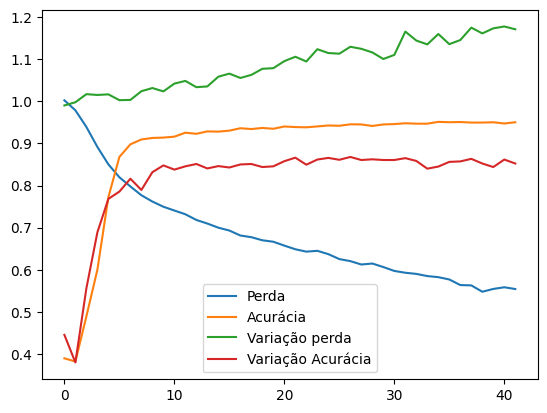

In [ ]:
l1 = losses_1.rename(columns={"loss": "Perda", "val_loss": "Variação perda", "accuracy":"Acurácia", "val_accuracy": "Variação Acurácia"})
l1.plot()

<Axes: >

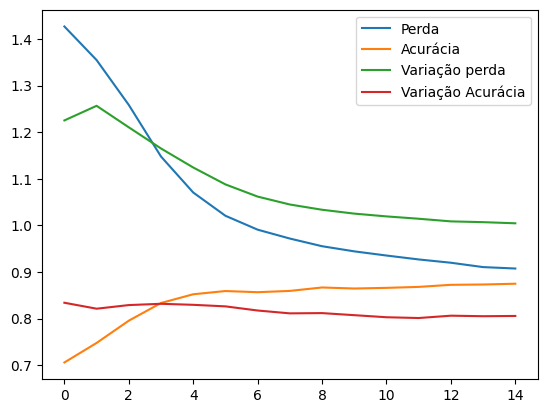

In [ ]:
l2 = losses_2.rename(columns={"loss": "Perda", "val_loss": "Variação perda", "accuracy":"Acurácia", "val_accuracy": "Variação Acurácia"})
l2.plot()

In [ ]:
import torch
model = None
# losses_1, l1, losses_2, l2 = None, None, None, None
torch.cuda.empty_cache()
gc.collect()

72993

9000

In [ ]:
indexs = list(range(0, len(X)))
random.shuffle(indexs)

X = X[indexs]
Y = Y[indexs]


NameError: name 'X' is not defined

Epoch 1/200
225/225 [==============================] - 13s 37ms/step - loss: 0.9990 - accuracy: 0.4019 - val_loss: 1.0021 - val_accuracy: 0.4133
Epoch 2/200
225/225 [==============================] - 6s 25ms/step - loss: 0.9897 - accuracy: 0.4198 - val_loss: 0.9891 - val_accuracy: 0.4170
Epoch 3/200
225/225 [==============================] - 5s 23ms/step - loss: 0.9866 - accuracy: 0.4305 - val_loss: 0.9854 - val_accuracy: 0.4263
Epoch 4/200
225/225 [==============================] - 5s 22ms/step - loss: 0.9808 - accuracy: 0.4606 - val_loss: 0.9795 - val_accuracy: 0.4548
Epoch 5/200
225/225 [==============================] - 5s 23ms/step - loss: 0.9625 - accuracy: 0.4825 - val_loss: 0.9719 - val_accuracy: 0.4637
Epoch 6/200
225/225 [==============================] - 5s 23ms/step - loss: 0.9463 - accuracy: 0.4806 - val_loss: 0.9272 - val_accuracy: 0.4719
Epoch 7/200
225/225 [==============================] - 5s 24ms/step - loss: 0.9145 - accuracy: 0.6644 - val_loss: 0.8932 - val_accuracy

<Axes: >

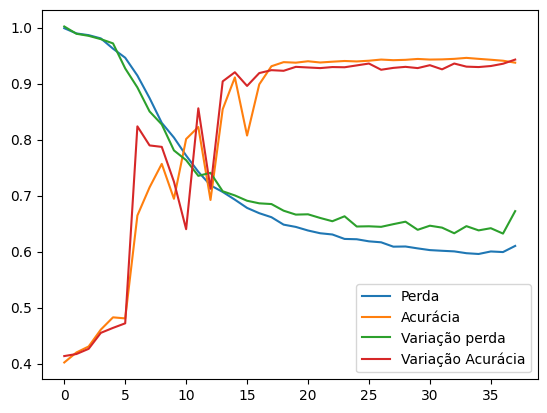

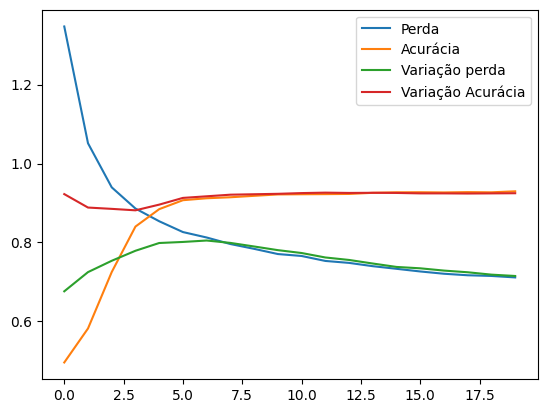

In [ ]:
batch_size = 28

def get_functions( lr=1e-5):
  floss = MGIoULoss(bounding_box_format = "XYXY", mult=224)
  #             Nadam
  return floss, Nadam(learning_rate=lr)

model, accuracy_t, loss_t = None, 0, None
idx = randint(15000,30000)
f_model = f'./model___p1_{idx}.keras'
f_model2 = f'./model__p2_{idx}.keras'
seed = 1
#                               lr= 1e-4
floss, otimizador = get_functions(lr=1e-4)

# complie model
model = get_modelo()
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])

early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)

hist_train = model.fit(x=X, y=Y, batch_size=batch_size, epochs=200,
                        validation_split=0.30, callbacks=[early_stop])

model.save(f_model)
losses_3 = pd.DataFrame(model.history.history)

print(f_model)
avaliar(model, f_model)
# model = None
gc.collect()

# model = tf.keras.models.load_model(f_model)
# fine-tuning
for layer in model.layers:
    layer.trainable = True

floss, otimizador = get_functions(lr=1e-6)
# complie model
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])
early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1, min_delta=0.0015)

hist_train = model.fit(x=X, y=Y, validation_split=0.30,  batch_size=batch_size, epochs=20, callbacks=[early_stop])

accuracy_f = hist_train.history['accuracy'][-1]
loss_f = hist_train.history['loss'][-1]
print(f'[*] f_model2 {accuracy_f} {loss_f}')
model.save(f_model2)

losses_4 = pd.DataFrame(model.history.history)
print(f_model2)
avaliar(model, f_model2)
# ------
torch.cuda.empty_cache()
gc.collect()




<Axes: >

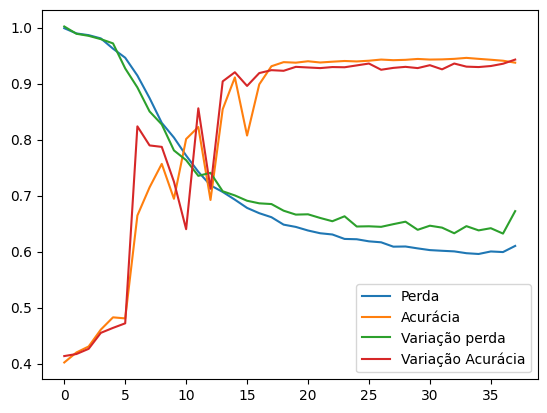

In [ ]:
l3.plot()


<Axes: >

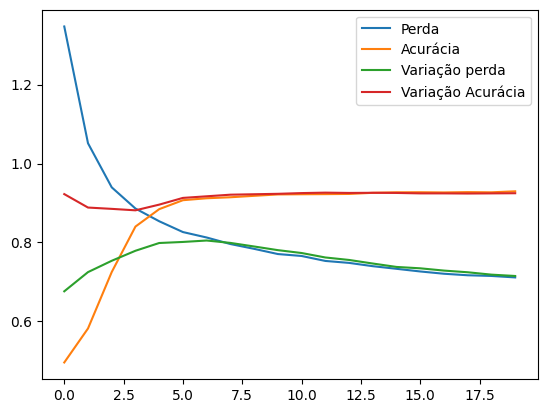

In [ ]:
l4.plot()

<Axes: >

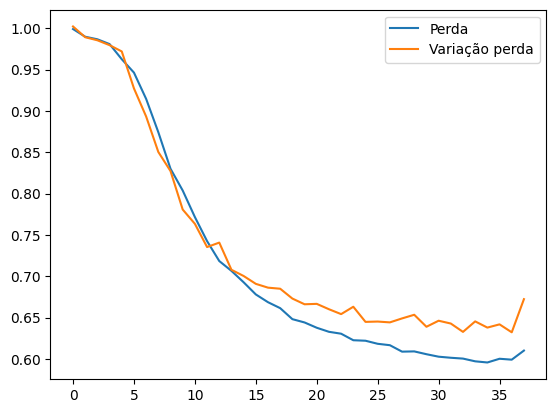

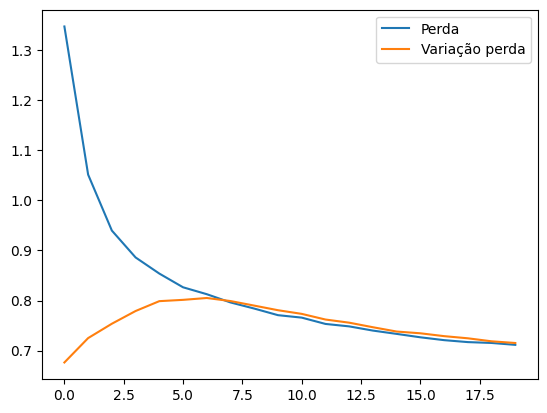

In [ ]:

perda = [0.9990,0.9897,0.9866,0.9808,0.9625,0.9463,0.9145,0.8742,0.8300,0.8037,0.7716,0.7425,0.7184,0.7065,0.6927,0.6780,0.6686,0.6614,0.6481,0.6441,0.6377,
         0.6328,0.6305,0.6226,0.6220,0.6183,0.6166,0.6088,0.6091,0.6057,0.6027,0.6014,0.6004,0.5971,0.5957,0.6002,0.5991,0.6101
]
val_perda = [1.0021,0.9891,0.9854,0.9795,0.9719,0.9272,0.8932,0.8503,0.8272,0.7807,0.7634,0.7353,0.7407,0.7078,0.7003,0.6908,0.6862,0.6849,0.6730,0.6661,0.6666,
             0.6601,0.6542,0.6631,0.6448,0.6452,0.6442,0.6490,0.6534,0.6389,0.6462,0.6428,0.6327,0.6454,0.6379,0.6418,0.6322,0.6723]

df = pd.DataFrame(columns=['Perda','Variação perda'], data={'Perda':perda, 'Variação perda':val_perda})
df.plot()


perda = [1.3474,1.0515,0.9397,0.8860,0.8538,0.8264,0.8126,0.7961,0.7839,0.7707,0.7658,0.7532,0.7483,0.7399,0.7333,0.7265,0.7208,0.7169,0.7152,0.7114]
val_perda = [0.6762,0.7249,0.7536,0.7790,0.7987,0.8013,0.8050,0.7989,0.7898,0.7806,0.7733,0.7620,0.7557,0.7466,0.7380,0.7345,0.7288,0.7245,0.7185,0.7151]

df = pd.DataFrame(columns=['Perda','Variação perda'], data={'Perda':perda, 'Variação perda':val_perda})
df.plot()

### Resultados

In [ ]:
model = tf.keras.models.load_model('./model__p2_26343.keras')
# model = tf.keras.models.load_model('./model___p1_18289.keras')

In [ ]:
avaliar(model, './model__p2_26343.keras')


13/13 [==============================] - 0s 23ms/step - loss: 0.6900 - accuracy: 1.0000
TODOS      -> acurracia: 0.8761110901832581 ; loss: 0.9598575234413147
Carro_Original    -> acurracia: 0.9173611402511597 ; loss: 1.0070436000823975
Carro_zoom        -> acurracia: 0.8263888955116272 ; loss: 0.9711564183235168
Moto_Orifinal     -> acurracia: 0.7861111164093018 ; loss: 0.9957526922225952
Moto_zoom     -> acurracia: 1.0 ; loss: 0.6900256872177124
[*] ./model__p2_26343.keras


In [ ]:
predict = model.predict(x_test)
predict


113/113 [==============================] - 4s 24ms/step


array([[0.16114645, 0.15837948, 0.7117775 , 0.5845423 ],
       [0.42039946, 0.59045374, 0.5467352 , 0.6836142 ],
       [0.14395024, 0.1755405 , 0.7324535 , 0.5957652 ],
       ...,
       [0.5645434 , 0.5123377 , 0.73158437, 0.6132775 ],
       [0.13857432, 0.18292809, 0.8030232 , 0.5877169 ],
       [0.5156072 , 0.5292067 , 0.70866024, 0.6214541 ]], dtype=float32)

In [ ]:
m_test.head()

,type,variation,imgfile,xmin,ymin,xmax,ymax,nxmin,nymin,nxmax,nymax
0,m,2,track0138[08]_3.png,91,98,134,126,0.2111368909512761,0.2268518518518518,0.3109048723897912,0.2916666666666667
1,m,0,track0138[25]_1.png,88,149,106,160,0.0916666666666666,0.1379629629629629,0.1104166666666666,0.1481481481481481
2,m,1,track0138[25]_2.png,6,104,19,112,0.00390625,0.0962962962962963,0.0123697916666666,0.1037037037037037
3,m,3,track0138[25]_4.png,15,99,54,124,0.0474683544303797,0.2037037037037037,0.170886075949367,0.2551440329218107
4,m,3,track0138[15]_4.png,15,100,54,123,0.0474683544303797,0.205761316872428,0.170886075949367,0.2530864197530864


In [ ]:
m_test.loc[0]['imgfile']

'track0138[08]_3.png'

In [ ]:
giouloss = MGIoULoss(bounding_box_format="XYXY", mult=224)
results = []
for i in range(0, predict.shape[0]):
  l = giouloss([y_test[i]], [predict[i]])
  file_path = m_test.loc[i]['imgfile']
  file_path = f'{DIR_RAIZ}data_images/test/{file_path}'
  results.append({"loss": l.numpy(), "verdade":y_test[i], "predicao":predict[i], "index":i,
                  "file":file_path, "type":m_test.loc[i]['type'], "variation":m_test.loc[i]['variation']})


def myFunc(e):
  return e["loss"]


results.sort(key=myFunc)

In [ ]:
from re import M
car_or_1, car_or_2 = None, None
car_alt_1, car_alt_2 = None, None
Moto_or_1, Moto_or_2 = None, None
Moto_alt_1, Moto_alt_2 = None, None

for r in results:
  if r['type'] == "c":
    if r["variation"] == "1":
      if car_or_1 is None:
        car_or_1 = r
      elif car_or_2 is None:
        car_or_2 = r
    else:
      if car_alt_1 is None:
        car_alt_1 = r
      elif car_alt_2 is None:
        car_alt_2 = r
  else:
    if r["variation"] == "1":
      if Moto_or_1 is None:
        Moto_or_1 = r
      elif Moto_or_2 is None:
        Moto_or_2 = r
    else:
      if Moto_alt_1 is None:
        Moto_alt_1 = r
      elif Moto_alt_2 is None:
        Moto_alt_2 = r
  if car_or_1 is not None and car_or_2 is not None and car_alt_1 is not None and car_alt_2 is not None and Moto_or_1 is not None and Moto_or_2 is not None and Moto_alt_1 is not None and Moto_alt_2 is not None:
    break



In [ ]:

import matplotlib.pyplot as plt

def show_predict(img, predict=None, verdade=None, normalizar=False, pincel = 1):
    img = img.copy()
    print('**', predict, normalizar)
    h,w,d = img.shape
    mhw = max(h,w)
    if( predict is not None):
        if(normalizar):
            predict = [int(predict[0] * mhw), int(predict[1]*mhw), int(predict[2]*mhw), int(predict[3]*mhw)]
        else:
            predict = [int(predict[0]  ), int(predict[1] ), int(predict[2] ), int(predict[3] )]
        print(img.shape)

        p1 = (predict[0], predict[1])#x_min, y_min
        p2 = (predict[2], predict[3])#x_max, y_maz

        print('=',p1, p2)
        cv2.rectangle(img,p1, p2,(255,0,0),pincel)
    if( verdade is not None):
        if(normalizar):
            verdade = [int(verdade[0] * mhw), int(verdade[1]*mhw), int(verdade[2]*mhw), int(verdade[3]*mhw)]
        else:
            verdade = [int(verdade[0]  ), int(verdade[1] ), int(verdade[2] ), int(verdade[3] )]
        print(img.shape)

        p1 = (verdade[0], verdade[1])#x_min, y_min
        p2 = (verdade[2], verdade[3])#x_max, y_maz

        print('=',p1, p2)
        cv2.rectangle(img,p1, p2,(0,255,0),pincel)

    plt.figure(figsize=(10,10))
    plt.imshow(img)

    plt.show()

In [ ]:
print(car_or_1['file'])
print(car_or_2['file'])

print(car_alt_1['file'])
print(car_alt_2['file'])

print(Moto_or_1['file'])
print(Moto_or_2['file'])

print(Moto_alt_1['file'])
print(Moto_alt_2['file'])

./UFPR-ALPR/data_images/test/track0140[07].png
./UFPR-ALPR/data_images/test/track0131[15].png
./UFPR-ALPR/data_images/test/track0113[12]_2.png
./UFPR-ALPR/data_images/test/track0093[14]_2.png
./UFPR-ALPR/data_images/test/track0148[21].png
./UFPR-ALPR/data_images/test/track0148[22].png
./UFPR-ALPR/data_images/test/track0109[01]_2.png
./UFPR-ALPR/data_images/test/track0109[16]_2.png


In [ ]:
car_alt_1["predicao"], car_alt_1["verdade"]

(array([0.3982595 , 0.61724466, 0.60872865, 0.69315654], dtype=float32),
 array([0.39285713, 0.6160714 , 0.60714287, 0.6964286 ], dtype=float32))

** [0.3982595  0.61724466 0.60872865 0.69315654] True
(224, 224, 3)
= (89, 138) (136, 155)
(224, 224, 3)
= (87, 137) (136, 156)


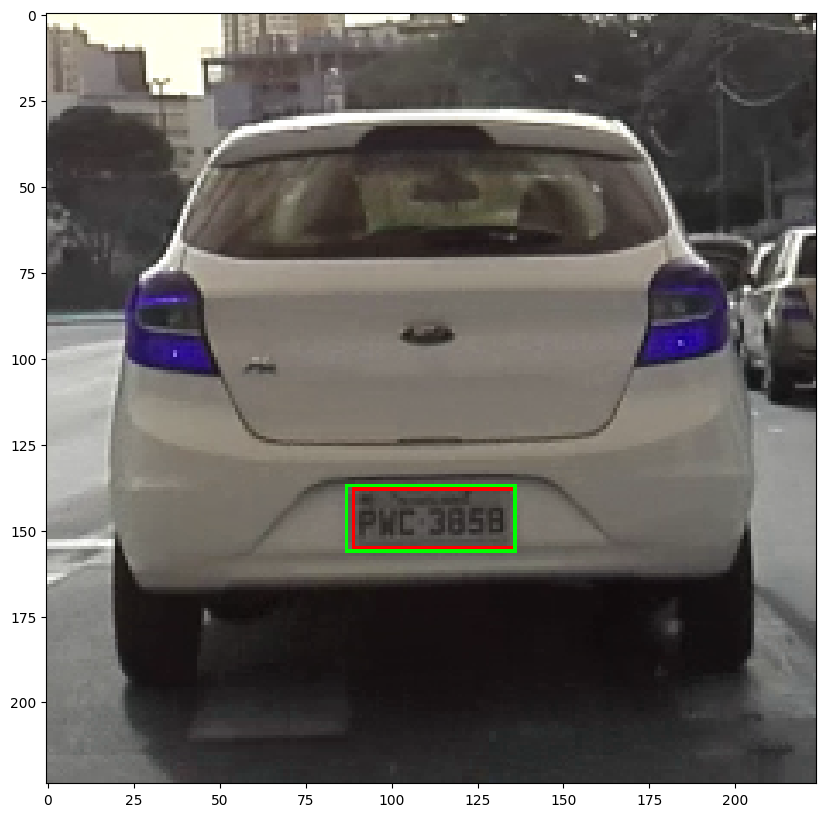

In [ ]:
show_predict(cv2.imread(car_alt_1['file']), predict=car_alt_1["predicao"], verdade=car_alt_1["verdade"], normalizar=True, pincel = 1)

** [0.42165038 0.5819573  0.60132635 0.6367552 ] True
(224, 224, 3)
= (94, 130) (134, 142)
(224, 224, 3)
= (94, 129) (133, 143)


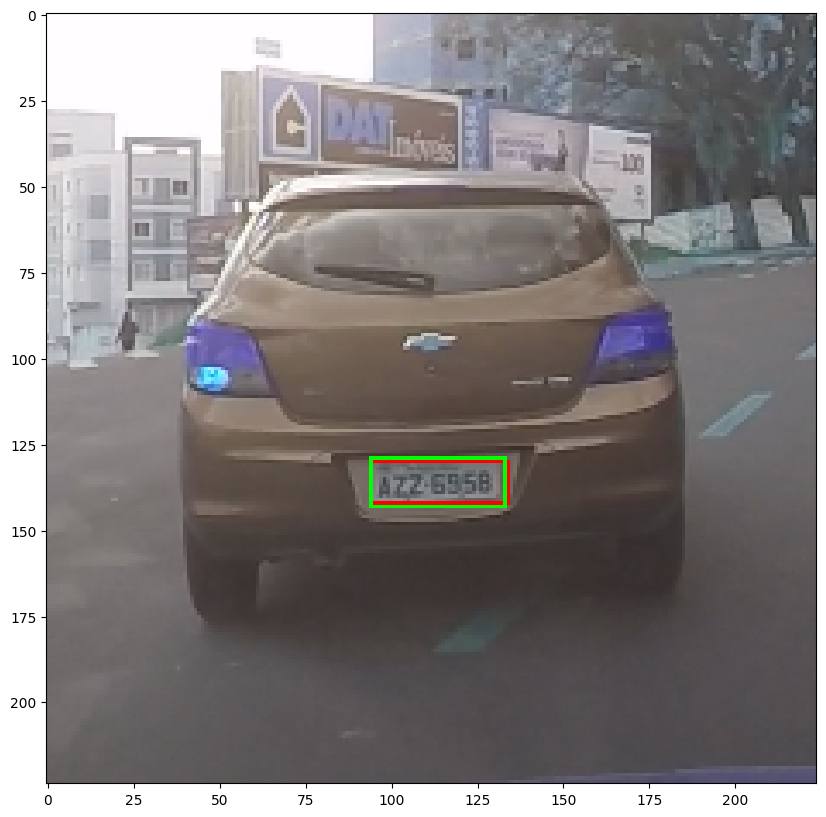

In [ ]:
show_predict(cv2.imread(car_alt_2['file']), predict=car_alt_2["predicao"], verdade=car_alt_2["verdade"], normalizar=True, pincel = 1)

** [0.2832203  0.28395635 0.6477342  0.44103688] True
(224, 224, 3)
= (63, 63) (145, 98)
(224, 224, 3)
= (103, 64) (126, 71)


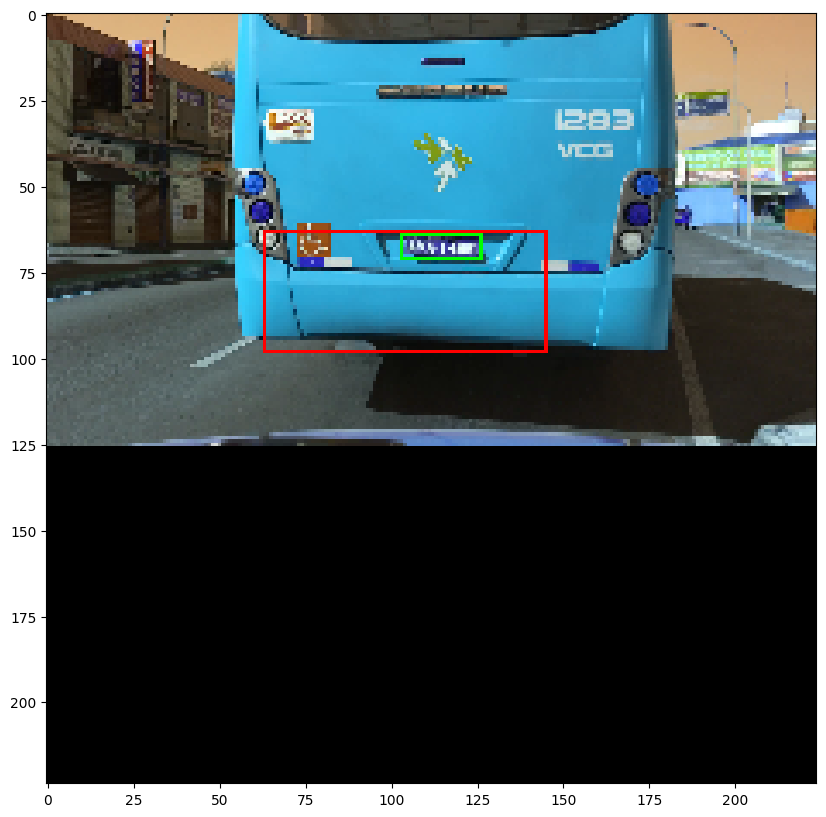

** [0.1888597  0.24473514 0.7706146  0.3618114 ] True
(224, 224, 3)
= (42, 54) (172, 81)
(224, 224, 3)
= (123, 61) (146, 68)


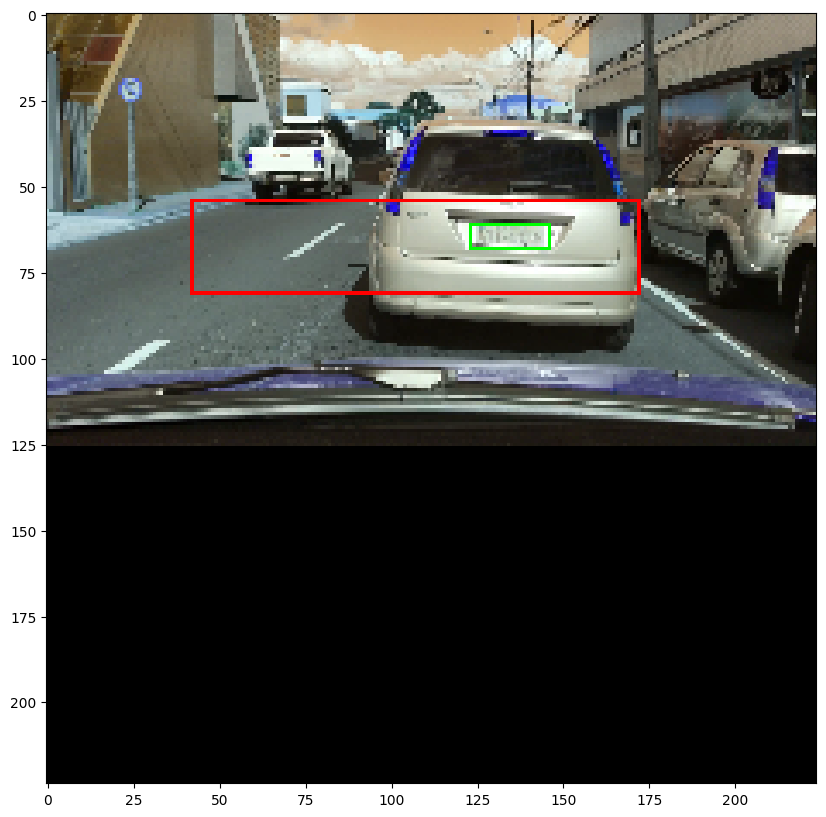

** [0.3982595  0.61724466 0.60872865 0.69315654] True
(224, 224, 3)
= (89, 138) (136, 155)
(224, 224, 3)
= (87, 137) (136, 156)


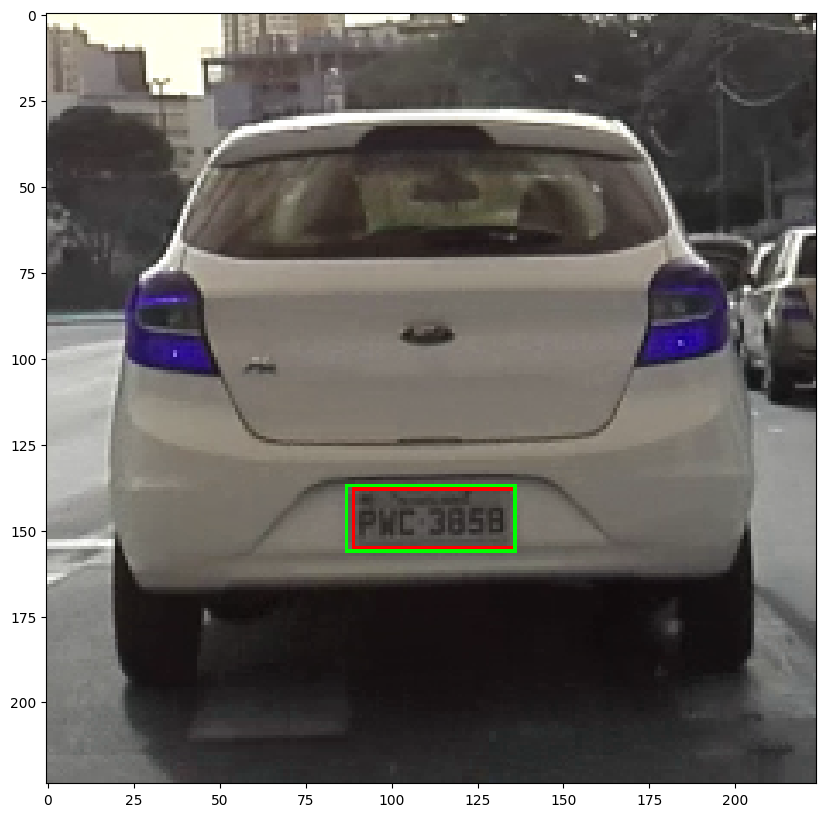

** [0.42165038 0.5819573  0.60132635 0.6367552 ] True
(224, 224, 3)
= (94, 130) (134, 142)
(224, 224, 3)
= (94, 129) (133, 143)


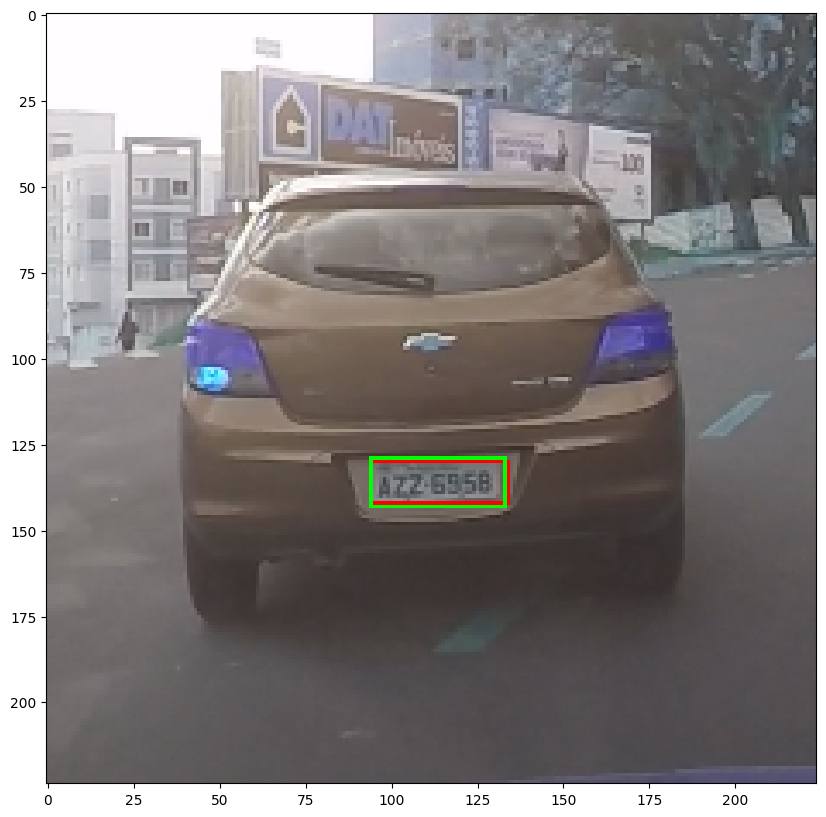

** [0.14867032 0.2797724  0.685513   0.49340585] True
(224, 224, 3)
= (33, 62) (153, 110)
(224, 224, 3)
= (101, 66) (112, 73)


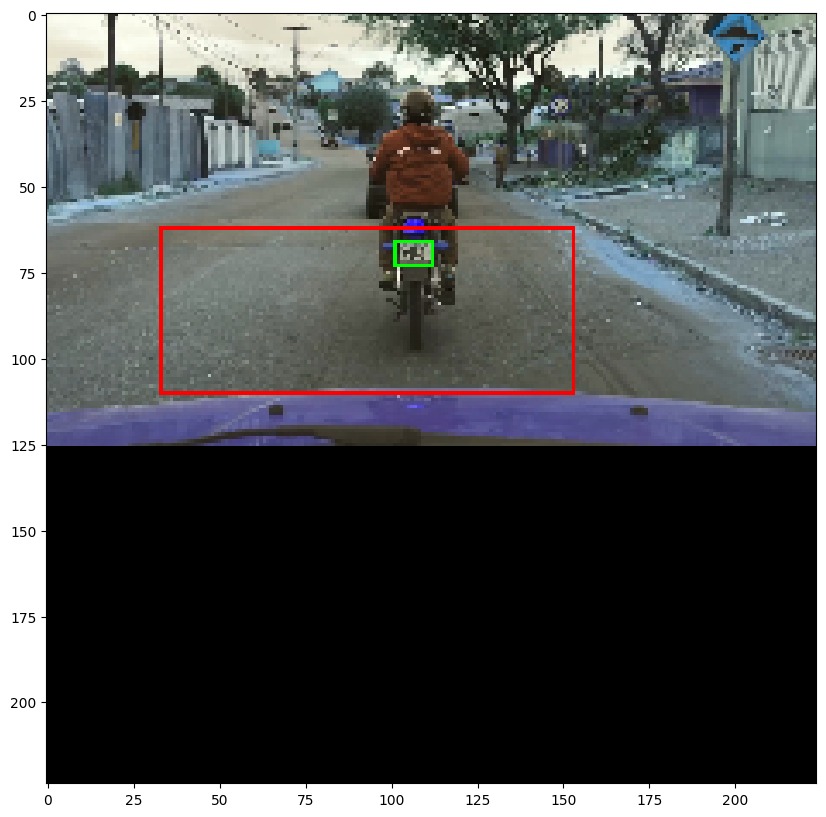

** [0.2172345  0.25982472 0.6892011  0.5229955 ] True
(224, 224, 3)
= (48, 58) (154, 117)
(224, 224, 3)
= (101, 66) (112, 73)


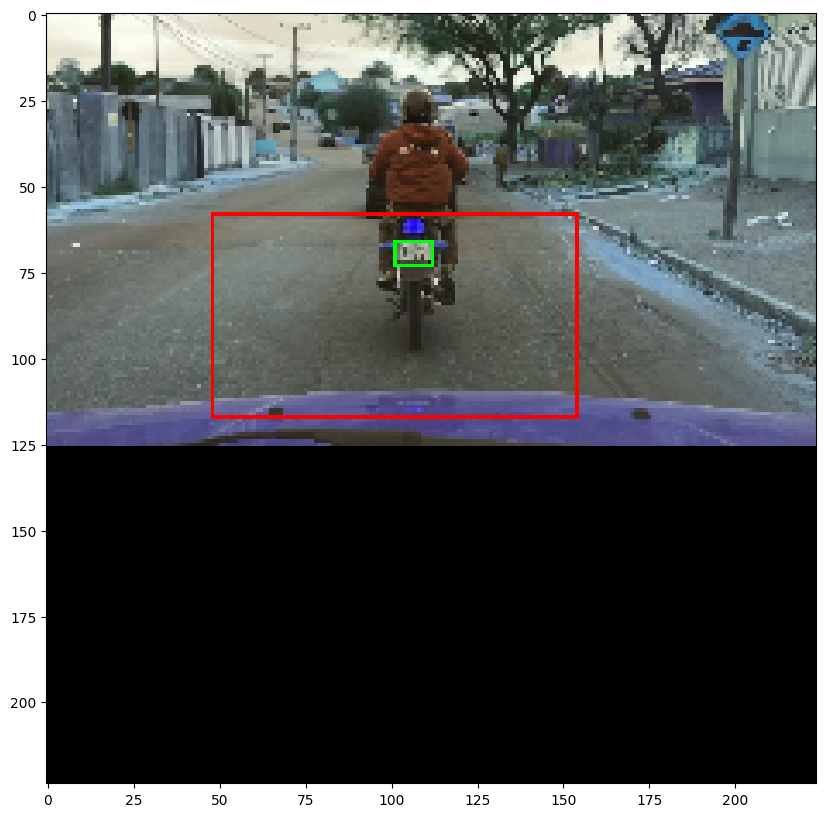

** [0.43713757 0.5711778  0.5418751  0.6629026 ] True
(224, 224, 3)
= (97, 127) (121, 148)
(224, 224, 3)
= (98, 128) (121, 146)


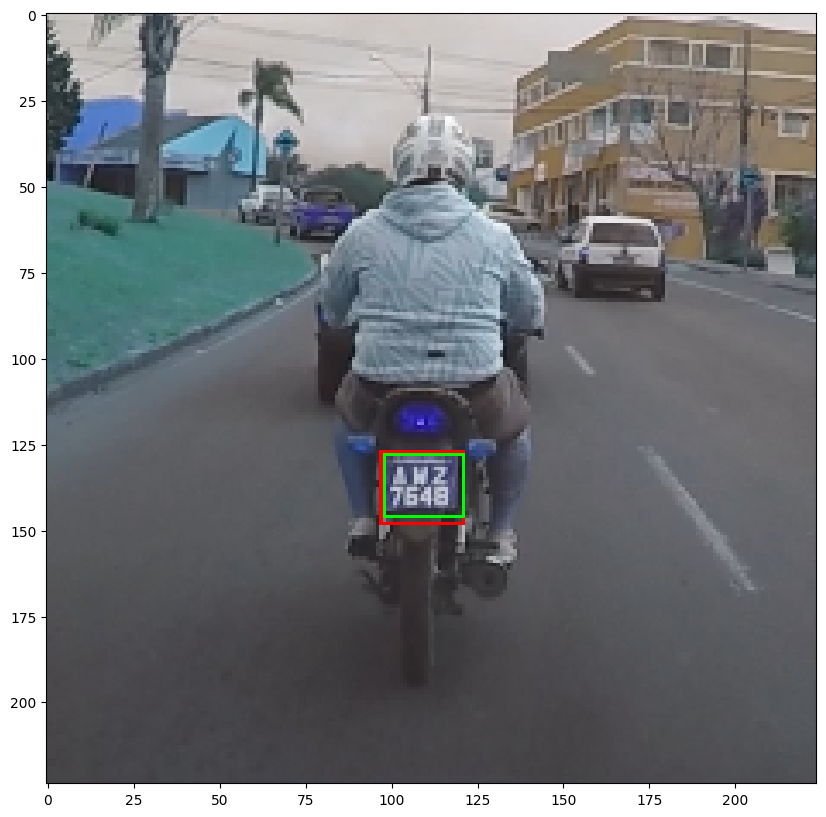

** [0.43473715 0.5668567  0.5323339  0.6541694 ] True
(224, 224, 3)
= (97, 126) (119, 146)
(224, 224, 3)
= (96, 126) (119, 143)


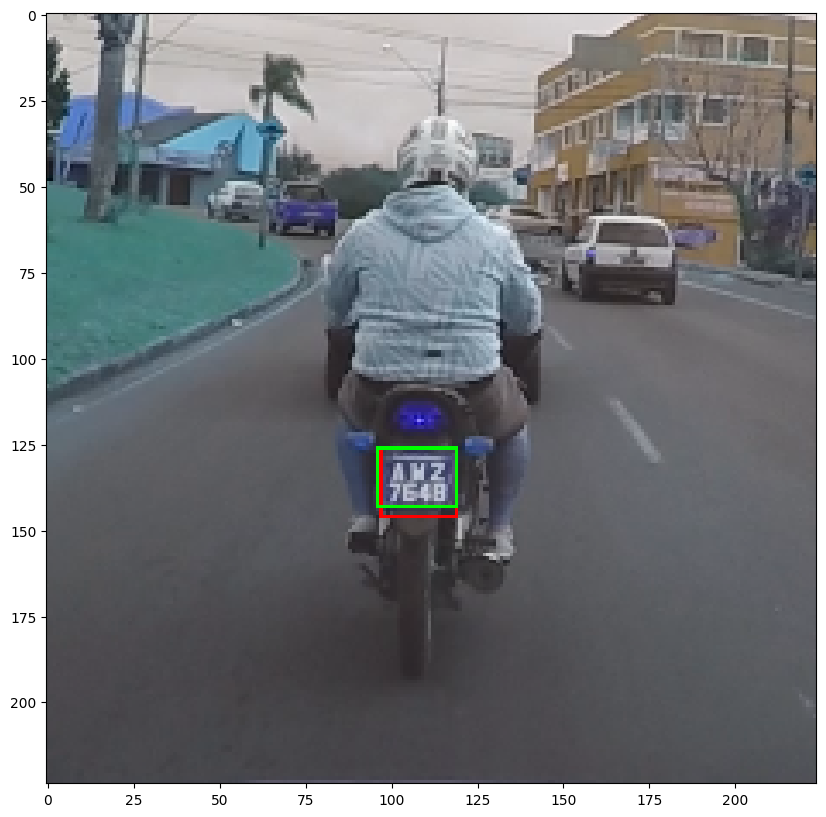

In [ ]:
show_predict(cv2.imread(car_or_1["file"]), predict=car_or_1["predicao"], verdade=car_or_1["verdade"], normalizar=True)
show_predict(cv2.imread(car_or_2["file"]), predict=car_or_2["predicao"], verdade=car_or_2["verdade"], normalizar=True)

show_predict(cv2.imread(car_alt_1["file"]), predict=car_alt_1["predicao"], verdade=car_alt_1["verdade"], normalizar=True)
show_predict(cv2.imread(car_alt_2["file"]), predict=car_alt_2["predicao"], verdade=car_alt_2["verdade"], normalizar=True)


show_predict(cv2.imread(Moto_or_1["file"]), predict=Moto_or_1["predicao"], verdade=Moto_or_1["verdade"], normalizar=True)
show_predict(cv2.imread(Moto_or_2["file"]), predict=Moto_or_2["predicao"], verdade=Moto_or_2["verdade"], normalizar=True)

show_predict(cv2.imread(Moto_alt_1["file"]), predict=Moto_alt_1["predicao"], verdade=Moto_alt_1["verdade"], normalizar=True)
show_predict(cv2.imread(Moto_alt_2["file"]), predict=Moto_alt_2["predicao"], verdade=Moto_alt_2["verdade"], normalizar=True)

## testando modelo

In [ ]:
model = tf.keras.models.load_model('./model__p2_26343.keras')
# model = tf.keras.models.load_model('./model___p1_18289.keras')
# model = tf.keras.models.load_model('./model___xxt_02.keras')
#model = tf.keras.models.load_model('./model___xxt_03_1_29632.keras')
# model = tf.keras.models.load_model('./model__p2_29741.keras')

# model__p2_29023.keras

In [ ]:
def carrega_img(image_path):
  # Carrega a imagem com a funcao load_img do modulo tensorflow
  load_image = load_img(image_path,target_size=(224,224))
  # Converter imagem para array com img_to_array do modulo tensorflow
  load_image_arr = img_to_array(load_image)
  # Normalizar para o intervalo [0,1]
  norm_load_image_arr =  load_image_arr/255.0
  return norm_load_image_arr

In [ ]:
def testar(img_file_path):
  path_dest = img_file_path[0:-4]+"_norma"+img_file_path[-4:]
  pre_processar_imagem(cv2.imread(img_file_path), path_dest)
  img01_norme = carrega_img(path_dest)
  previsao01 = model.predict(img01_norme.reshape(1,224,224,3))[0]
  print('previsto: ', previsao01)
  img = cv2.imread(img_file_path)
  A,L,C = img.shape
  previsao01 = [previsao01[0]*L, previsao01[1]*A, previsao01[2]*L, previsao01[3]*A]
  print('previsto: ', previsao01)
  show_predict(img,previsao01, normalizar=False, pincel=1)
  os.remove(path_dest)


008.jpg
1/1 [==============================] - 0s 25ms/step
previsto:  [0.3577179  0.67888135 0.6096662  0.75742525]
previsto:  [178.8589507341385, 339.4406735897064, 304.8331141471863, 378.71262431144714]
** [178.8589507341385, 339.4406735897064, 304.8331141471863, 378.71262431144714] False
(500, 500, 3)
= (178, 339) (304, 378)


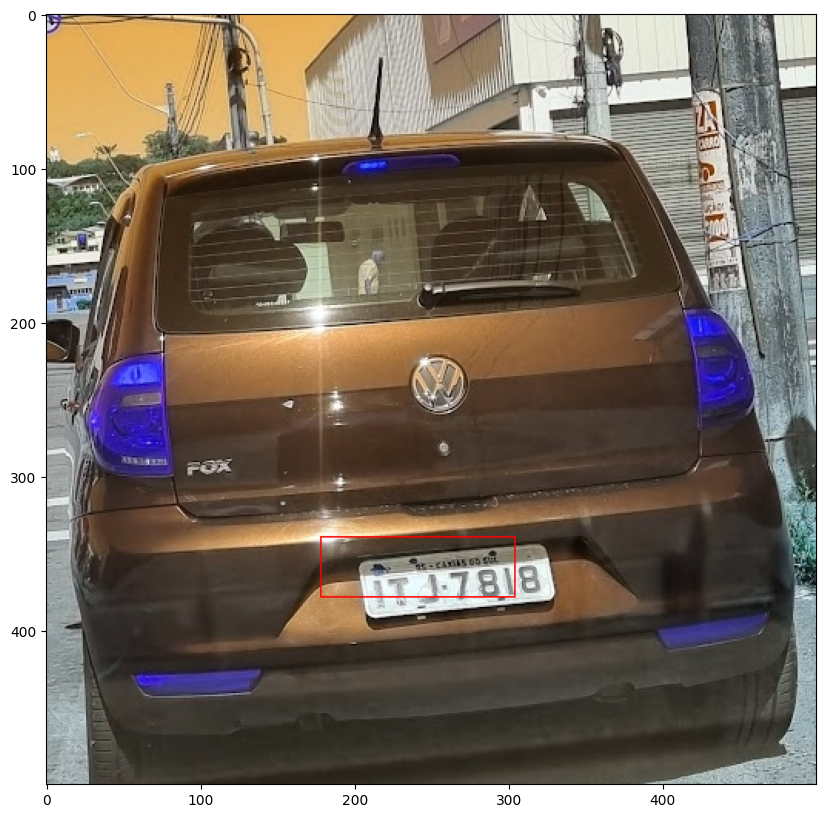

006.jpg
1/1 [==============================] - 0s 24ms/step
previsto:  [0.33952448 0.68272525 0.5192869  0.7651294 ]
previsto:  [95.06685376167297, 191.16307020187378, 145.40032386779785, 214.23622846603394]
** [95.06685376167297, 191.16307020187378, 145.40032386779785, 214.23622846603394] False
(280, 280, 3)
= (95, 191) (145, 214)


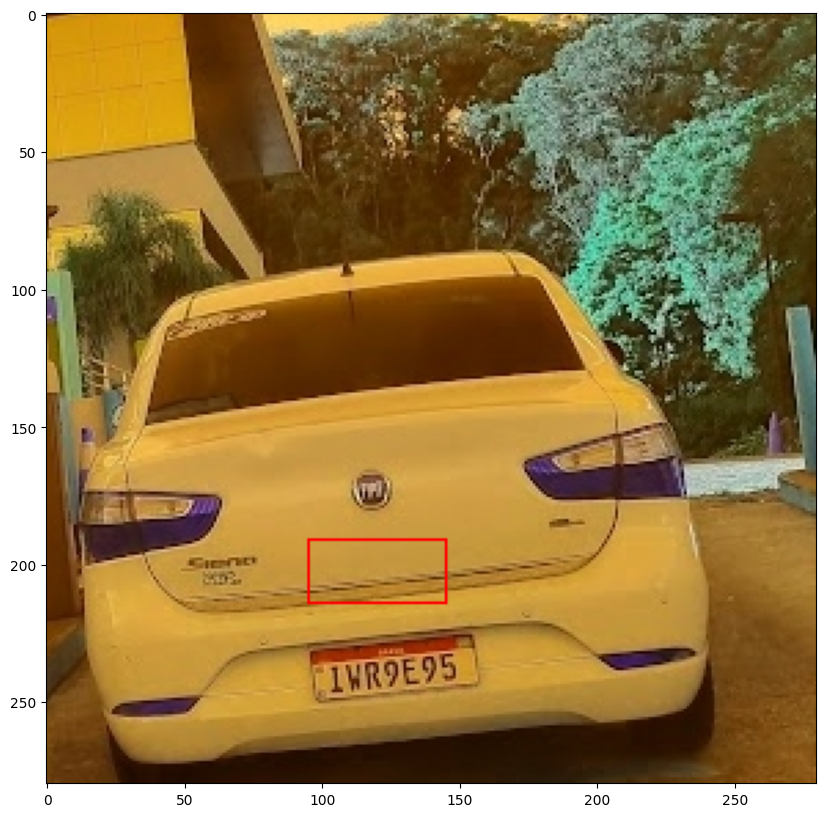

004.jpg
1/1 [==============================] - 0s 23ms/step
previsto:  [0.44207942 0.6280421  0.60925454 0.68574923]
previsto:  [198.93574118614197, 282.6189458370209, 274.164542555809, 308.5871547460556]
** [198.93574118614197, 282.6189458370209, 274.164542555809, 308.5871547460556] False
(450, 450, 3)
= (198, 282) (274, 308)


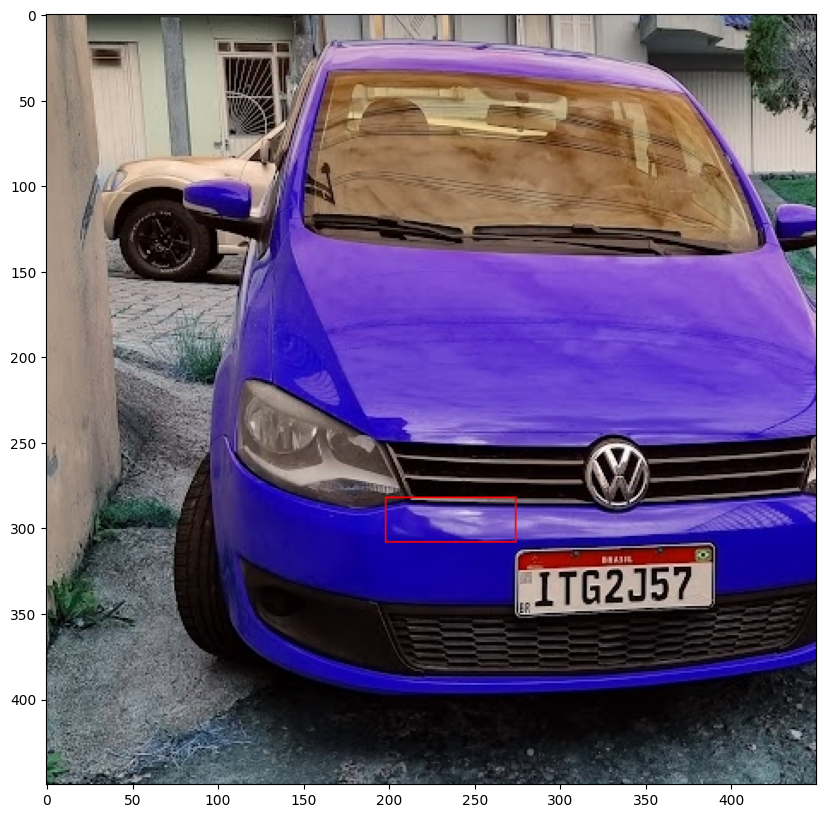

005.jpg
1/1 [==============================] - 0s 23ms/step
previsto:  [0.4063988 0.6350719 0.5708355 0.7161255]
previsto:  [284.07276329398155, 591.8869862556458, 399.01399433612823, 667.428955078125]
** [284.07276329398155, 591.8869862556458, 399.01399433612823, 667.428955078125] False
(932, 699, 3)
= (284, 591) (399, 667)


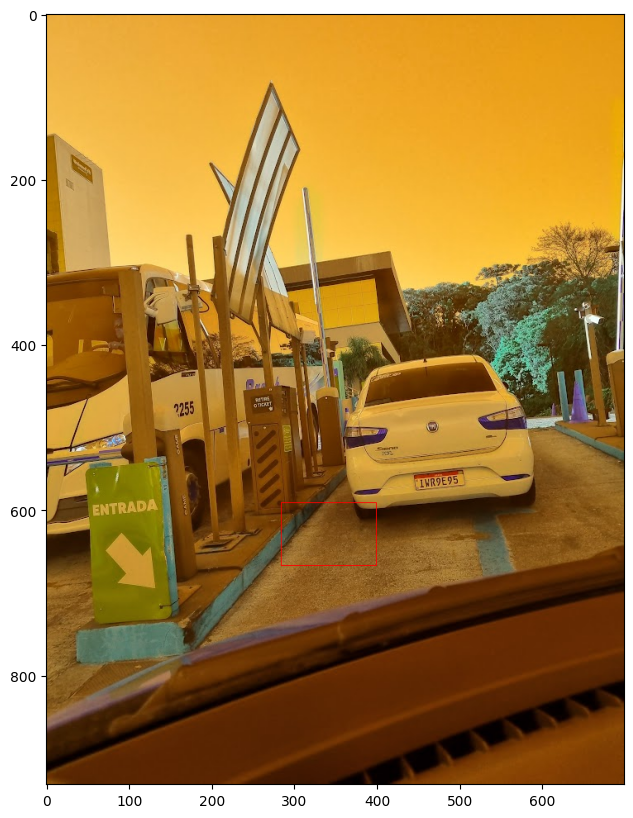

007.jpg
1/1 [==============================] - 0s 23ms/step
previsto:  [0.4005041  0.63524306 0.56449074 0.722933  ]
previsto:  [279.952374458313, 592.0465302467346, 394.57902413606644, 673.7735507488251]
** [279.952374458313, 592.0465302467346, 394.57902413606644, 673.7735507488251] False
(932, 699, 3)
= (279, 592) (394, 673)


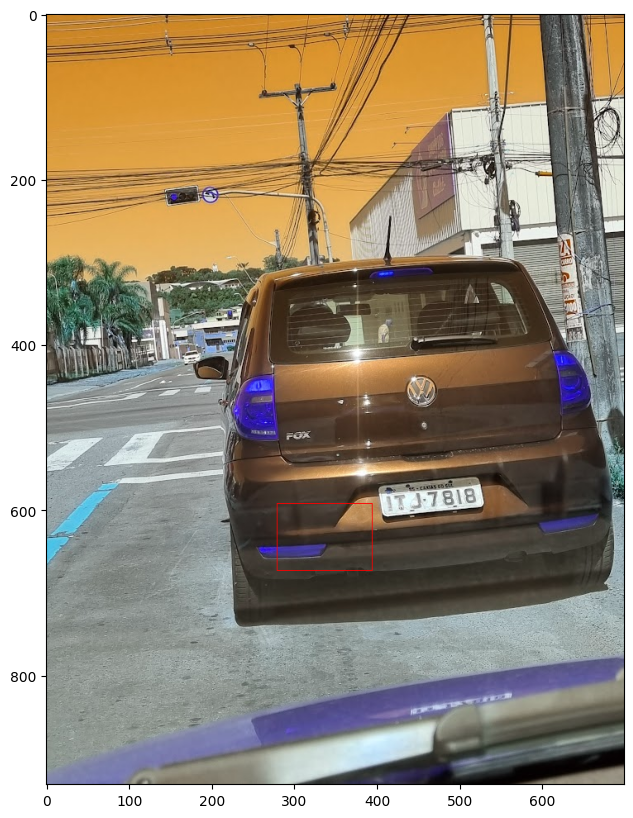

002.jpg
1/1 [==============================] - 0s 23ms/step
previsto:  [0.41080418 0.6190002  0.63304466 0.72204655]
previsto:  [287.1521234214306, 432.6811373233795, 442.4982174038887, 504.7105413079262]
** [287.1521234214306, 432.6811373233795, 442.4982174038887, 504.7105413079262] False
(699, 699, 3)
= (287, 432) (442, 504)


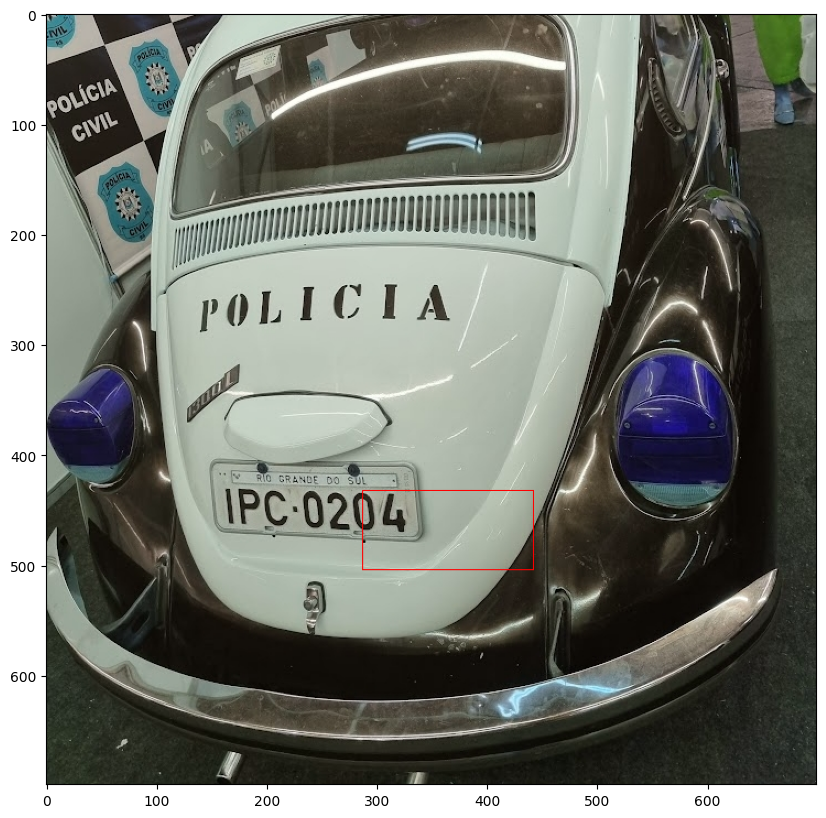

003.jpg
1/1 [==============================] - 0s 24ms/step
previsto:  [0.35856947 0.60858387 0.50322634 0.6779623 ]
previsto:  [250.6400616466999, 567.2001645565033, 351.75521153211594, 631.8608665466309]
** [250.6400616466999, 567.2001645565033, 351.75521153211594, 631.8608665466309] False
(932, 699, 3)
= (250, 567) (351, 631)


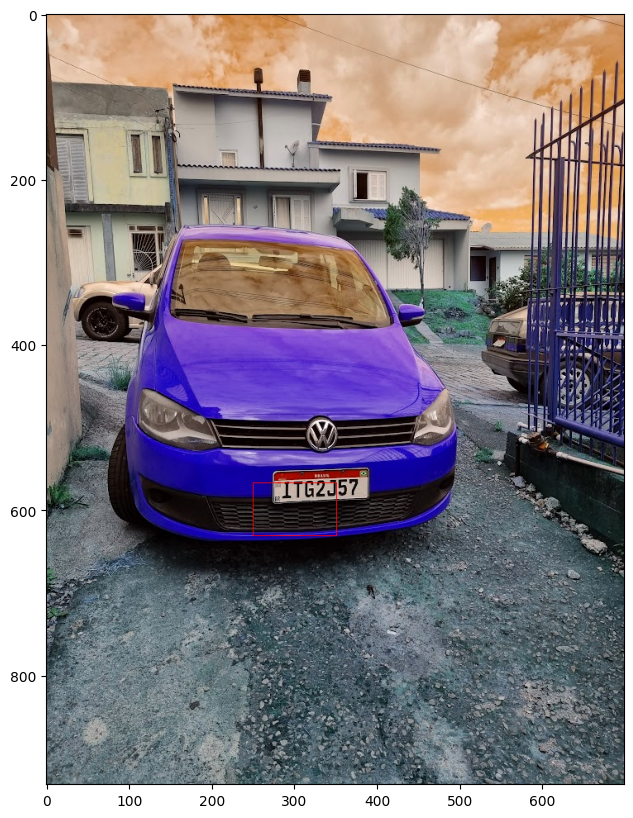

001.jpg
1/1 [==============================] - 0s 23ms/step
previsto:  [0.39855784 0.62653637 0.58129823 0.7145793 ]
previsto:  [278.59193140268326, 583.9318962097168, 406.327464222908, 665.9878928661346]
** [278.59193140268326, 583.9318962097168, 406.327464222908, 665.9878928661346] False
(932, 699, 3)
= (278, 583) (406, 665)


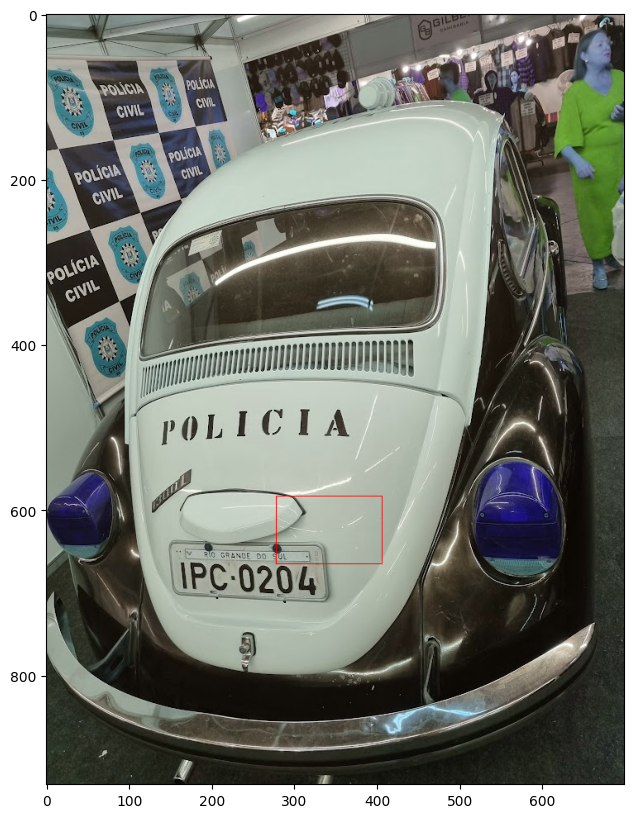

In [ ]:
from os import listdir
from os.path import isfile, join
mypath = './ALPD/novas_img/'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

for imgname in onlyfiles:
  print(imgname)
  testar(f'{mypath}/{imgname}')


In [ ]:

img01_norme = carrega_img('./UFPR-ALPR/novas/img2_2.jpg')

img01_norme.shape

(224, 224, 3)

In [ ]:
previsao01 = model.predict(img01_norme.reshape(1,224,224,3))
previsao01

1/1 [==============================] - 0s 32ms/step


array([[0.3954304 , 0.5901468 , 0.53564715, 0.66947263]], dtype=float32)

** [0.3954304  0.5901468  0.53564715 0.66947263] True
(500, 500, 3)
= (197, 295) (267, 334)


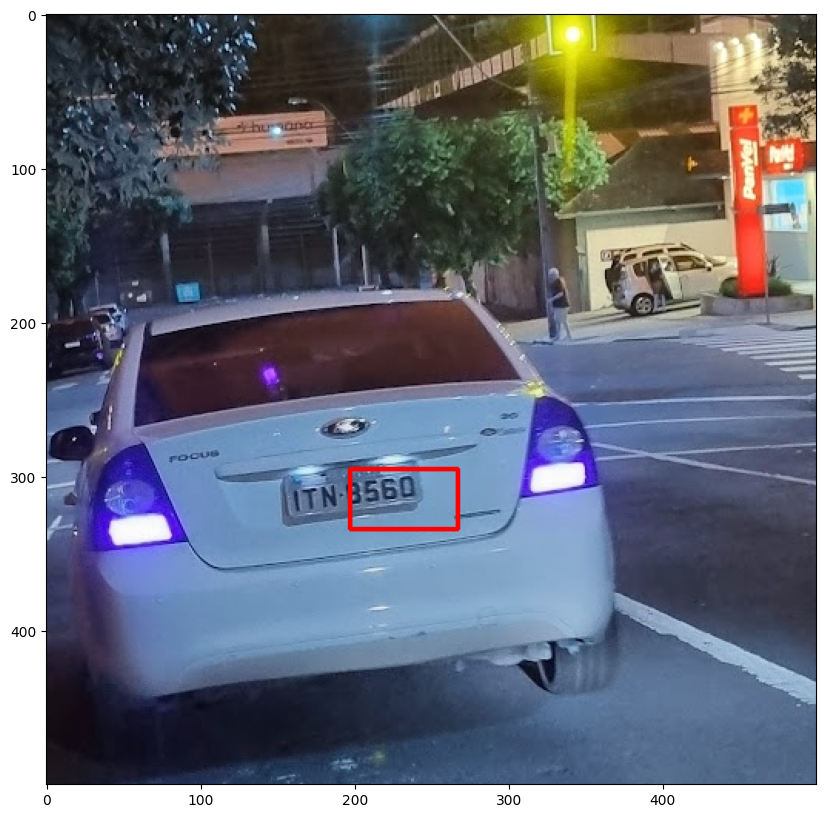

In [ ]:
show_predict(cv2.imread('./UFPR-ALPR/novas/img2_2.jpg'), predict=previsao01[0], normalizar=True, pincel=2)

# Transfer-learning  X full training

In [ ]:
print('x_train  =',x_train.shape)
print('x_valid  =',x_valid.shape)

x_train  = (3598, 224, 224, 3)
x_valid  = (1800, 224, 224, 3)


In [ ]:
model = get_modelo()
len(model.layers)

159

In [ ]:
import time
import torch

batch_size = 32

def run_train_tl(weights, epochs, lr=4e-5):
  # Limpado o cach
  model = None
  torch.cuda.empty_cache()
  gc.collect()

  floss = MGIoULoss(bounding_box_format = "XYXY", mult=224)
  otimizador = Adam(learning_rate=lr)
  model = get_modelo(weights=weights)
  if(weights is None):
    for layer in model.layers:
        layer.trainable = True
  seed(1)
  model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])

  hist_train = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=epochs,
                          validation_data=(x_valid, y_valid))

  df_history = pd.DataFrame(model.history.history)
  return df_history


## Full training

In [ ]:

s = time.time()
df_history1 = run_train_tl(None, 10)

e = time.time()
print('tempo para rodar: ',e-s)



Epoch 1/10
113/113 [==============================] - 30s 72ms/step - loss: 1.0006 - accuracy: 0.4130 - val_loss: 1.6440 - val_accuracy: 0.3978
Epoch 2/10
113/113 [==============================] - 6s 53ms/step - loss: 0.9870 - accuracy: 0.4111 - val_loss: 1.4305 - val_accuracy: 0.3978
Epoch 3/10
113/113 [==============================] - 6s 53ms/step - loss: 0.9867 - accuracy: 0.4111 - val_loss: 1.2853 - val_accuracy: 0.3978
Epoch 4/10
113/113 [==============================] - 6s 54ms/step - loss: 0.9865 - accuracy: 0.4111 - val_loss: 1.1969 - val_accuracy: 0.3978
Epoch 5/10
113/113 [==============================] - 6s 53ms/step - loss: 0.9859 - accuracy: 0.4113 - val_loss: 1.1615 - val_accuracy: 0.3978
Epoch 6/10
113/113 [==============================] - 6s 54ms/step - loss: 0.9862 - accuracy: 0.4119 - val_loss: 1.1259 - val_accuracy: 0.3978
Epoch 7/10
113/113 [==============================] - 6s 53ms/step - loss: 0.9865 - accuracy: 0.4230 - val_loss: 1.1336 - val_accuracy: 0.397

<Axes: >

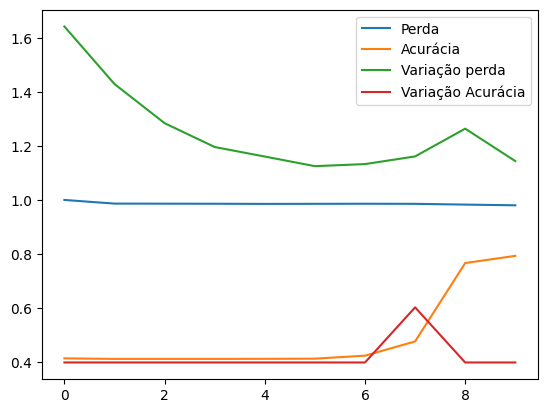

In [ ]:
l1 = df_history1.rename(columns={"loss": "Perda", "val_loss": "Variação perda", "accuracy":"Acurácia", "val_accuracy": "Variação Acurácia", 'recall':'Recall', 'val_recall':'Variação recall'})
l1.plot()

In [ ]:
s = time.time()
df_history_201 = run_train_tl(None, 10, lr=6e-5)

e = time.time()
print('tempo para rodar: ',e-s)


Epoch 1/10
113/113 [==============================] - 34s 108ms/step - loss: 1.0159 - accuracy: 0.4111 - val_loss: 1.6192 - val_accuracy: 0.3978
Epoch 2/10
113/113 [==============================] - 10s 90ms/step - loss: 0.9886 - accuracy: 0.4111 - val_loss: 1.4072 - val_accuracy: 0.3978
Epoch 3/10
113/113 [==============================] - 10s 90ms/step - loss: 0.9875 - accuracy: 0.4111 - val_loss: 1.2817 - val_accuracy: 0.3978
Epoch 4/10
113/113 [==============================] - 10s 90ms/step - loss: 0.9880 - accuracy: 0.4111 - val_loss: 1.2123 - val_accuracy: 0.3978
Epoch 5/10
113/113 [==============================] - 10s 89ms/step - loss: 0.9871 - accuracy: 0.4111 - val_loss: 1.1456 - val_accuracy: 0.3978
Epoch 6/10
113/113 [==============================] - 10s 89ms/step - loss: 0.9873 - accuracy: 0.4111 - val_loss: 1.1371 - val_accuracy: 0.3978
Epoch 7/10
113/113 [==============================] - 10s 89ms/step - loss: 0.9870 - accuracy: 0.4111 - val_loss: 1.1073 - val_accuracy

<Axes: >

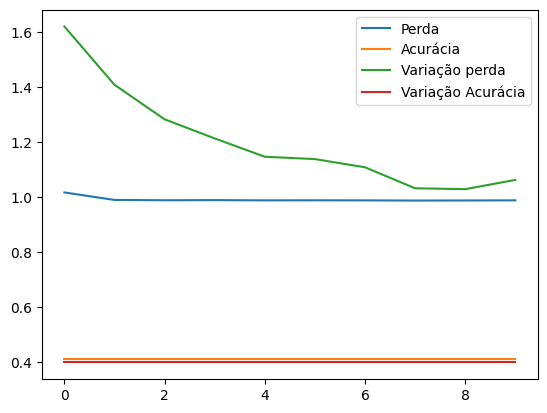

In [ ]:
l1 = df_history_201.rename(columns={"loss": "Perda", "val_loss": "Variação perda", "accuracy":"Acurácia", "val_accuracy": "Variação Acurácia", 'recall':'Recall', 'val_recall':'Variação recall'})
l1.plot()

## Transfer-learning

In [ ]:
s = time.time()
df_history2 = run_train_tl('imagenet', 10)
e = time.time()
print('tempo para rodar: ',e-s)



Epoch 1/10
113/113 [==============================] - 9s 44ms/step - loss: 1.0258 - accuracy: 0.6023 - val_loss: 0.9883 - val_accuracy: 0.5156
Epoch 2/10
113/113 [==============================] - 3s 25ms/step - loss: 0.9804 - accuracy: 0.5120 - val_loss: 0.9894 - val_accuracy: 0.4500
Epoch 3/10
113/113 [==============================] - 3s 25ms/step - loss: 0.9655 - accuracy: 0.5450 - val_loss: 0.9817 - val_accuracy: 0.5444
Epoch 4/10
113/113 [==============================] - 3s 25ms/step - loss: 0.9257 - accuracy: 0.6648 - val_loss: 0.9898 - val_accuracy: 0.6283
Epoch 5/10
113/113 [==============================] - 3s 25ms/step - loss: 0.8876 - accuracy: 0.6904 - val_loss: 1.0020 - val_accuracy: 0.6806
Epoch 6/10
113/113 [==============================] - 3s 25ms/step - loss: 0.8513 - accuracy: 0.6907 - val_loss: 0.9957 - val_accuracy: 0.6561
Epoch 7/10
113/113 [==============================] - 3s 25ms/step - loss: 0.8219 - accuracy: 0.6998 - val_loss: 1.0176 - val_accuracy: 0.5928

<Axes: >

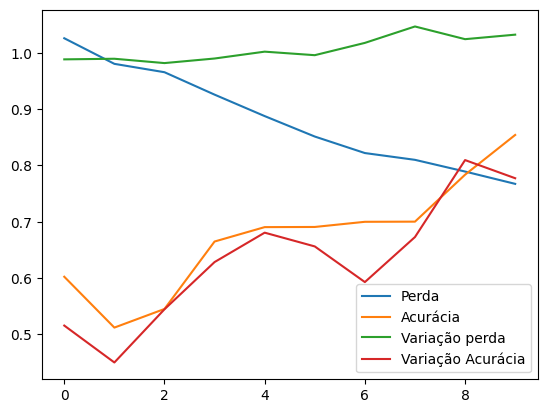

In [ ]:
l1 = df_history2.rename(columns={"loss": "Perda", "val_loss": "Variação perda", "accuracy":"Acurácia", "val_accuracy": "Variação Acurácia"})
l1.plot()

In [ ]:
s = time.time()
df_history_202 = run_train_tl('imagenet', 10, lr=6e-5)
e = time.time()
print('tempo para rodar: ',e-s)



Epoch 1/10
113/113 [==============================] - 11s 66ms/step - loss: 1.0184 - accuracy: 0.4066 - val_loss: 0.9889 - val_accuracy: 0.3978
Epoch 2/10
113/113 [==============================] - 5s 42ms/step - loss: 0.9854 - accuracy: 0.4083 - val_loss: 0.9829 - val_accuracy: 0.3967
Epoch 3/10
113/113 [==============================] - 5s 41ms/step - loss: 0.9677 - accuracy: 0.4361 - val_loss: 0.9723 - val_accuracy: 0.4594
Epoch 4/10
113/113 [==============================] - 5s 42ms/step - loss: 0.9361 - accuracy: 0.4850 - val_loss: 0.9562 - val_accuracy: 0.4722
Epoch 5/10
113/113 [==============================] - 5s 42ms/step - loss: 0.8933 - accuracy: 0.5100 - val_loss: 0.9558 - val_accuracy: 0.4844
Epoch 6/10
113/113 [==============================] - 5s 42ms/step - loss: 0.8542 - accuracy: 0.5392 - val_loss: 0.9516 - val_accuracy: 0.5456
Epoch 7/10
113/113 [==============================] - 5s 42ms/step - loss: 0.8143 - accuracy: 0.6406 - val_loss: 0.9605 - val_accuracy: 0.701

<Axes: >

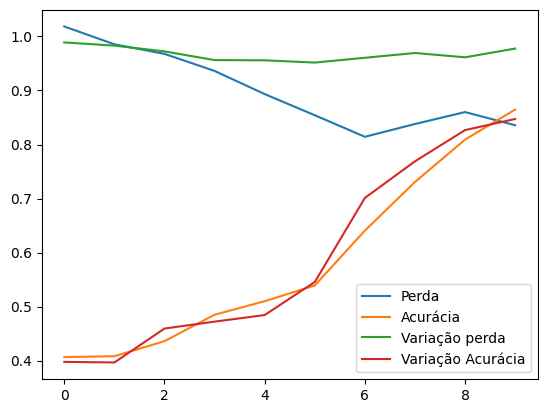

In [ ]:
l1 = df_history_202.rename(columns={"loss": "Perda", "val_loss": "Variação perda", "accuracy":"Acurácia", "val_accuracy": "Variação Acurácia", 'recall':'Recall', 'val_recall':'Variação recall'})
l1.plot()

### Comparativo

0    0.413007
1    0.411062
2    0.411062
3    0.411062
4    0.411340
5    0.411895
6    0.423013
7    0.475820
8    0.766537
9    0.793218
Name: accuracy, dtype: float64

In [ ]:
df_history = pd.DataFrame(columns=['acuracia-treino-completo','acuracia-transferência','perda-treino-completo','perda-transferência'])


df_history['acuracia-treino-completo'] = df_history1['accuracy']
df_history['perda-treino-completo'] = df_history1['loss']


df_history['acuracia-transferência'] = df_history2['accuracy']
df_history['perda-transferência'] = df_history2['loss']


df_history

,acuracia-treino-completo,acuracia-transferência,perda-treino-completo,perda-transferência
0,0.413007,0.602279,1.000591,1.025818
1,0.411062,0.511951,0.987049,0.980366
2,0.411062,0.545025,0.986738,0.965499
3,0.411062,0.664814,0.986504,0.925685
4,0.411340,0.690384,0.985911,0.887572
5,0.411895,0.690661,0.986204,0.851268
6,0.423013,0.699833,0.986507,0.821939
7,0.475820,0.700111,0.986158,0.809882
8,0.766537,0.783491,0.983323,0.789092
9,0.793218,0.854086,0.980736,0.767209


<Axes: >

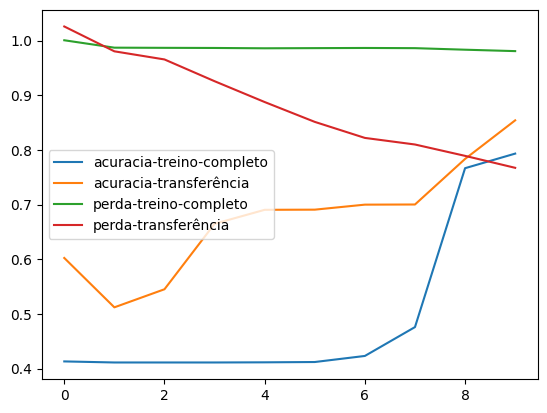

In [ ]:
df_history.plot()

# já acabou
daqui pra baixo é so testes


In [ ]:
import pickle
import gc


import pickle
VERSAO_DS = '_23'

file_data_treino = f'{DIR_RAIZ}/my_data_pars{VERSAO_DS}.txt'
file_data_teste = f'{DIR_RAIZ}/my_data_pars_teste{VERSAO_DS}.txt'
file_data_valid = f'{DIR_RAIZ}/my_data_pars_valid{VERSAO_DS}.txt'

print(file_data_treino,  os.path.isfile(file_data_treino) )
print(file_data_teste, os.path.isfile(file_data_teste) )
print(file_data_valid,  os.path.isfile(file_data_valid) )

def carregar_memoria(file_csv, file_cache, rootpath=""):
    print(file_csv,  os.path.isfile(file_csv) )
    print(file_cache,  os.path.isfile(file_cache) )
    if not os.path.isfile(file_cache)  :
        simular.erro.nese.ponto.para.voce.verificar.se.nao.esta.faltando.carregar.os.arquivios.de.cache()
        my_data = carregar_ds(file_csv, rootpath=rootpath)
        gc.collect()
        f=open(file_cache,"wb")
        pickle.dump(my_data,f)
        print('Gravou no arquivo treino')
        f.close()
    f=open(file_cache,"rb")
    X, Y, Meta = pickle.load(f)
    f.close()
    print('X =',X.shape)
    print('Y =',Y.shape)
    print('Meta =',Meta.shape)
    return X, Y, Meta

print('------')


./UFPR-ALPR//my_data_pars_23.txt True
./UFPR-ALPR//my_data_pars_teste_23.txt True
./UFPR-ALPR//my_data_pars_valid_23.txt True
------


In [ ]:
file_data_valid

'./UFPR-ALPR//my_data_pars_valid_23.txt'

In [ ]:
x_valid, y_valid, m_valid = carregar_memoria(f'{DIR_RAIZ}/data_images/valid/labels.csv', file_data_valid, rootpath=f'{DIR_RAIZ}/data_images/valid')

./UFPR-ALPR//data_images/valid/labels.csv True
./UFPR-ALPR//my_data_pars_valid_23.txt True
X = (1901, 224, 224, 3)
Y = (1901, 4)
Meta = (1901, 11)


In [ ]:
x_train, y_train, m_train = carregar_memoria(f'{DIR_RAIZ}/data_images/train/labels.csv', file_data_treino, rootpath=f'{DIR_RAIZ}/data_images/train')

./UFPR-ALPR//data_images/train/labels.csv True
./UFPR-ALPR//my_data_pars_23.txt True
X = (6270, 224, 224, 3)
Y = (6270, 4)
Meta = (6270, 11)


In [ ]:
x_test, y_test, m_test = carregar_memoria(f'{DIR_RAIZ}/data_images/test/labels.csv', file_data_teste, rootpath=f'{DIR_RAIZ}/data_images/test')

./UFPR-ALPR//data_images/test/labels.csv False
./UFPR-ALPR//my_data_pars_teste_23.txt True
X = (4036, 224, 224, 3)
Y = (4036, 4)
Meta = (4036, 11)


In [ ]:
def separar_por_variacao_tipo(M, X, Y, var="1", vtype="c"):
  train_indx_of_originais   = M.index[(M['variation'] == var) & (M['type']==vtype)  ].tolist()

  return ( X[train_indx_of_originais], Y[train_indx_of_originais] )

dados_teste = []
tipos_variacoes = ["0", "1","2","3","4"]
tipos_veiculos = ["c","m"]
for var in tipos_variacoes:
  for vtype in tipos_veiculos:
    x, y = separar_por_variacao_tipo(m_test, x_test, y_test, var=var, vtype=vtype)
    print(var, vtype, ':' ,x.shape, y.shape)

    dados_teste.append( (var, vtype, x, y) )

0 c : (620, 224, 224, 3) (620, 4)
0 m : (166, 224, 224, 3) (166, 4)
1 c : (630, 224, 224, 3) (630, 4)
1 m : (169, 224, 224, 3) (169, 4)
2 c : (648, 224, 224, 3) (648, 4)
2 m : (164, 224, 224, 3) (164, 4)
3 c : (675, 224, 224, 3) (675, 4)
3 m : (147, 224, 224, 3) (147, 4)
4 c : (662, 224, 224, 3) (662, 4)
4 m : (155, 224, 224, 3) (155, 4)


In [ ]:

# Unir os dados de teste e validação
X = np.concatenate((x_train, x_valid))
Y = np.concatenate((y_train, y_valid))
print('X  =',X.shape)
print('Y  =',Y.shape)


304

In [ ]:
import random
from datetime import datetime
def validar01(model, batch_size=28):
  r1 = model.evaluate(x_valid, y_valid , batch_size=batch_size)
  strRes = f'TODOS      -> {r1}\n'
  for dt in dados_teste:
    var, vtype, x, y = dt
    r1 = model.evaluate(x, y , batch_size=batch_size)
    strRes += f'{var} {vtype} -> {r1}\n'
  print(strRes)

In [ ]:
recall = keras.metrics.Recall()
precision = keras.metrics.Precision()


bIoU = keras.metrics.BinaryIoU(    target_class_ids=[0], threshold=0.5, name='iou', dtype=None
)


In [ ]:
m = keras.metrics.BinaryIoU(target_class_ids=[0], threshold=0.5)
m.result()
0.33333334

0.33333334

In [ ]:
len(model.layers)

159

## tamtamtam

In [ ]:
batch_size = 28
import random
from datetime import datetime
def avaliar(model, f_model2, batch_size=28):
  r1 = model.evaluate(x_test, y_test , batch_size=batch_size)
  print(f'TODOS      -> acurracia: {r1[1]} ; loss: {r1[0]}')

  print(f'[*] {f_model2}')

def get_functions( lr=1e-5):
  floss = MGIoULoss(bounding_box_format = "XYXY", mult=224)
  #             Nadam
  return floss, Nadam(learning_rate=lr)

model, accuracy_t, loss_t = None, 0, None
idx = randint(15000,30000)
f_model = f'./model___p1_{idx}.keras'
f_model2 = f'./model__p2_{idx}.keras'
seed = 1
#                               lr= 1e-4
floss, otimizador = get_functions(lr=1e-4)

# complie model
model = get_modelo()
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])

early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)

hist_train = model.fit(x=X, y=Y, batch_size=batch_size, epochs=200,
                        validation_split=0.30, callbacks=[early_stop])

model.save(f_model)
losses_3 = pd.DataFrame(model.history.history)

print(f_model)
avaliar(model, f_model)
# model = None
gc.collect()

# model = tf.keras.models.load_model(f_model)
# fine-tuning
for layer in model.layers:
    layer.trainable = True

floss, otimizador = get_functions(lr=1e-6)
# complie model
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])
early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1, min_delta=0.0015)

hist_train = model.fit(x=X, y=Y, validation_split=0.30,  batch_size=batch_size, epochs=20, callbacks=[early_stop])

accuracy_f = hist_train.history['accuracy'][-1]
loss_f = hist_train.history['loss'][-1]
print(f'[*] f_model2 {accuracy_f} {loss_f}')
model.save(f_model2)

losses_4 = pd.DataFrame(model.history.history)
print(f_model2)
avaliar(model, f_model2)
# ------
torch.cuda.empty_cache()
gc.collect()




Epoch 1/200
135/135 [==============================] - 17s 41ms/step - loss: 1.0698 - accuracy: 0.6908 - val_loss: 0.9894 - val_accuracy: 0.7451
Epoch 2/200
135/135 [==============================] - 3s 22ms/step - loss: 0.9868 - accuracy: 0.6437 - val_loss: 0.9910 - val_accuracy: 0.6870
Epoch 3/200
135/135 [==============================] - 3s 22ms/step - loss: 0.9853 - accuracy: 0.5614 - val_loss: 0.9879 - val_accuracy: 0.6420
Epoch 4/200
135/135 [==============================] - 3s 22ms/step - loss: 0.9828 - accuracy: 0.6813 - val_loss: 0.9877 - val_accuracy: 0.7895
Epoch 5/200
135/135 [==============================] - 3s 22ms/step - loss: 0.9813 - accuracy: 0.7665 - val_loss: 0.9826 - val_accuracy: 0.8623
Epoch 6/200
135/135 [==============================] - 3s 22ms/step - loss: 0.9782 - accuracy: 0.8004 - val_loss: 0.9855 - val_accuracy: 0.8389
Epoch 7/200
135/135 [==============================] - 3s 22ms/step - loss: 0.9752 - accuracy: 0.7906 - val_loss: 0.9954 - val_accuracy

NameError: name 'torch' is not defined

In [ ]:
batch_size = 28

def get_functions( lr=1e-5):
  floss = MGIoULoss(bounding_box_format = "XYXY", mult=224)
  #             Nadam
  return floss, Nadam(learning_rate=lr)

model, accuracy_t, loss_t = None, 0, None
idx = randint(15000,30000)
f_model = f'./model___p1_{idx}.keras'
f_model2 = f'./model__p2_{idx}.keras'
seed = 1
#                               lr= 1e-4
floss, otimizador = get_functions(lr=1e-4)

# complie model
model = get_modelo()
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])

early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)

hist_train = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=50,
                        validation_data=(x_valid, y_valid), callbacks=[early_stop])

# model = None
gc.collect()
c_layer = 0
for layer in model.layers:
    layer.trainable = c_layer>149
    c_layer +=1
early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)
floss, otimizador = get_functions(lr=1e-5)
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])
hist_train = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=50,
                         validation_data=(x_valid, y_valid), callbacks=[early_stop])
avaliar(model, f_model2)
# model = tf.keras.models.load_model(f_model)
# fine-tuning
for layer in model.layers:
    layer.trainable = True

floss, otimizador = get_functions(lr=1e-6)
# complie model
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy'])
early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1, min_delta=0.0015)

hist_train = model.fit(x=x_train, y=y_train, validation_data=(x_valid, y_valid),  batch_size=batch_size, epochs=20, callbacks=[early_stop])

accuracy_f = hist_train.history['accuracy'][-1]
loss_f = hist_train.history['loss'][-1]
print(f'[*] f_model2 {accuracy_f} {loss_f}')
model.save(f_model2)

losses_4 = pd.DataFrame(model.history.history)
print(f_model2)
avaliar(model, f_model2)
# ------
torch.cuda.empty_cache()
gc.collect()




Epoch 1/50
129/129 [==============================] - 11s 40ms/step - loss: 1.0002 - accuracy: 0.6001 - val_loss: 0.9889 - val_accuracy: 0.6017
Epoch 2/50
129/129 [==============================] - 3s 24ms/step - loss: 0.9885 - accuracy: 0.6237 - val_loss: 0.9879 - val_accuracy: 0.6928
Epoch 3/50
129/129 [==============================] - 3s 23ms/step - loss: 0.9868 - accuracy: 0.5948 - val_loss: 0.9827 - val_accuracy: 0.6339
Epoch 4/50
129/129 [==============================] - 3s 23ms/step - loss: 0.9858 - accuracy: 0.6434 - val_loss: 0.9850 - val_accuracy: 0.6833
Epoch 5/50
129/129 [==============================] - 3s 23ms/step - loss: 0.9744 - accuracy: 0.6848 - val_loss: 0.9725 - val_accuracy: 0.7211
Epoch 6/50
129/129 [==============================] - 3s 24ms/step - loss: 0.9438 - accuracy: 0.7896 - val_loss: 0.9479 - val_accuracy: 0.8022
Epoch 7/50
129/129 [==============================] - 3s 23ms/step - loss: 0.9056 - accuracy: 0.8260 - val_loss: 0.9941 - val_accuracy: 0.787

3807

159

## tam tam tam *2*

In [ ]:
import torch
model = None
torch.cuda.empty_cache()
gc.collect()


bIoU = keras.metrics.BinaryIoU(    target_class_ids=[0], threshold=0.5, name='iou', dtype=None
)
batch_size = 18

def get_functions( lr=1e-4):
  floss = MGIoULoss(bounding_box_format = "XYXY", mult=224)
  return floss, Nadam(learning_rate=lr)

model, accuracy_t, loss_t = None, 0, None
idx = randint(15000,30000)



floss, otimizador = get_functions(lr=1e-4)

# complie model
model = get_modelo()
model.compile(loss=floss,optimizer=otimizador, metrics=['accuracy', bIoU])

early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)

hist_train = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=100,
                        validation_data=(x_valid, y_valid), callbacks=[early_stop])

# ----------------
model_name1 = f'./model___xxt_01_{idx}.keras'
model.save(model_name1)
print(model_name1)
print("------------------")

# ----------------
count_leyer = 0
for layer in model.layers:
    layer.trainable = count_leyer > 145
    count_leyer +=1

floss, otimizador = get_functions(lr=1e-6)
model.compile(loss=floss,optimizer=otimizador, metrics=["accuracy"])
early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)
hist_train2 = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=10,
                        validation_data=(x_valid, y_valid), callbacks=[early_stop])

model_name2 = f'./model___xxt_02_{idx}.keras'
model.save(model_name2)
print(model_name2)
# --------------

print("------------------")

# ----------------
count_leyer = 0
for layer in model.layers:
    layer.trainable = True
    count_leyer +=1

floss, otimizador = get_functions(lr=1e-7)
model.compile(loss=floss,optimizer=otimizador, metrics=["accuracy"])
early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)
hist_train3 = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=10,
                        validation_data=(x_valid, y_valid), callbacks=[early_stop])
model_name3 = f'./model___xxt_03_{idx}.keras'
model.save(model_name3)
print(model_name3)
# --------------

validar01(model, batch_size=batch_size)
gc.collect()


# # fine-tuning
# for layer in model.layers:
#     layer.trainable = True

# floss, otimizador = get_functions(lr=5e-7)
# # complie model
# model.compile(loss=floss,optimizer=otimizador, metrics=["accuracy"])

# early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)
# # hist_train = model.fit(x=X, y=Y, validation_data=(x_valid, y_valid),  batch_size=batch_size, epochs=10)
# hist_train = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=15,
#                         validation_data=(x_valid, y_valid), callbacks=[early_stop])

# validar01(model, batch_size=batch_size)




Epoch 1/100
349/349 [==============================] - 16s 31ms/step - loss: 1.0499 - accuracy: 0.4041 - iou: 0.6680 - val_loss: 0.9883 - val_accuracy: 0.3924 - val_iou: 0.6806
Epoch 2/100
349/349 [==============================] - 8s 24ms/step - loss: 0.9894 - accuracy: 0.5451 - iou: 0.6870 - val_loss: 0.9767 - val_accuracy: 0.6881 - val_iou: 0.7873
Epoch 3/100
349/349 [==============================] - 8s 24ms/step - loss: 0.9753 - accuracy: 0.6306 - iou: 0.8702 - val_loss: 0.9652 - val_accuracy: 0.6975 - val_iou: 0.9809
Epoch 4/100
349/349 [==============================] - 8s 24ms/step - loss: 0.9503 - accuracy: 0.6761 - iou: 0.9578 - val_loss: 0.9731 - val_accuracy: 0.6686 - val_iou: 0.9684
Epoch 5/100
349/349 [==============================] - 8s 24ms/step - loss: 0.8921 - accuracy: 0.6856 - iou: 0.9652 - val_loss: 0.9377 - val_accuracy: 0.7512 - val_iou: 0.9949
Epoch 6/100
349/349 [==============================] - 8s 24ms/step - loss: 0.8353 - accuracy: 0.6973 - iou: 0.9788 - v

48728

In [ ]:
model = tf.keras.models.load_model('./model___xxt_01_29632.keras')
validar01(model, batch_size=15)
model = tf.keras.models.load_model('./model___xxt_02_29632.keras')
validar01(model, batch_size=15)
model = tf.keras.models.load_model('./model___xxt_03_29632.keras')
validar01(model, batch_size=15)

11/11 [==============================] - 0s 15ms/step - loss: 0.9047 - accuracy: 1.0000 - iou: 1.0000
TODOS      -> [1.0863616466522217, 0.9053130149841309, 1.0]
0 c -> [1.5923479795455933, 0.9338709712028503, 1.0]
0 m -> [1.6815959215164185, 0.7228915691375732, 1.0]
1 c -> [1.5324695110321045, 0.9539682269096375, 1.0]
1 m -> [1.5971499681472778, 0.9940828680992126, 1.0]
2 c -> [0.7045403718948364, 0.959876537322998, 1.0]
2 m -> [0.9400612711906433, 0.8109756112098694, 1.0]
3 c -> [0.8367050290107727, 0.8325926065444946, 1.0]
3 m -> [0.8658657670021057, 0.9863945841789246, 1.0]
4 c -> [0.8042144179344177, 0.9909365773200989, 1.0]
4 m -> [0.9046786427497864, 1.0, 1.0]

11/11 [==============================] - 0s 13ms/step - loss: 1.0609 - accuracy: 1.0000
TODOS      -> [0.9445393681526184, 0.9195160269737244]
0 c -> [1.1613861322402954, 0.9564515948295593]
0 m -> [1.1889714002609253, 0.7228915691375732]
1 c -> [1.23263680934906, 0.9476190209388733]
1 m -> [1.2397254705429077, 0.98816567

In [ ]:
import torch
model = None
torch.cuda.empty_cache()
gc.collect()
batch_size = 14

model = tf.keras.models.load_model('./model___xxt_01_29632.keras')

# ----------------
count_leyer = 0
for layer in model.layers:
    layer.trainable = count_leyer > 145
    count_leyer +=1

floss, otimizador = get_functions(lr=1e-6)
model.compile(loss=floss,optimizer=otimizador, metrics=["accuracy"])
early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)
hist_train2 = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=50,
                        validation_data=(x_valid, y_valid), callbacks=[early_stop])

model_name2 = f'./model___xxt_02_3_29632.keras'
model.save(model_name2)
print(model_name2)
# --------------


validar01(model, batch_size=15)

Epoch 1/50
448/448 [==============================] - 22s 31ms/step - loss: 1.2507 - accuracy: 0.9250 - val_loss: 0.9982 - val_accuracy: 0.8969
Epoch 2/50
448/448 [==============================] - 11s 24ms/step - loss: 0.8777 - accuracy: 0.9604 - val_loss: 0.9712 - val_accuracy: 0.9148
Epoch 3/50
448/448 [==============================] - 10s 23ms/step - loss: 0.7945 - accuracy: 0.9663 - val_loss: 0.9708 - val_accuracy: 0.9190
Epoch 4/50
448/448 [==============================] - 10s 21ms/step - loss: 0.7469 - accuracy: 0.9713 - val_loss: 0.9629 - val_accuracy: 0.9169
Epoch 5/50
448/448 [==============================] - 9s 21ms/step - loss: 0.7125 - accuracy: 0.9746 - val_loss: 0.9556 - val_accuracy: 0.9179
Epoch 6/50
448/448 [==============================] - 9s 21ms/step - loss: 0.6947 - accuracy: 0.9761 - val_loss: 0.9546 - val_accuracy: 0.9216
Epoch 7/50
448/448 [==============================] - 9s 21ms/step - loss: 0.6769 - accuracy: 0.9762 - val_loss: 0.9548 - val_accuracy: 0.

In [ ]:

model = tf.keras.models.load_model('./model___xxt_02_29632.keras')
validar01(model, batch_size=15)
model = tf.keras.models.load_model('./model___xxt_02_2_29632.keras')
validar01(model, batch_size=15)
model = tf.keras.models.load_model('./model___xxt_02_3_29632.keras')
validar01(model, batch_size=15)

11/11 [==============================] - 0s 12ms/step - loss: 1.0609 - accuracy: 1.0000
TODOS      -> [0.9445393681526184, 0.9195160269737244]
0 c -> [1.1613861322402954, 0.9564515948295593]
0 m -> [1.1889714002609253, 0.7228915691375732]
1 c -> [1.23263680934906, 0.9476190209388733]
1 m -> [1.2397254705429077, 0.9881656765937805]
2 c -> [0.7176891565322876, 0.9614197611808777]
2 m -> [0.9132142663002014, 0.8170731663703918]
3 c -> [0.7648947238922119, 0.8518518805503845]
3 m -> [0.8798359036445618, 0.9863945841789246]
4 c -> [0.7976593971252441, 0.9803625345230103]
4 m -> [1.0608515739440918, 1.0]

11/11 [==============================] - 0s 12ms/step - loss: 1.0327 - accuracy: 1.0000
TODOS      -> [0.934593915939331, 0.9226722717285156]
0 c -> [1.1368913650512695, 0.9532257914543152]
0 m -> [1.1473654508590698, 0.7469879388809204]
1 c -> [1.1993532180786133, 0.9492063522338867]
1 m -> [1.2101376056671143, 0.9881656765937805]
2 c -> [0.7085058689117432, 0.9614197611808777]
2 m -> [0.8

In [ ]:
import torch
model = None
torch.cuda.empty_cache()
gc.collect()
batch_size = 14

model = tf.keras.models.load_model('./model___xxt_02_3_29632.keras')

# ----------------
count_leyer = 0
for layer in model.layers:
    layer.trainable = count_leyer > 50
    count_leyer +=1

floss, otimizador = get_functions(lr=16e-7)
model.compile(loss=floss,optimizer=otimizador, metrics=["accuracy"])
early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)
hist_train2 = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=50,
                        validation_data=(x_valid, y_valid), callbacks=[early_stop])

model_name2 = f'./model___xxt_03_1_29632.keras'
model.save(model_name2)
print(model_name2)
# --------------


validar01(model, batch_size=15)

Epoch 1/50
448/448 [==============================] - 51s 46ms/step - loss: 0.9661 - accuracy: 0.9287 - val_loss: 0.8757 - val_accuracy: 0.9232
Epoch 2/50
448/448 [==============================] - 18s 39ms/step - loss: 0.8538 - accuracy: 0.9327 - val_loss: 0.8728 - val_accuracy: 0.9190
Epoch 3/50
448/448 [==============================] - 18s 41ms/step - loss: 0.8033 - accuracy: 0.9448 - val_loss: 0.8786 - val_accuracy: 0.9200
Epoch 4/50
448/448 [==============================] - 17s 39ms/step - loss: 0.7675 - accuracy: 0.9542 - val_loss: 0.8857 - val_accuracy: 0.9179
Epoch 5/50
448/448 [==============================] - 17s 38ms/step - loss: 0.7411 - accuracy: 0.9558 - val_loss: 0.8728 - val_accuracy: 0.9158
Epoch 6/50
448/448 [==============================] - 17s 37ms/step - loss: 0.7272 - accuracy: 0.9555 - val_loss: 0.8807 - val_accuracy: 0.9137
Epoch 7/50
448/448 [==============================] - 17s 38ms/step - loss: 0.7123 - accuracy: 0.9587 - val_loss: 0.8745 - val_accuracy:

In [ ]:
validar01(model, batch_size=15)

11/11 [==============================] - 0s 13ms/step - loss: 5.8594 - accuracy: 0.0000e+00
TODOS      -> [1.326434850692749, 0.5334034562110901]

0 c -> [0.9997560381889343, 0.875806450843811]

0 m -> [1.065340280532837, 0.7831325531005859]

1 c -> [1.0004222393035889, 0.09365079551935196]

1 m -> [1.0007966756820679, 0.17751479148864746]

2 c -> [0.9787511229515076, 0.7638888955116272]

2 m -> [6.6054863929748535, 0.0]

3 c -> [0.9811829924583435, 0.25333333015441895]

3 m -> [0.9964380860328674, 0.49659863114356995]

4 c -> [0.9828017354011536, 0.9063444137573242]

4 m -> [5.859415054321289, 0.0]



In [ ]:
bIoU = keras.metrics.BinaryIoU(    target_class_ids=[0], threshold=0.7, name='iou', dtype=None)


batch_size = 12

def get_functions( lr=1e-4):
  floss = MGIoULoss(bounding_box_format = "XYXY", mult=224)
  return floss, Nadam(learning_rate=lr)

model, accuracy_t, loss_t = None, 0, None
idx = randint(15000,30000)

floss, otimizador = get_functions(lr=1e-4)

# complie model
model = get_modelo()
model.compile(loss=floss,optimizer=otimizador, metrics=[recall, precision, bIoU])
early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)
hist_train = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=100,
                        validation_split=0.2, callbacks=[early_stop])
losses_1 = pd.DataFrame(model.history.history)

validar01(model, batch_size=batch_size)
gc.collect()

# fine-tuning
for layer in model.layers:
    layer.trainable = True

floss, otimizador = get_functions(lr=5e-7)
# complie model
model.compile(loss=floss,optimizer=otimizador, metrics=[recall, precision, bIoU])

early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)
# hist_train = model.fit(x=X, y=Y, validation_split=0.2,  batch_size=batch_size, epochs=10)
hist_train = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=10,
                        validation_split=0.2, callbacks=[early_stop])

validar01(model, batch_size=batch_size)




Epoch 1/100
418/418 [==============================] - 12s 19ms/step - loss: 2.0331 - recall_1: 0.3105 - precision_1: 1.0000 - iou: 0.9007 - val_loss: 0.9894 - val_recall_1: 0.3589 - val_precision_1: 1.0000 - val_iou: 0.9031
Epoch 2/100
418/418 [==============================] - 5s 13ms/step - loss: 0.9909 - recall_1: 0.3084 - precision_1: 1.0000 - iou: 0.9066 - val_loss: 0.9880 - val_recall_1: 0.2793 - val_precision_1: 1.0000 - val_iou: 0.9456
Epoch 3/100
418/418 [==============================] - 5s 13ms/step - loss: 0.9917 - recall_1: 0.3530 - precision_1: 1.0000 - iou: 0.8433 - val_loss: 0.9913 - val_recall_1: 0.4548 - val_precision_1: 1.0000 - val_iou: 0.7646
Epoch 4/100
418/418 [==============================] - 5s 13ms/step - loss: 0.9912 - recall_1: 0.3579 - precision_1: 1.0000 - iou: 0.8312 - val_loss: 0.9867 - val_recall_1: 0.3055 - val_precision_1: 1.0000 - val_iou: 0.8991
Epoch 5/100
418/418 [==============================] - 5s 13ms/step - loss: 0.9871 - recall_1: 0.2751 -

In [ ]:
model.save(f'./model___xxt_02.keras')

In [ ]:
bIoU = keras.metrics.BinaryIoU(    target_class_ids=[0], threshold=0.6, name='iou', dtype=None)


batch_size = 12

def get_functions( lr=1e-4):
  floss = MGIoULoss(bounding_box_format = "XYXY", mult=224)
  return floss, Nadam(learning_rate=lr)

model, accuracy_t, loss_t = None, 0, None
idx = randint(15000,30000)

floss, otimizador = get_functions(lr=1e-4)

# complie model
model = get_modelo()
model.compile(loss=floss,optimizer=otimizador, metrics=[recall, precision, bIoU])
early_stop = EarlyStopping(monitor='iou',patience=3,verbose=1)
hist_train = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=100,
                        validation_split=0.2, callbacks=[early_stop])
losses_1 = pd.DataFrame(model.history.history)

validar01(model, batch_size=batch_size)
gc.collect()

# fine-tuning
for layer in model.layers:
    layer.trainable = True

floss, otimizador = get_functions(lr=5e-7)
# complie model
model.compile(loss=floss,optimizer=otimizador, metrics=[recall, precision, bIoU])

early_stop = EarlyStopping(monitor='iou',patience=3,verbose=1)
# hist_train = model.fit(x=X, y=Y, validation_split=0.2,  batch_size=batch_size, epochs=10)
hist_train = model.fit(x=x_train, y=y_train, batch_size=batch_size, epochs=10,
                        validation_split=0.2, callbacks=[early_stop])

validar01(model, batch_size=batch_size)




Epoch 1/100
418/418 [==============================] - 12s 18ms/step - loss: 1.0010 - recall_1: 0.4849 - precision_1: 1.0000 - iou: 0.5043 - val_loss: 0.9968 - val_recall_1: 0.5018 - val_precision_1: 1.0000 - val_iou: 0.5000
Epoch 2/100
418/418 [==============================] - 5s 13ms/step - loss: 0.9967 - recall_1: 0.5017 - precision_1: 1.0000 - iou: 0.5000 - val_loss: 0.9968 - val_recall_1: 0.5018 - val_precision_1: 1.0000 - val_iou: 0.5000
Epoch 3/100
418/418 [==============================] - 5s 13ms/step - loss: 0.9965 - recall_1: 0.5016 - precision_1: 1.0000 - iou: 0.5000 - val_loss: 0.9968 - val_recall_1: 0.5018 - val_precision_1: 1.0000 - val_iou: 0.5000
Epoch 4/100
418/418 [==============================] - 5s 13ms/step - loss: 0.9965 - recall_1: 0.5016 - precision_1: 1.0000 - iou: 0.5000 - val_loss: 0.9968 - val_recall_1: 0.5018 - val_precision_1: 1.0000 - val_iou: 0.5000
Epoch 5/100
418/418 [==============================] - 5s 13ms/step - loss: 0.9965 - recall_1: 0.5016 -

In [ ]:

import matplotlib.pyplot as plt

def show_predict(img, predict=None, verdade=None, normalizar=False, pincel = 1):
    img = img.copy()
    print('**', predict, normalizar)
    h,w,d = img.shape
    mhw = max(h,w)
    if( predict is not None):
        if(normalizar):
            predict = [int(float(predict[0]) * mhw), int(float(predict[1])*mhw), int(float(predict[2])*mhw), int(float(predict[3])*mhw)]
        else:
            predict = [int(predict[0]  ), int(predict[1] ), int(predict[2] ), int(predict[3] )]
        print(img.shape)

        p1 = (predict[0], predict[1])#x_min, y_min
        p2 = (predict[2], predict[3])#x_max, y_maz

        print('=',p1, p2)
        cv2.rectangle(img,p1, p2,(255,0,0),pincel)
    if( verdade is not None):
        if(normalizar):
            verdade = [int(verdade[0] * mhw), int(verdade[1]*mhw), int(verdade[2]*mhw), int(verdade[3]*mhw)]
        else:
            verdade = [int(verdade[0]  ), int(verdade[1] ), int(verdade[2] ), int(verdade[3] )]
        print(img.shape)

        p1 = (verdade[0], verdade[1])#x_min, y_min
        p2 = (verdade[2], verdade[3])#x_max, y_maz

        print('=',p1, p2)
        cv2.rectangle(img,p1, p2,(0,255,0),pincel)

    plt.figure(figsize=(10,10))
    plt.imshow(img)

    plt.show()

In [ ]:
m_train.loc[0]


type                           c
variation                      0
imgfile      track0009[19]_1.png
xmin                         166
ymin                          95
xmax                         185
ymax                         102
nxmin         0.1729166666666666
nymin         0.0879629629629629
nxmax         0.1927083333333333
nymax         0.0944444444444444
Name: 0, dtype: object

['0.4107142857142857', '0.2366071428571428', '0.4598214285714285', '0.2544642857142857']
** ['0.4107142857142857', '0.2366071428571428', '0.4598214285714285', '0.2544642857142857'] True
(224, 224, 3)
= (92, 52) (102, 57)


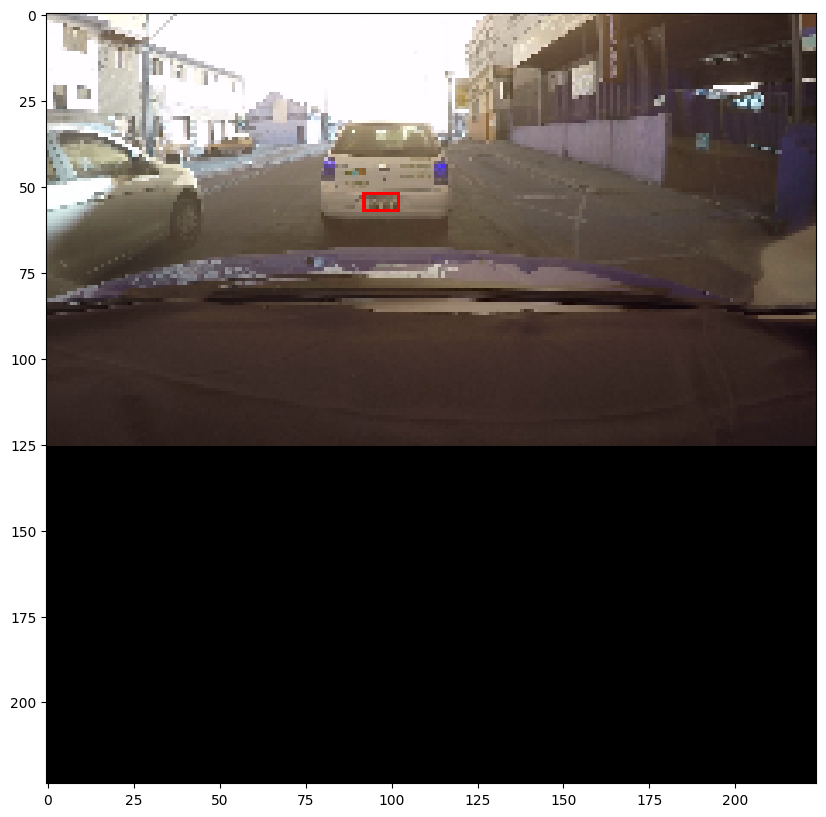

['0.5401785714285714', '0.2366071428571428', '0.5848214285714286', '0.2544642857142857']
** ['0.5401785714285714', '0.2366071428571428', '0.5848214285714286', '0.2544642857142857'] True
(224, 224, 3)
= (121, 52) (131, 57)


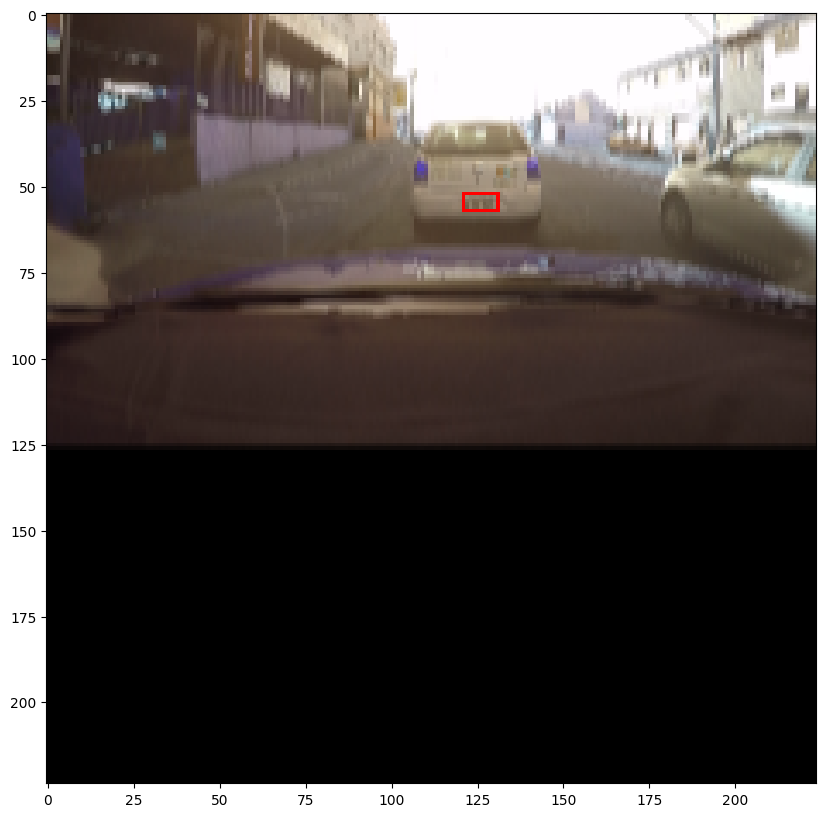

['0.3883928571428571', '0.6339285714285714', '0.5982142857142857', '0.7098214285714286']
** ['0.3883928571428571', '0.6339285714285714', '0.5982142857142857', '0.7098214285714286'] True
(224, 224, 3)
= (86, 142) (134, 159)


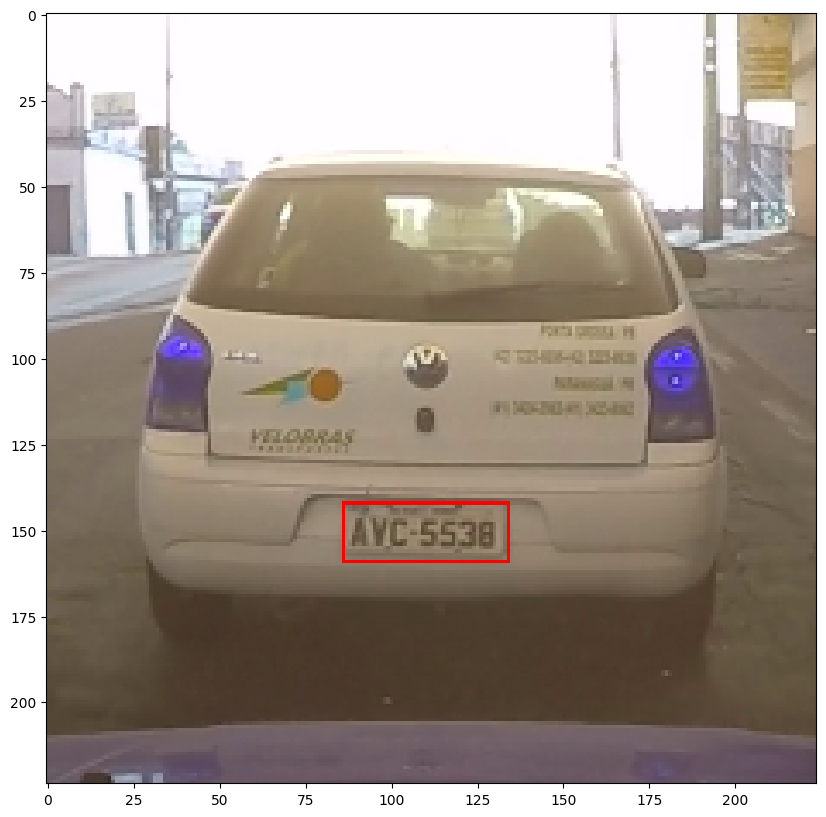

['0.4017857142857143', '0.6339285714285714', '0.6071428571428571', '0.7098214285714286']
** ['0.4017857142857143', '0.6339285714285714', '0.6071428571428571', '0.7098214285714286'] True
(224, 224, 3)
= (90, 142) (136, 159)


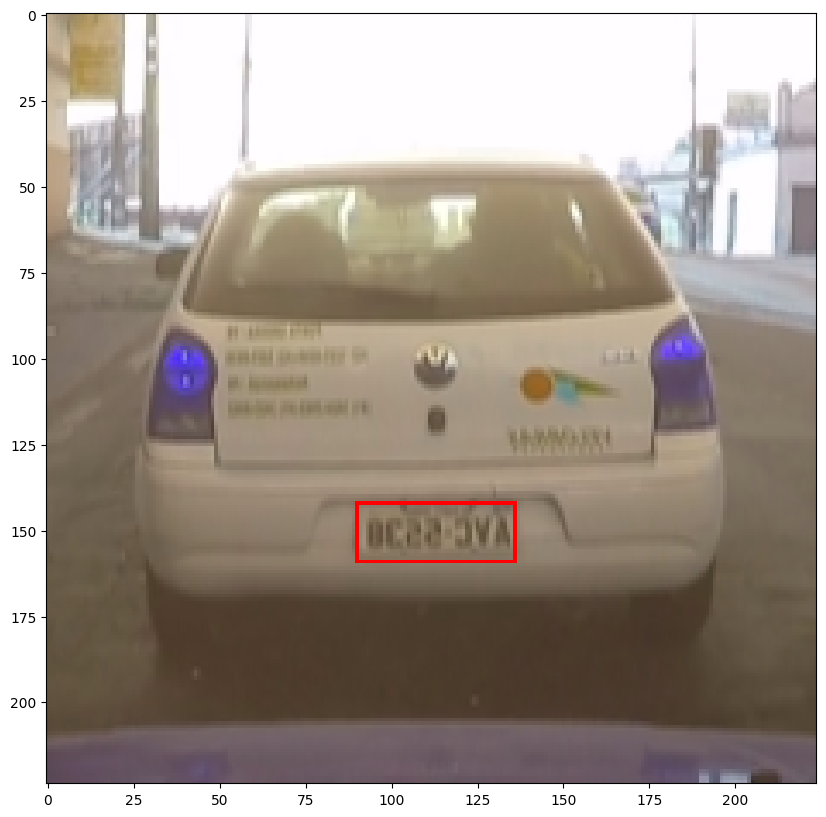

['0.4107142857142857', '0.2366071428571428', '0.4598214285714285', '0.2544642857142857']
** ['0.4107142857142857', '0.2366071428571428', '0.4598214285714285', '0.2544642857142857'] True
(224, 224, 3)
= (92, 52) (102, 57)


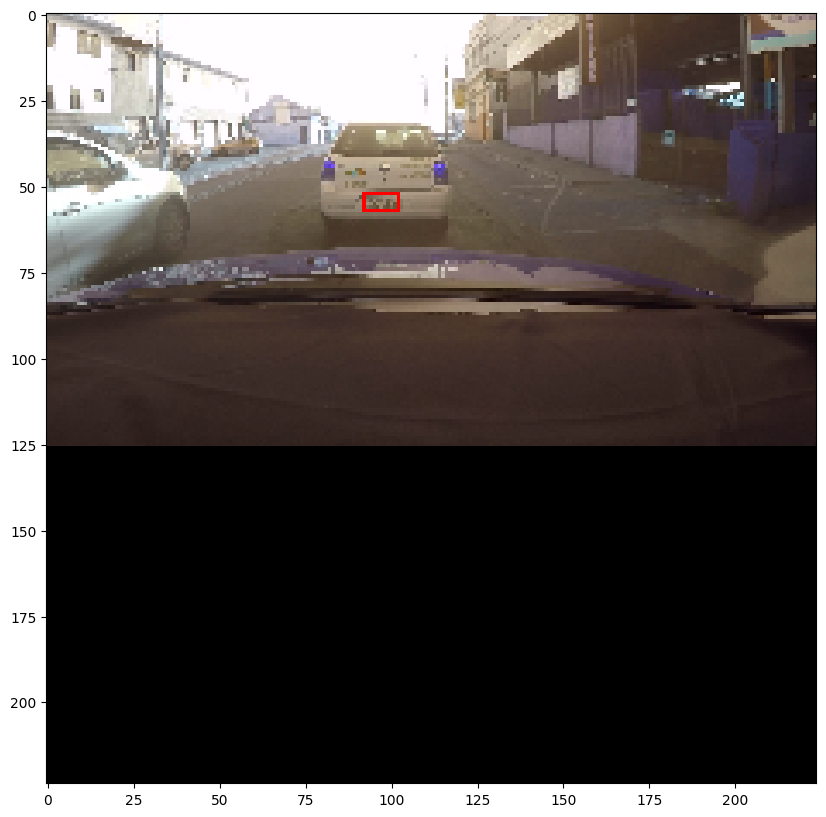

['0.5401785714285714', '0.2366071428571428', '0.5848214285714286', '0.2544642857142857']
** ['0.5401785714285714', '0.2366071428571428', '0.5848214285714286', '0.2544642857142857'] True
(224, 224, 3)
= (121, 52) (131, 57)


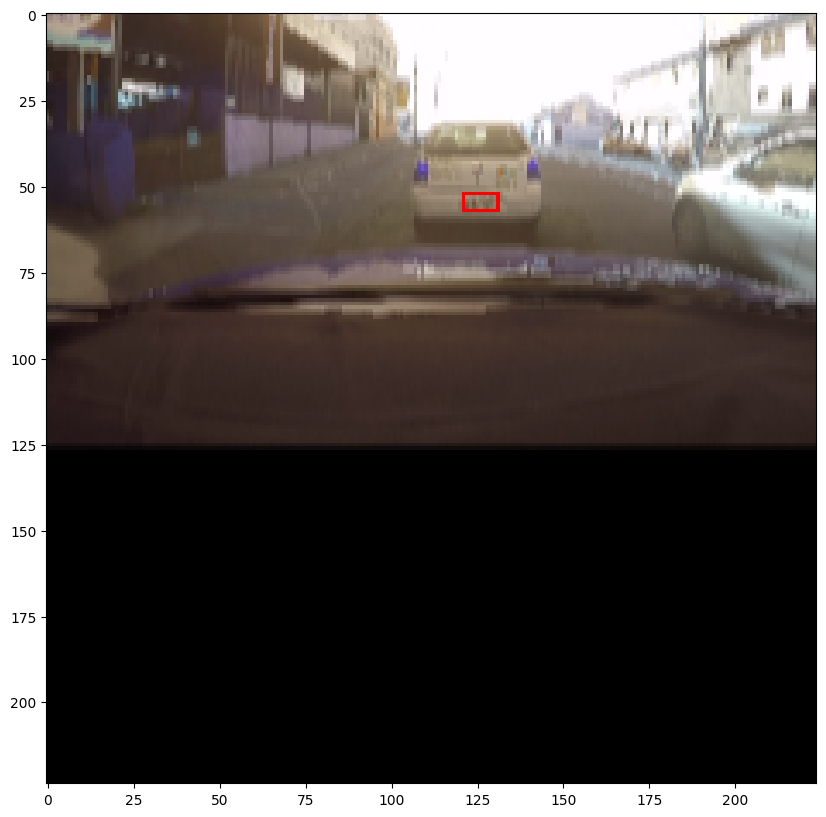

['0.3839285714285714', '0.6294642857142857', '0.6026785714285714', '0.7053571428571429']
** ['0.3839285714285714', '0.6294642857142857', '0.6026785714285714', '0.7053571428571429'] True
(224, 224, 3)
= (86, 141) (135, 158)


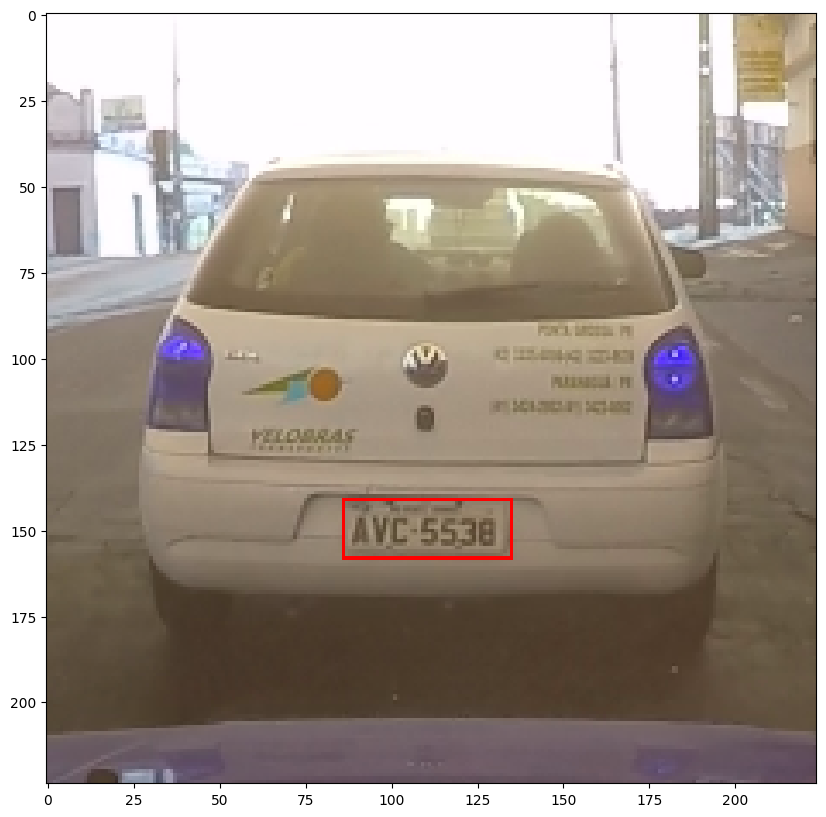

['0.3973214285714285', '0.6294642857142857', '0.6116071428571429', '0.7053571428571429']
** ['0.3973214285714285', '0.6294642857142857', '0.6116071428571429', '0.7053571428571429'] True
(224, 224, 3)
= (88, 141) (137, 158)


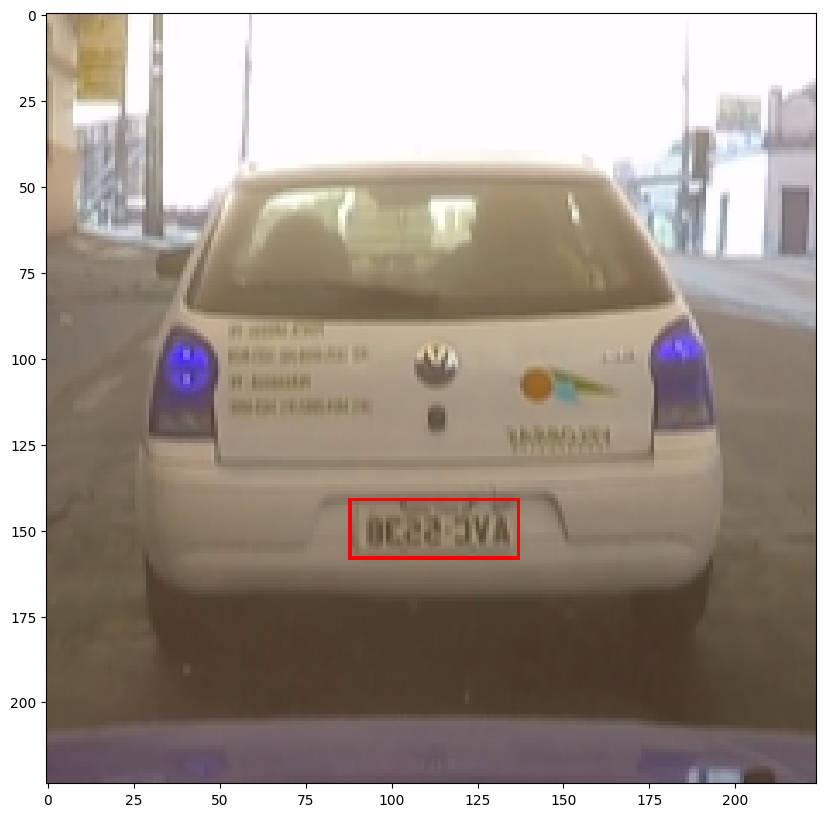

['0.4151785714285714', '0.2410714285714285', '0.4642857142857143', '0.2589285714285714']
** ['0.4151785714285714', '0.2410714285714285', '0.4642857142857143', '0.2589285714285714'] True
(224, 224, 3)
= (93, 53) (104, 57)


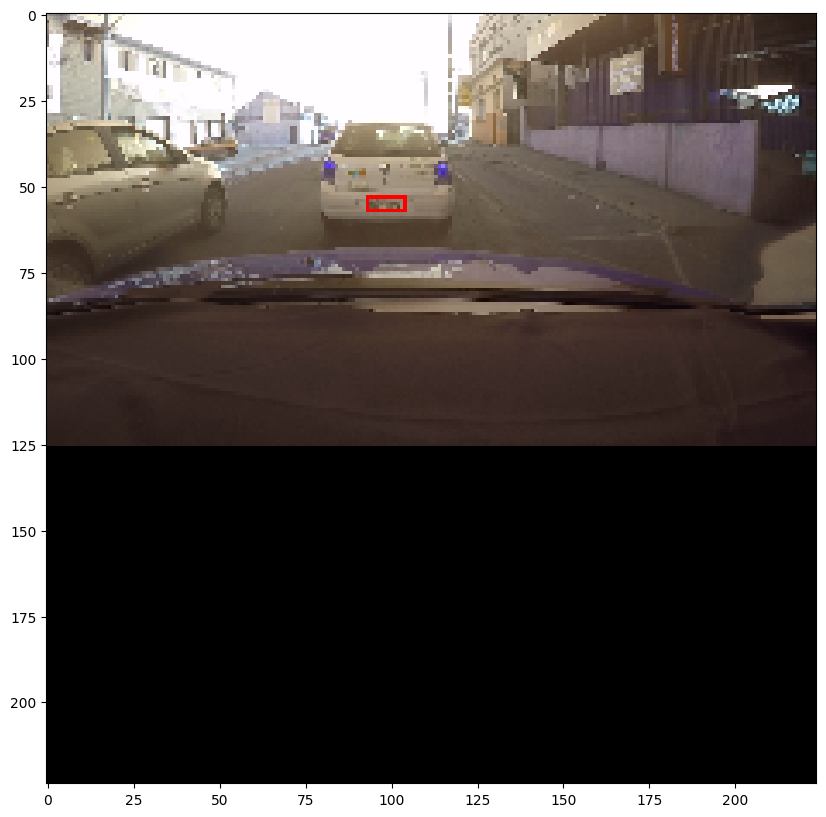

['0.5357142857142857', '0.2410714285714285', '0.5803571428571429', '0.2589285714285714']
** ['0.5357142857142857', '0.2410714285714285', '0.5803571428571429', '0.2589285714285714'] True
(224, 224, 3)
= (120, 53) (130, 57)


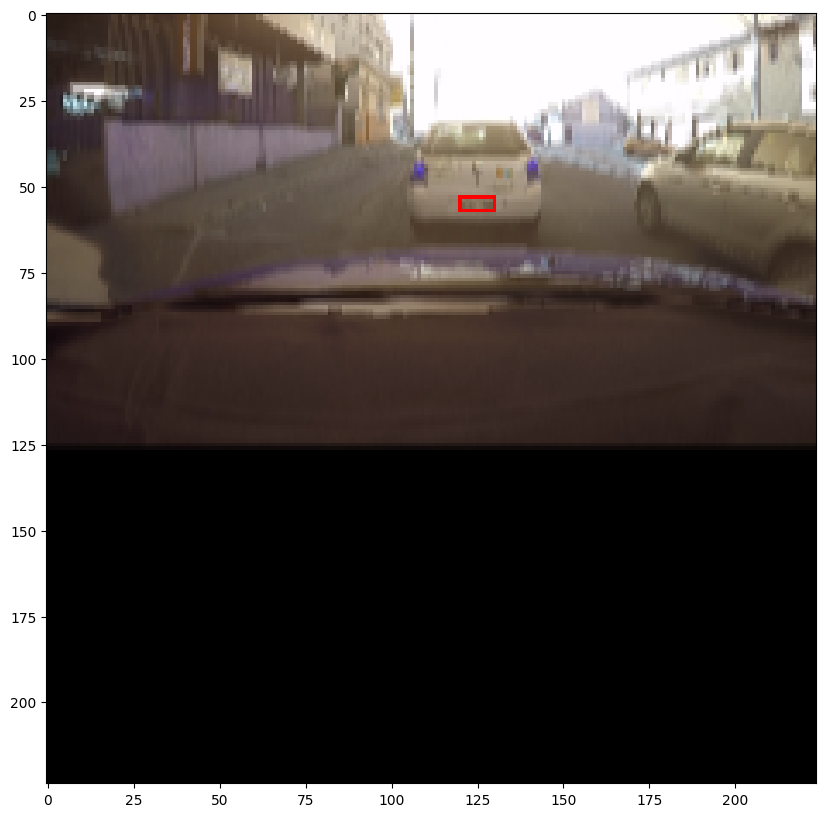

In [ ]:

for i in range(0,10):
  file = m_train.loc[i]['imgfile']
  file = f'{DIR_RAIZ}data_images/train/{file}'
  x1,y1,x2,y2 = m_train.loc[i]['nxmin'], m_train.loc[i]['nymin'], m_train.loc[i]['nxmax'], m_train.loc[i]['nymax']
  print([x1,y1, x2, y2])
  show_predict(cv2.imread(file), predict=[x1,y1, x2, y2], normalizar=True, pincel=1)

In [ ]:

iou =  keras.metrics.BinaryIoU(  target_class_ids=[0])
recall = keras.metrics.Recall()
precision = keras.metrics.Precision()

In [ ]:
batch_size = 28

def get_functions( lr=1e-5):
  floss = MGIoULoss(bounding_box_format = "XYXY", mult=224)
  #             Nadam
  return floss, Adam(learning_rate=lr)

model, accuracy_t, loss_t = None, 0, None
idx = randint(15000,30000)
f_model = f'./model___p1_{idx}.keras'
f_model2 = f'./model__p2_{idx}.keras'
seed = 1
#                               lr= 1e-4
floss, otimizador = get_functions(lr=1e-4)

# complie model
model = get_modelo()
model.compile(loss=floss,optimizer=otimizador, metrics=[recall, precision])

early_stop = EarlyStopping(monitor='loss',patience=3,verbose=1)

hist_train = model.fit(x=X, y=Y, batch_size=batch_size, epochs=200,
                        validation_split=0.30, callbacks=[early_stop])

model.save(f_model)
losses_3 = pd.DataFrame(model.history.history)

print(f_model)
avaliar(model, f_model)


InternalError: Failed copying input tensor from /job:localhost/replica:0/task:0/device:CPU:0 to /job:localhost/replica:0/task:0/device:GPU:0 in order to run _EagerConst: Dst tensor is not initialized.